<a href="https://colab.research.google.com/github/agathepetillot/Disappearing-Islands/blob/main/AnalysingSeaLevels.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Load Packages

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# !pip install keras-tuner
# !pip install scipy
# !pip install pandas statsmodels skforecast
# !pip install keras
# !pip install pmdarima
# ! pip install numpy==1.23.5
# ! pip install scikeras
# !pip install sktime==0.15.0
# ! pip install tensorflow==2.10.1

In [3]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, RobustScaler
from sktime.forecasting.model_selection import temporal_train_test_split, ForecastingRandomizedSearchCV, SingleWindowSplitter
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.compose import make_reduction, TransformedTargetForecaster
from sktime.utils.plotting import plot_series
from sktime.performance_metrics.forecasting import mean_absolute_percentage_error
from sktime.transformations.series.detrend import Deseasonalizer, Detrender
from sktime.forecasting.trend import PolynomialTrendForecaster
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.model_selection import TimeSeriesSplit
import keras_tuner as kt
from xgboost import XGBRegressor
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tools.eval_measures import rmse
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX
from tabulate import tabulate
import warnings

warnings.filterwarnings("ignore")

# Load Data For Each Country

## Kiribati

In [4]:
# Read the data files for Kiribati
kiribati = pd.read_csv('/content/drive/MyDrive/data/Kiribati/Kiribati.csv')
kiribati_water_temp = pd.read_csv('/content/drive/MyDrive/data/Kiribati/Kiribati Water Temp.csv')
kiribati_air_temp = pd.read_csv('/content/drive/MyDrive/data/Kiribati/Kiribati Air Temp.csv')
kiribati_bar_pressure = pd.read_csv('/content/drive/MyDrive/data/Kiribati/Kiribati Barometric Pressure.csv')

# Add the "Country" column to each data frame
kiribati.insert(0, "Country", "Kiribati")
kiribati_water_temp.insert(0, "Country", "Kiribati")
kiribati_air_temp.insert(0, "Country", "Kiribati")
kiribati_bar_pressure.insert(0, "Country", "Kiribati")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
kiribati = kiribati.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
kiribati_bar_pressure = kiribati_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
kiribati_water_temp = kiribati_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
kiribati_air_temp = kiribati_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
kiribati.drop(columns=['Gaps', 'Good'], inplace=True)
kiribati_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
kiribati_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
kiribati_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Join/Merge all of the Fiji dataframes together

kiribati = pd.concat([kiribati, kiribati_air_temp], axis=1)
kiribati = pd.concat([kiribati, kiribati_water_temp], axis=1)
kiribati = pd.concat([kiribati, kiribati_bar_pressure], axis=1)
kiribati

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Kiribati,12,1992,0.681,2.734,1.679,0.477,24.9,30.1,28.128,0.824,28.4,30.9,29.718,0.506,1004.6,1010.0,1006.9,1.2
1,Kiribati,1,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Kiribati,2,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Kiribati,3,1993,0.856,2.424,1.649,0.392,26.2,30.2,28.708,0.933,28.7,30.6,29.647,0.438,1006.1,1010.8,1008.8,1.1
4,Kiribati,4,1993,0.515,2.849,1.627,0.501,24.9,31.8,28.567,1.113,27.9,32.2,29.202,0.406,1005.1,1011.9,1008.4,1.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372,Kiribati,12,2023,0.798,2.748,1.730,0.442,23.3,31.0,28.351,1.226,27.8,31.0,29.542,0.567,1003.5,1012.6,1007.7,2.0
373,Kiribati,1,2024,0.658,2.795,1.650,0.464,24.3,31.3,28.953,1.136,27.9,31.3,29.835,0.590,1002.4,1012.2,1007.6,1.9
374,Kiribati,2,2024,0.496,2.907,1.652,0.505,25.1,31.1,29.096,0.981,28.7,30.9,29.886,0.473,1005.5,1012.6,1009.0,1.4
375,Kiribati,3,2024,0.385,2.959,1.604,0.515,25.0,30.1,28.529,0.944,28.3,30.8,29.562,0.530,1004.0,1015.3,1008.9,2.1


## Tuvalu

In [5]:
# Read the data files for Tuvalu
tuvalu = pd.read_csv('/content/drive/MyDrive/data/Tuvalu/Tuvalu.csv')
tuvalu_water_temp = pd.read_csv('/content/drive/MyDrive/data/Tuvalu/Tuvalu Water Temp.csv')
tuvalu_air_temp = pd.read_csv('/content/drive/MyDrive/data/Tuvalu/Tuvalu Air Temp.csv')
tuvalu_bar_pressure = pd.read_csv('/content/drive/MyDrive/data/Tuvalu/Tuvalu Barometric Pressure.csv')

# Add the "Country" column to each data frame
tuvalu.insert(0, "Country", "Tuvalu")
tuvalu_water_temp.insert(0, "Country", "Tuvalu")
tuvalu_air_temp.insert(0, "Country", "Tuvalu")
tuvalu_bar_pressure.insert(0, "Country", "Tuvalu")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
tuvalu = tuvalu.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
tuvalu_bar_pressure = tuvalu_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
tuvalu_water_temp = tuvalu_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
tuvalu_air_temp = tuvalu_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
tuvalu.drop(columns=['Gaps', 'Good'], inplace=True)
tuvalu_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
tuvalu_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
tuvalu_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Join/Merge all of the Fiji dataframes together
tuvalu = pd.concat([tuvalu, tuvalu_air_temp], axis=1)
tuvalu = pd.concat([tuvalu, tuvalu_water_temp], axis=1)
tuvalu = pd.concat([tuvalu, tuvalu_bar_pressure], axis=1)
tuvalu

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Tuvalu,3,1993,1.270,2.798,2.006,0.397,24.9,29.6,27.622,1.001,28.5,29.5,29.086,0.192,1006.2,1011.6,1009.0,1.2
1,Tuvalu,4,1993,1.513,2.425,1.956,0.300,25.9,27.8,27.185,0.366,29.2,29.8,29.485,0.180,1006.4,1009.4,1007.7,1.0
2,Tuvalu,5,1993,1.041,2.712,1.874,0.408,24.1,30.3,27.873,1.137,28.5,30.1,29.006,0.199,1005.7,1013.3,1009.4,1.7
3,Tuvalu,6,1993,0.947,2.880,1.892,0.460,24.0,29.8,28.188,0.872,28.4,29.4,28.837,0.140,1004.5,1013.0,1009.2,1.6
4,Tuvalu,7,1993,0.924,2.958,1.912,0.460,23.7,29.6,27.513,1.111,27.6,28.9,28.368,0.274,1005.5,1012.1,1008.8,1.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369,Tuvalu,12,2023,1.116,2.966,2.022,0.431,25.5,32.9,29.632,1.060,30.3,32.3,31.026,0.355,NaN,NaN,NaN,NaN
370,Tuvalu,1,2024,1.040,3.121,2.067,0.443,24.8,33.1,29.793,1.214,30.6,31.6,31.168,0.111,NaN,NaN,NaN,NaN
371,Tuvalu,2,2024,1.001,3.380,2.116,0.478,24.9,32.5,29.152,0.965,29.4,30.7,30.067,0.272,NaN,NaN,NaN,NaN
372,Tuvalu,3,2024,0.983,3.376,2.108,0.467,25.5,32.9,29.807,1.011,30.3,31.9,30.737,0.313,NaN,NaN,NaN,NaN


## Solomon Islands

In [6]:
# Read the data files for Tonga
solomon_islands = pd.read_csv('/content/drive/MyDrive/data/Solomon Islands/Solomon Islands.csv')
solomon_islands_water_temp = pd.read_csv('/content/drive/MyDrive/data/Solomon Islands/Solomon Islands Water Temp.csv')
solomon_islands_air_temp = pd.read_csv('/content/drive/MyDrive/data/Solomon Islands/Solomon Islands Air Temp.csv')
solomon_islands_bar_pressure = pd.read_csv('/content/drive/MyDrive/data/Solomon Islands/Solomon Islands Barometric Pressure.csv')

# Add the "Country" column to each data frame
solomon_islands.insert(0, "Country", "Solomon Islands")
solomon_islands_water_temp.insert(0, "Country", "Solomon Islands")
solomon_islands_air_temp.insert(0, "Country", "Solomon Islands")
solomon_islands_bar_pressure.insert(0, "Country", "Solomon Islands")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
solomon_islands = solomon_islands.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
solomon_islands_bar_pressure = solomon_islands_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
solomon_islands_water_temp = solomon_islands_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
solomon_islands_air_temp = solomon_islands_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
solomon_islands.drop(columns=['Gaps', 'Good'], inplace=True)
solomon_islands_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
solomon_islands_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
solomon_islands_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Concat all of the Fiji dataframes together
solomon_islands = pd.concat([solomon_islands, solomon_islands_air_temp], axis=1)
solomon_islands = pd.concat([solomon_islands, solomon_islands_water_temp], axis=1)
solomon_islands = pd.concat([solomon_islands, solomon_islands_bar_pressure], axis=1)
solomon_islands

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Solomon Islands,7,1994,0.335,0.871,0.586,0.131,23.5,28.8,26.141,1.620,27.5,28.4,27.949,0.180,1006.6,1011.3,1009.1,1.2
1,Solomon Islands,8,1994,0.181,0.875,0.568,0.172,22.2,30.3,26.097,1.704,27.6,28.8,27.943,0.222,1005.0,1015.3,1010.1,1.9
2,Solomon Islands,9,1994,0.162,0.840,0.489,0.153,21.1,30.9,25.632,1.791,27.3,28.8,27.809,0.302,1005.7,1015.3,1010.8,1.9
3,Solomon Islands,10,1994,0.193,0.919,0.537,0.159,21.3,30.1,26.065,1.739,27.1,28.7,27.787,0.316,1005.2,1014.2,1010.6,1.5
4,Solomon Islands,11,1994,0.130,0.943,0.560,0.194,22.2,30.2,26.607,1.761,27.7,29.7,28.762,0.483,1003.1,1013.5,1008.8,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,Solomon Islands,12,2023,NaN,NaN,NaN,NaN,24.1,32.0,27.851,1.441,27.4,30.7,29.385,0.602,1002.2,1012.1,1007.6,1.9
354,Solomon Islands,1,2024,NaN,NaN,NaN,NaN,24.2,32.5,27.823,1.606,28.6,31.3,30.018,0.498,1001.9,1014.3,1007.4,2.2
355,Solomon Islands,2,2024,NaN,NaN,NaN,NaN,25.1,35.4,28.187,1.773,28.6,30.3,29.306,0.352,1002.7,1012.1,1007.6,1.8
356,Solomon Islands,3,2024,0.249,1.193,0.756,0.197,25.3,34.3,28.145,1.552,29.0,31.1,29.925,0.375,1003.5,1013.6,1008.6,2.0


# Merge Data - For EDA of all countries together

In [7]:
all_countries = pd.concat([kiribati, tuvalu, solomon_islands])
all_countries.reset_index(drop=True, inplace=True)
all_countries

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Kiribati,12,1992,0.681,2.734,1.679,0.477,24.9,30.1,28.128,0.824,28.4,30.9,29.718,0.506,1004.6,1010.0,1006.9,1.2
1,Kiribati,1,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Kiribati,2,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Kiribati,3,1993,0.856,2.424,1.649,0.392,26.2,30.2,28.708,0.933,28.7,30.6,29.647,0.438,1006.1,1010.8,1008.8,1.1
4,Kiribati,4,1993,0.515,2.849,1.627,0.501,24.9,31.8,28.567,1.113,27.9,32.2,29.202,0.406,1005.1,1011.9,1008.4,1.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1104,Solomon Islands,12,2023,NaN,NaN,NaN,NaN,24.1,32.0,27.851,1.441,27.4,30.7,29.385,0.602,1002.2,1012.1,1007.6,1.9
1105,Solomon Islands,1,2024,NaN,NaN,NaN,NaN,24.2,32.5,27.823,1.606,28.6,31.3,30.018,0.498,1001.9,1014.3,1007.4,2.2
1106,Solomon Islands,2,2024,NaN,NaN,NaN,NaN,25.1,35.4,28.187,1.773,28.6,30.3,29.306,0.352,1002.7,1012.1,1007.6,1.8
1107,Solomon Islands,3,2024,0.249,1.193,0.756,0.197,25.3,34.3,28.145,1.552,29.0,31.1,29.925,0.375,1003.5,1013.6,1008.6,2.0


# Data Exploration
## Evaluate NaN Values

In [8]:
rows_with_nan = all_countries[all_countries.isna().any(axis=1)]
rows_with_nan

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
1,Kiribati,1,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Kiribati,2,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Kiribati,6,1993,NaN,NaN,NaN,NaN,26.2,30.2,28.708,0.933,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,Kiribati,2,1994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15,Kiribati,3,1994,NaN,NaN,NaN,NaN,26.2,30.2,28.708,0.933,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Solomon Islands,6,2023,0.271,1.266,0.773,0.237,23.6,33.6,27.899,2.184,29.7,30.8,30.266,0.207,NaN,NaN,NaN,NaN
1099,Solomon Islands,7,2023,0.122,1.111,0.686,0.242,23.9,33.7,27.326,2.204,29.0,30.2,29.424,0.238,NaN,NaN,NaN,NaN
1104,Solomon Islands,12,2023,NaN,NaN,NaN,NaN,24.1,32.0,27.851,1.441,27.4,30.7,29.385,0.602,1002.2,1012.1,1007.6,1.9
1105,Solomon Islands,1,2024,NaN,NaN,NaN,NaN,24.2,32.5,27.823,1.606,28.6,31.3,30.018,0.498,1001.9,1014.3,1007.4,2.2


## Plotting Data
### 2d-distributions

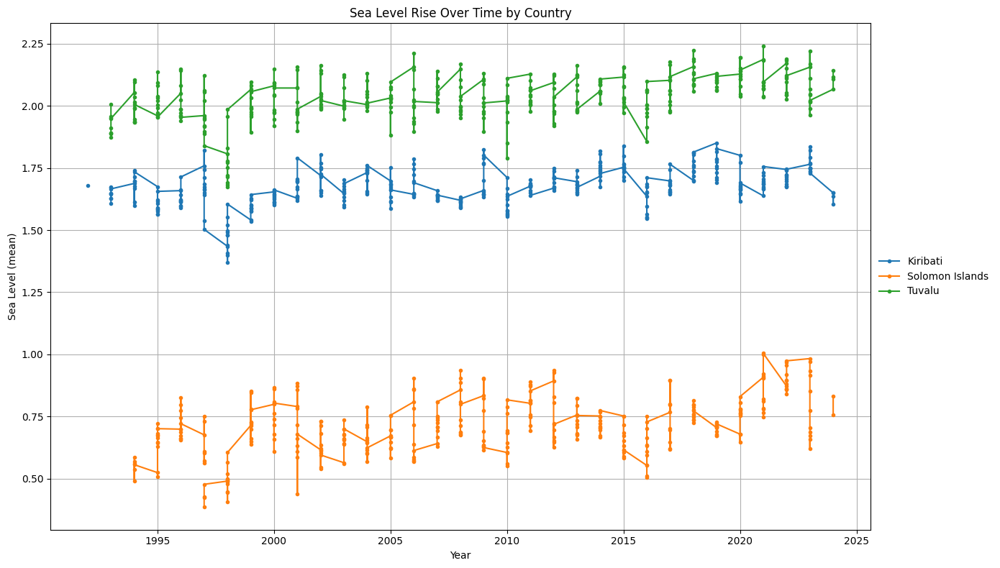

In [9]:
# Convert 'Year' to integer for plotting purposes
all_countries['Year'] = all_countries['Year'].astype(int)

# Plotting the data for each country
plt.figure(figsize=(14, 8))

# Group by 'Country' and iterate over each group to plot sea level data
for country, group in all_countries.groupby('Country'):
    plt.plot(group['Year'], group['Sea_Level_Mean'], marker='.', linestyle='-', label=country)

plt.title('Sea Level Rise Over Time by Country')
plt.xlabel('Year')
plt.ylabel('Sea Level (mean)')
plt.grid(True)

# Place legend outside the plot box
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
plt.style.use('tableau-colorblind10')
plt.tight_layout()
plt.show()

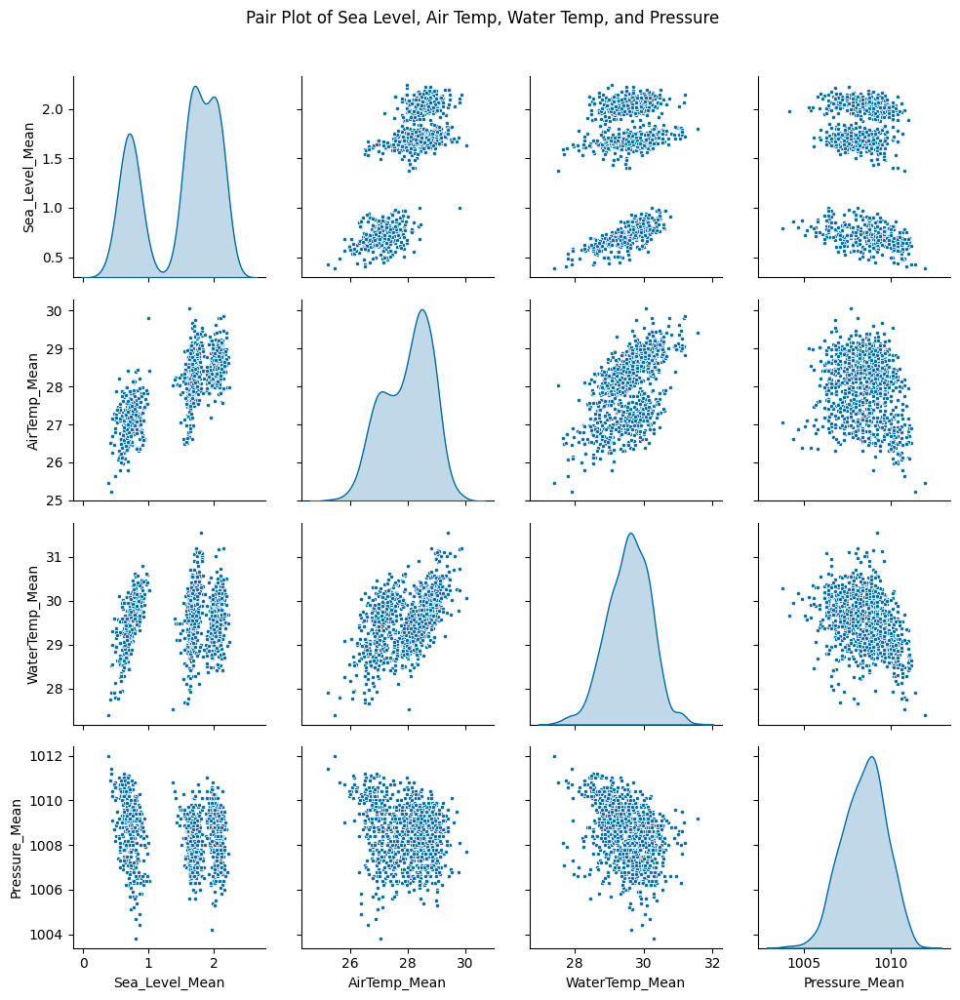

In [10]:
# Selecting columns for pair plot
cols = ['Sea_Level_Mean', 'AirTemp_Mean', 'WaterTemp_Mean', 'Pressure_Mean']

# Creating pair plot
sns.pairplot(all_countries[cols], diag_kind='kde', markers='.')

# Adjusting layout
plt.suptitle('Pair Plot of Sea Level, Air Temp, Water Temp, and Pressure', y=1.02)
plt.tight_layout()
plt.show()

### Time Series

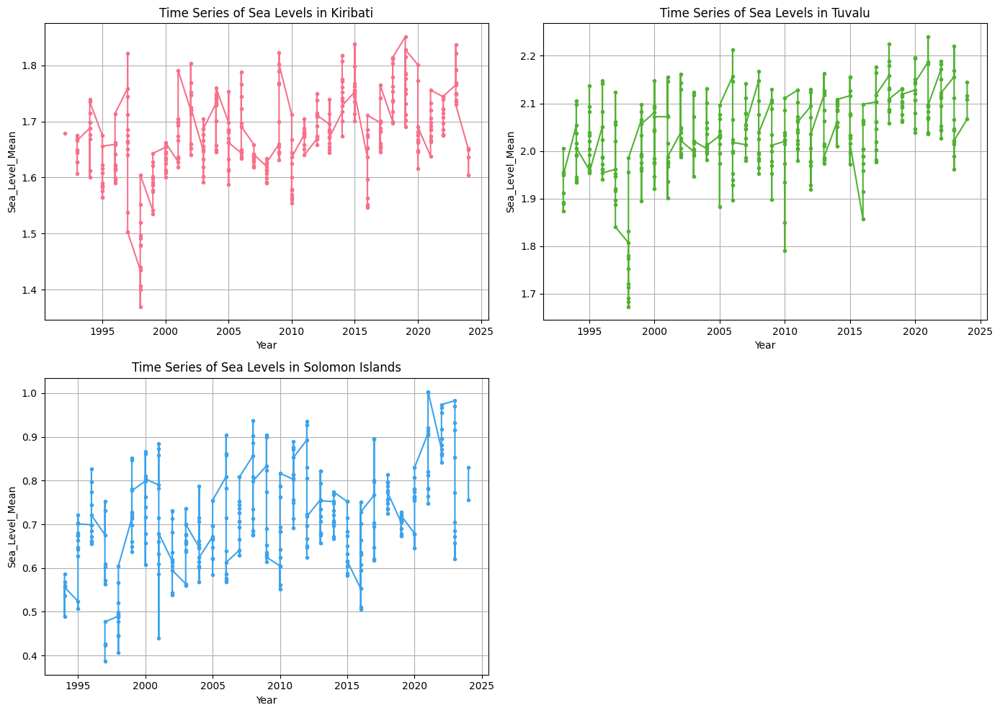

In [11]:
# Plotting time series for Sea_Level_Mean for each country with different colors
plt.figure(figsize=(14, 10))

# Define a color palette
colors = sns.color_palette('husl', n_colors=len(all_countries['Country'].unique()))

for i, country in enumerate(all_countries['Country'].unique(), 1):
    plt.subplot(len(all_countries['Country'].unique()) // 2 + 1, 2, i)
    plt.plot(all_countries[all_countries['Country'] == country]['Year'], all_countries[all_countries['Country'] == country]['Sea_Level_Mean'], marker='.', linestyle='-', color=colors[i-1])
    plt.title(f'Time Series of Sea Levels in {country}')
    plt.xlabel('Year')
    plt.ylabel('Sea_Level_Mean')
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)

plt.tight_layout()
plt.show()

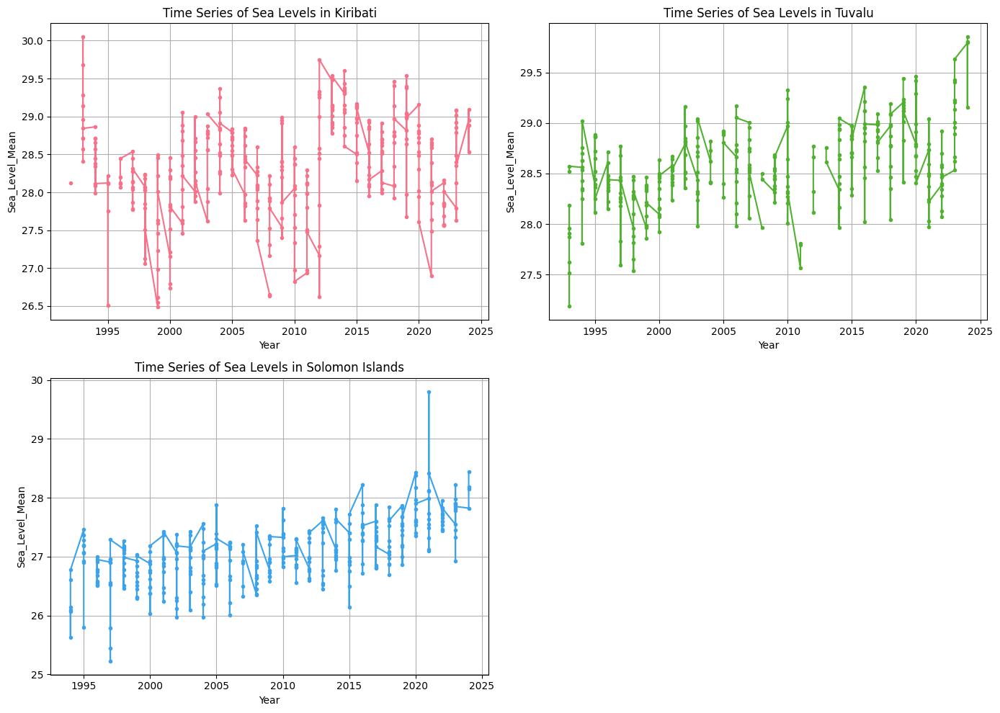

In [12]:
# Plotting time series for Air_Temp_Mean for each country with different colors
plt.figure(figsize=(14, 10))

# Define a color palette
colors = sns.color_palette('husl', n_colors=len(all_countries['Country'].unique()))

for i, country in enumerate(all_countries['Country'].unique(), 1):
    plt.subplot(len(all_countries['Country'].unique()) // 2 + 1, 2, i)
    plt.plot(all_countries[all_countries['Country'] == country]['Year'], all_countries[all_countries['Country'] == country]['AirTemp_Mean'], marker='.', linestyle='-', color=colors[i-1])
    plt.title(f'Time Series of Sea Levels in {country}')
    plt.xlabel('Year')
    plt.ylabel('Sea_Level_Mean')
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)

plt.tight_layout()
plt.show()

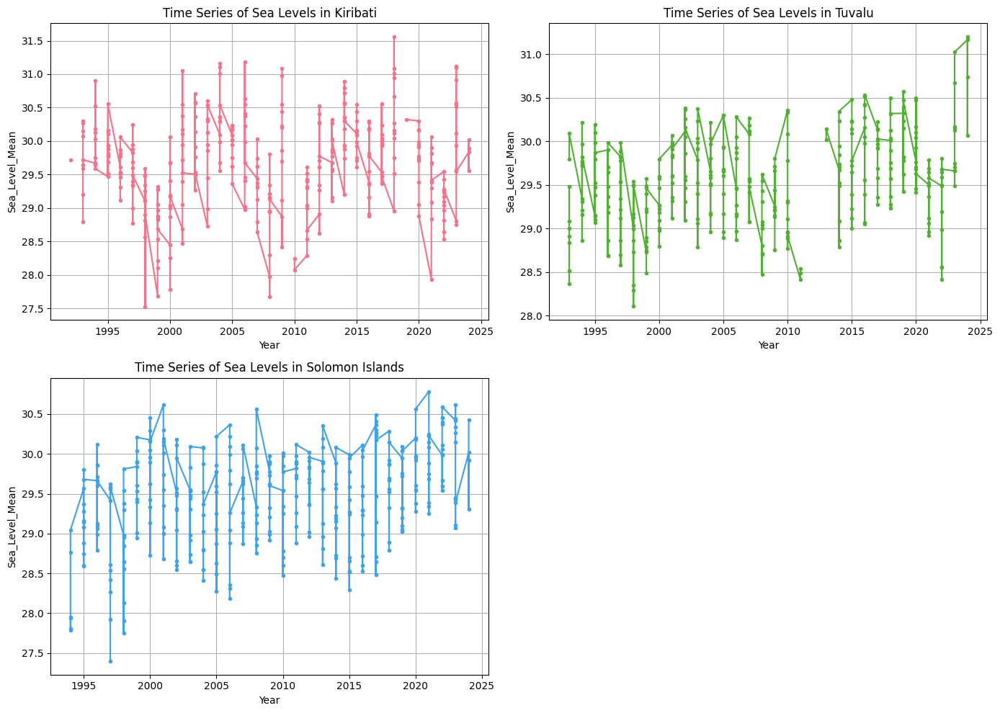

In [13]:
# Plotting time series for Water_Temp_Mean for each country with different colors
plt.figure(figsize=(14, 10))

# Define a color palette
colors = sns.color_palette('husl', n_colors=len(all_countries['Country'].unique()))

for i, country in enumerate(all_countries['Country'].unique(), 1):
    plt.subplot(len(all_countries['Country'].unique()) // 2 + 1, 2, i)
    plt.plot(all_countries[all_countries['Country'] == country]['Year'], all_countries[all_countries['Country'] == country]['WaterTemp_Mean'], marker='.', linestyle='-', color=colors[i-1])
    plt.title(f'Time Series of Sea Levels in {country}')
    plt.xlabel('Year')
    plt.ylabel('Sea_Level_Mean')
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)

plt.tight_layout()
plt.show()

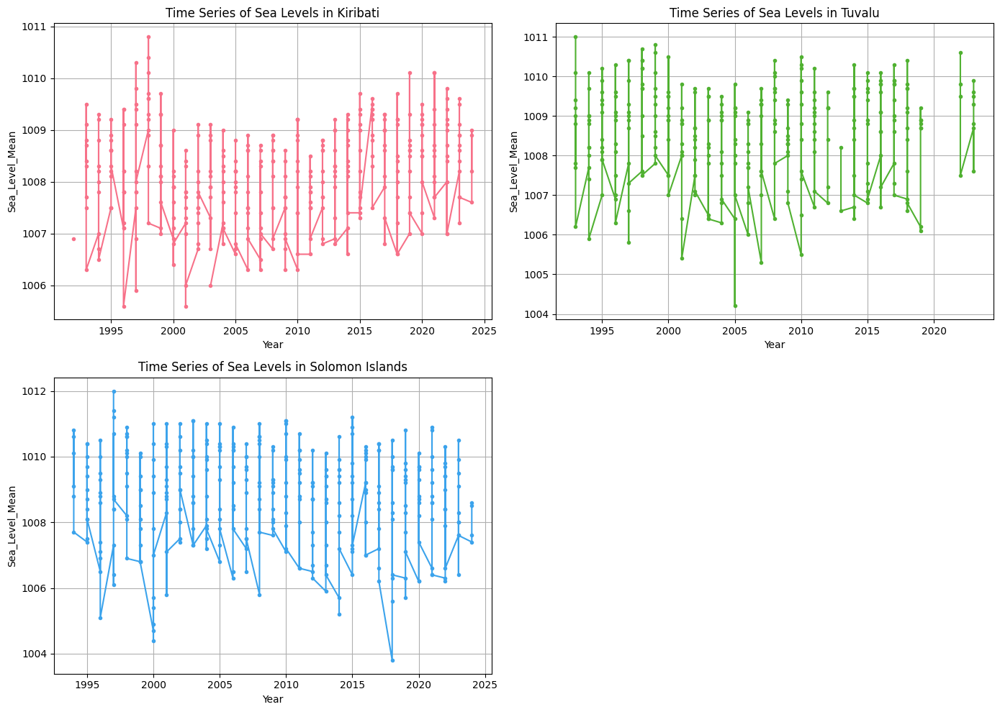

In [14]:
# Plotting time series for Bar_Pressure_Mean for each country with different colors
plt.figure(figsize=(14, 10))

# Define a color palette
colors = sns.color_palette('husl', n_colors=len(all_countries['Country'].unique()))

for i, country in enumerate(all_countries['Country'].unique(), 1):
    plt.subplot(len(all_countries['Country'].unique()) // 2 + 1, 2, i)
    plt.plot(all_countries[all_countries['Country'] == country]['Year'], all_countries[all_countries['Country'] == country]['Pressure_Mean'], marker='.', linestyle='-', color=colors[i-1])
    plt.title(f'Time Series of Sea Levels in {country}')
    plt.xlabel('Year')
    plt.ylabel('Sea_Level_Mean')
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)

plt.tight_layout()
plt.show()

# Data Augmentation
Use Interpolation.

Linear vs Polynomial ... explain.

https://www.sciencedirect.com/science/article/pii/S1877050920316914

https://arxiv.org/html/2406.06518v1#:~:text=Among%20these%2C%20the%20Synthetic%20Minority,and%20class%20imbalance%20%5B19%5D%20.

https://www.amygb.ai/blog/data-augmentation-techniques-for-numerical-data-analysis

In [15]:
all_countries

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Kiribati,12,1992,0.681,2.734,1.679,0.477,24.9,30.1,28.128,0.824,28.4,30.9,29.718,0.506,1004.6,1010.0,1006.9,1.2
1,Kiribati,1,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Kiribati,2,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Kiribati,3,1993,0.856,2.424,1.649,0.392,26.2,30.2,28.708,0.933,28.7,30.6,29.647,0.438,1006.1,1010.8,1008.8,1.1
4,Kiribati,4,1993,0.515,2.849,1.627,0.501,24.9,31.8,28.567,1.113,27.9,32.2,29.202,0.406,1005.1,1011.9,1008.4,1.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1104,Solomon Islands,12,2023,NaN,NaN,NaN,NaN,24.1,32.0,27.851,1.441,27.4,30.7,29.385,0.602,1002.2,1012.1,1007.6,1.9
1105,Solomon Islands,1,2024,NaN,NaN,NaN,NaN,24.2,32.5,27.823,1.606,28.6,31.3,30.018,0.498,1001.9,1014.3,1007.4,2.2
1106,Solomon Islands,2,2024,NaN,NaN,NaN,NaN,25.1,35.4,28.187,1.773,28.6,30.3,29.306,0.352,1002.7,1012.1,1007.6,1.8
1107,Solomon Islands,3,2024,0.249,1.193,0.756,0.197,25.3,34.3,28.145,1.552,29.0,31.1,29.925,0.375,1003.5,1013.6,1008.6,2.0


In [16]:
all_countries = all_countries.infer_objects()

all_countries_interpolated = all_countries.interpolate(method='linear', limit_direction='both')
all_countries = all_countries_interpolated
all_countries

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Kiribati,12,1992,0.681000,2.734000,1.67900,0.477000,24.900000,30.100000,28.128000,0.824000,28.4,30.9,29.718000,0.506000,1004.6,1010.000000,1006.900000,1.200000
1,Kiribati,1,1993,0.739333,2.630667,1.66900,0.448667,25.333333,30.133333,28.321333,0.860333,28.5,30.8,29.694333,0.483333,1005.1,1010.266667,1007.533333,1.166667
2,Kiribati,2,1993,0.797667,2.527333,1.65900,0.420333,25.766667,30.166667,28.514667,0.896667,28.6,30.7,29.670667,0.460667,1005.6,1010.533333,1008.166667,1.133333
3,Kiribati,3,1993,0.856000,2.424000,1.64900,0.392000,26.200000,30.200000,28.708000,0.933000,28.7,30.6,29.647000,0.438000,1006.1,1010.800000,1008.800000,1.100000
4,Kiribati,4,1993,0.515000,2.849000,1.62700,0.501000,24.900000,31.800000,28.567000,1.113000,27.9,32.2,29.202000,0.406000,1005.1,1011.900000,1008.400000,1.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1104,Solomon Islands,12,2023,0.150000,1.163000,0.68175,0.227750,24.100000,32.000000,27.851000,1.441000,27.4,30.7,29.385000,0.602000,1002.2,1012.100000,1007.600000,1.900000
1105,Solomon Islands,1,2024,0.183000,1.173000,0.70650,0.217500,24.200000,32.500000,27.823000,1.606000,28.6,31.3,30.018000,0.498000,1001.9,1014.300000,1007.400000,2.200000
1106,Solomon Islands,2,2024,0.216000,1.183000,0.73125,0.207250,25.100000,35.400000,28.187000,1.773000,28.6,30.3,29.306000,0.352000,1002.7,1012.100000,1007.600000,1.800000
1107,Solomon Islands,3,2024,0.249000,1.193000,0.75600,0.197000,25.300000,34.300000,28.145000,1.552000,29.0,31.1,29.925000,0.375000,1003.5,1013.600000,1008.600000,2.000000


### Data augmentation and feature engineering for all countries

In [17]:
label_encoder = LabelEncoder()

In [18]:
solomon_islands_interpolated = solomon_islands.interpolate(method='linear', limit_direction='both')
solomon_islands = solomon_islands_interpolated

In [19]:
# Handle categorical data
solomon_islands_dat = solomon_islands
solomon_islands_dat['Country'] = label_encoder.fit_transform(solomon_islands_dat['Country'])

# if 'Mth' in solomon_islands.columns:
solomon_islands_dat.rename(columns={'Mth': 'Month'}, inplace=True)
solomon_islands_dat['Date'] = (solomon_islands_dat['Year'].astype(str) + '-' + solomon_islands_dat['Month'].astype(str)).apply(lambda x: pd.Period(x, freq='M'))

# Set 'Date' as index
solomon_islands_dat = solomon_islands_dat.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
solomon_islands_dat = solomon_islands_dat.drop(columns=['Month', 'Year'])

In [20]:
solomon_islands['Country'] = label_encoder.fit_transform(solomon_islands['Country'])

# if 'Mth' in solomon_islands.columns:
solomon_islands.rename(columns={'Mth': 'Month'}, inplace=True)
solomon_islands['Date'] = pd.to_datetime(solomon_islands[['Year', 'Month']].assign(DAY=1))
# Set 'Date' as index
solomon_islands = solomon_islands.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
solomon_islands = solomon_islands.drop(columns=['Month', 'Year'])

In [21]:
kiribati_interpolated = kiribati.interpolate(method='linear', limit_direction='both')
kiribati = kiribati_interpolated

In [22]:
# Handle categorical data
kiribati_dat = kiribati
kiribati_dat['Country'] = label_encoder.fit_transform(kiribati_dat['Country'])

# if 'Mth' in solomon_islands.columns:
kiribati_dat.rename(columns={'Mth': 'Month'}, inplace=True)
kiribati_dat['Date'] = (kiribati_dat['Year'].astype(str) + '-' + kiribati_dat['Month'].astype(str)).apply(lambda x: pd.Period(x, freq='M'))

# Set 'Date' as index
kiribati_dat = kiribati_dat.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
kiribati_dat = kiribati_dat.drop(columns=['Month', 'Year'])

In [23]:
# Handle categorical data
kiribati['Country'] = label_encoder.fit_transform(kiribati['Country'])

# if 'Mth' in solomon_islands.columns:
kiribati.rename(columns={'Mth': 'Month'}, inplace=True)
# Convert 'Mth' and 'Year' to datetime
kiribati['Date'] = pd.to_datetime(kiribati[['Year', 'Month']].assign(DAY=1))
kiribati = kiribati.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
kiribati = kiribati.drop(columns=['Month', 'Year'])

In [24]:
tuvalu_interpolated = tuvalu.interpolate(method='linear', limit_direction='both')
tuvalu = tuvalu_interpolated

In [25]:
# Handle categorical data
tuvalu_dat = tuvalu
tuvalu_dat['Country'] = label_encoder.fit_transform(tuvalu_dat['Country'])

# if 'Mth' in solomon_islands.columns:
tuvalu_dat.rename(columns={'Mth': 'Month'}, inplace=True)
tuvalu_dat['Date'] = (tuvalu_dat['Year'].astype(str) + '-' + tuvalu_dat['Month'].astype(str)).apply(lambda x: pd.Period(x, freq='M'))

# Set 'Date' as index
tuvalu_dat = tuvalu_dat.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
tuvalu_dat = tuvalu_dat.drop(columns=['Month', 'Year'])

In [26]:
# Handle categorical data
tuvalu['Country'] = label_encoder.fit_transform(tuvalu['Country'])

# if 'Mth' in solomon_islands.columns:
tuvalu.rename(columns={'Mth': 'Month'}, inplace=True)
# Convert 'Mth' and 'Year' to datetime
tuvalu['Date'] = pd.to_datetime(tuvalu[['Year', 'Month']].assign(DAY=1))
tuvalu = tuvalu.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
tuvalu = tuvalu.drop(columns=['Month', 'Year'])

# Feature Distributions and Transformation
The transformation is only done for the linear regression model but this might not happen, we will see.

## Solomon Islands

In [27]:
solomon_islands2 = solomon_islands.applymap(lambda x: x if x >= 0 else None).dropna()
solomon_islands2.drop(columns=['Country'], inplace=True)

In [28]:
df_numeric = solomon_islands2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000
mean,0.256188,1.119569,0.711079,0.195574,23.394803,31.812921,27.075153,1.827100,28.676685,30.579213,29.465253,0.347067,1004.032303,1012.948315,1008.736517,1.710393
std,0.121467,0.133828,0.111336,0.027401,0.801513,1.161420,0.540684,0.170922,0.636919,0.726852,0.609543,0.107098,2.111764,1.497721,1.480192,0.336140
min,0.015000,0.719000,0.387000,0.131000,20.100000,28.800000,25.223000,1.427000,26.500000,28.400000,27.398000,0.178000,994.700000,1008.900000,1003.800000,1.100000
25%,0.162750,1.033750,0.640750,0.174000,22.900000,31.000000,26.746500,1.710500,28.300000,30.100000,29.053500,0.268500,1002.800000,1012.000000,1007.775000,1.500000
50%,0.245500,1.128000,0.705000,0.196000,23.500000,31.600000,27.069500,1.814000,28.700000,30.700000,29.543500,0.326000,1004.200000,1013.100000,1008.900000,1.600000
75%,0.335500,1.213000,0.781000,0.216250,23.981250,32.400000,27.405500,1.917750,29.100000,31.100000,29.922000,0.401500,1005.700000,1013.900000,1009.925000,1.900000
max,0.616000,1.407000,1.004000,0.259000,25.300000,36.000000,29.805000,2.444000,30.000000,31.900000,30.784000,0.846000,1007.900000,1016.600000,1012.000000,3.200000


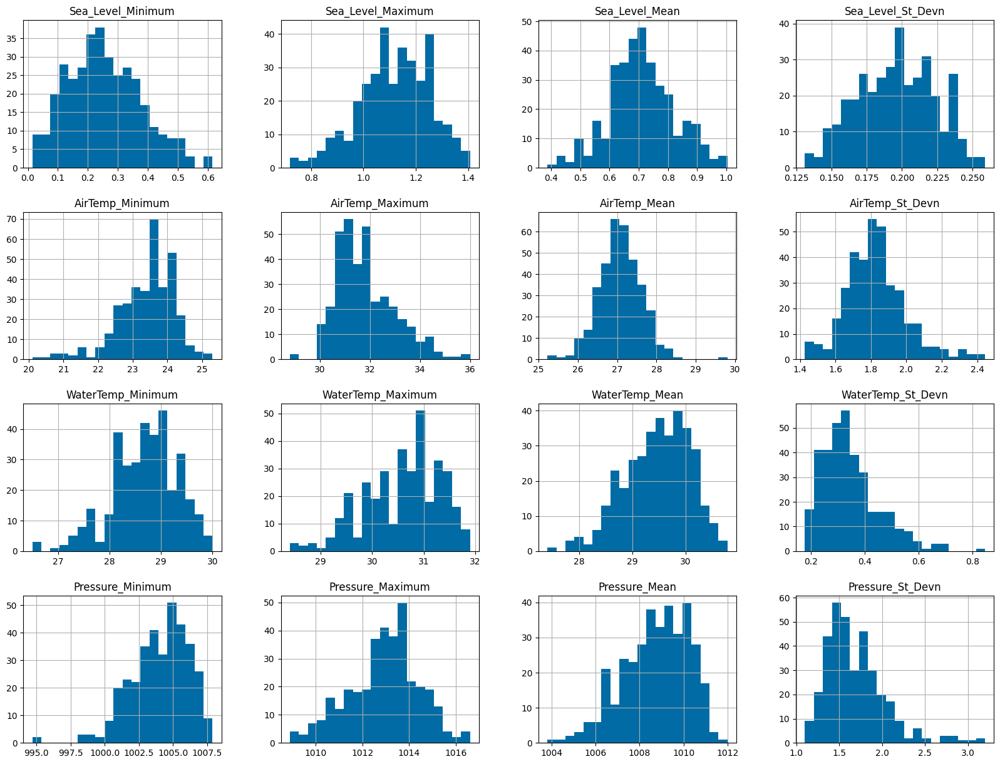

In [29]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

In [30]:
SI_cols = solomon_islands2.columns
SI_cols

Index(['Sea_Level_Minimum', 'Sea_Level_Maximum', 'Sea_Level_Mean',
       'Sea_Level_St_Devn', 'AirTemp_Minimum', 'AirTemp_Maximum',
       'AirTemp_Mean', 'AirTemp_St_Devn', 'WaterTemp_Minimum',
       'WaterTemp_Maximum', 'WaterTemp_Mean', 'WaterTemp_St_Devn',
       'Pressure_Minimum', 'Pressure_Maximum', 'Pressure_Mean',
       'Pressure_St_Devn'],
      dtype='object')

In [31]:
SI_cols = solomon_islands2.columns
lambda_values = []

for col in SI_cols:
    SI_vals = solomon_islands2[col].values
    fitted_data, fitted_lambda = stats.boxcox(SI_vals.ravel())

    # # creating axes to draw plots
    # fig, ax = plt.subplots(1, 2)

    # # plotting the original data(non-normal) and
    # # fitted data (normal)
    # sns.distplot(SI_vals, hist = False, kde = True,
    #             kde_kws = {'shade': True, 'linewidth': 2},
    #             label = "Non-Normal", color ="green", ax = ax[0])

    # sns.distplot(fitted_data, hist = False, kde = True,
    #             kde_kws = {'shade': True, 'linewidth': 2},
    #             label = "Normal", color ="green", ax = ax[1])

    # # adding legends to the subplots
    # plt.legend(loc = "upper right")

    # # rescaling the subplots
    # fig.set_figheight(5)
    # fig.set_figwidth(10)
    lambda_values.append(fitted_lambda)

    print(f"Lambda value used for Transformation: {fitted_lambda}")

Lambda value used for Transformation: 0.6458478599112378
Lambda value used for Transformation: 2.020055551802043
Lambda value used for Transformation: 0.857501762758421
Lambda value used for Transformation: 1.0716806811597879
Lambda value used for Transformation: 9.084483070418976
Lambda value used for Transformation: -6.4869678349828
Lambda value used for Transformation: -1.3714323327137086
Lambda value used for Transformation: -0.7269956202999818
Lambda value used for Transformation: 9.413831651269964
Lambda value used for Transformation: 10.810292013867532
Lambda value used for Transformation: 10.156357537348375
Lambda value used for Transformation: -0.3690771219700603
Lambda value used for Transformation: 101.97157080462797
Lambda value used for Transformation: 85.03321217508041
Lambda value used for Transformation: 101.91166160174582
Lambda value used for Transformation: -1.2438520221690488


In [32]:
print(lambda_values)

[0.6458478599112378, 2.020055551802043, 0.857501762758421, 1.0716806811597879, 9.084483070418976, -6.4869678349828, -1.3714323327137086, -0.7269956202999818, 9.413831651269964, 10.810292013867532, 10.156357537348375, -0.3690771219700603, 101.97157080462797, 85.03321217508041, 101.91166160174582, -1.2438520221690488]


In [33]:
def custom_round(arr):
    arr = np.array(arr)

    arr_rounded = np.where((arr >= 0) & (arr <= 1), np.round(arr * 2) / 2, np.round(arr))
    return arr_rounded

rounded_arr = custom_round(lambda_values)
print(rounded_arr)

[  0.5   2.    1.    1.    9.   -6.   -1.   -1.    9.   11.   10.   -0.
 102.   85.  102.   -1. ]


### Apply lambda functions based on their values

In [34]:
print(solomon_islands2.head())
# Function to apply Box-Cox transformation to each column based on lambda values
def apply_boxcox_to_column(column, lambda_value):
    if lambda_value == 0:
        return np.log(column)
    elif lambda_value == 0.5:
        return np.sqrt(column)
    elif lambda_value == -0.5:
        return 1/np.sqrt(column)
    elif lambda_value == 1:
        return column
    elif lambda_value == -1:
        return 1/column
    elif lambda_value == 2:
        return column**2
    elif lambda_value == -2:
        return 1/column**2
    else:
        if lambda_value > 0:
            return column**lambda_value
        else:
            column**(-lambda_value)

# Apply transformations to each column in the DataFrame
for col, lam in zip(solomon_islands2.columns, lambda_values):
    solomon_islands2[col] = apply_boxcox_to_column(solomon_islands2[col], lam)

# Print the transformed DataFrame
print(solomon_islands2.head())

            Sea_Level_Minimum  Sea_Level_Maximum  Sea_Level_Mean  \
Date                                                               
1994-07-01              0.335              0.871           0.586   
1994-08-01              0.181              0.875           0.568   
1994-09-01              0.162              0.840           0.489   
1994-10-01              0.193              0.919           0.537   
1994-11-01              0.130              0.943           0.560   

            Sea_Level_St_Devn  AirTemp_Minimum  AirTemp_Maximum  AirTemp_Mean  \
Date                                                                            
1994-07-01              0.131             23.5             28.8        26.141   
1994-08-01              0.172             22.2             30.3        26.097   
1994-09-01              0.153             21.1             30.9        25.632   
1994-10-01              0.159             21.3             30.1        26.065   
1994-11-01              0.194        

## Kiribati

In [35]:
kiribati2 = kiribati.applymap(lambda x: x if x >= 0 else None).dropna()
kiribati2.drop(columns=['Country'], inplace=True)
kiribati2

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
1992-12-01,0.681000,2.734000,1.679,0.477000,24.900000,30.100000,28.128000,0.824000,28.4,30.9,29.718000,0.506000,1004.6,1010.000000,1006.900000,1.200000
1993-01-01,0.739333,2.630667,1.669,0.448667,25.333333,30.133333,28.321333,0.860333,28.5,30.8,29.694333,0.483333,1005.1,1010.266667,1007.533333,1.166667
1993-02-01,0.797667,2.527333,1.659,0.420333,25.766667,30.166667,28.514667,0.896667,28.6,30.7,29.670667,0.460667,1005.6,1010.533333,1008.166667,1.133333
1993-03-01,0.856000,2.424000,1.649,0.392000,26.200000,30.200000,28.708000,0.933000,28.7,30.6,29.647000,0.438000,1006.1,1010.800000,1008.800000,1.100000
1993-04-01,0.515000,2.849000,1.627,0.501000,24.900000,31.800000,28.567000,1.113000,27.9,32.2,29.202000,0.406000,1005.1,1011.900000,1008.400000,1.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.798000,2.748000,1.730,0.442000,23.300000,31.000000,28.351000,1.226000,27.8,31.0,29.542000,0.567000,1003.5,1012.600000,1007.700000,2.000000
2024-01-01,0.658000,2.795000,1.650,0.464000,24.300000,31.300000,28.953000,1.136000,27.9,31.3,29.835000,0.590000,1002.4,1012.200000,1007.600000,1.900000
2024-02-01,0.496000,2.907000,1.652,0.505000,25.100000,31.100000,29.096000,0.981000,28.7,30.9,29.886000,0.473000,1005.5,1012.600000,1009.000000,1.400000


In [36]:
df_numeric = kiribati2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000
mean,0.596634,2.832566,1.671943,0.495581,24.677586,29.884483,28.290507,0.752469,28.384881,30.886340,29.704805,0.439151,1003.942042,1012.140716,1008.140981,1.597745
std,0.104436,0.109482,0.073384,0.025011,0.792364,1.078178,0.658676,0.231781,0.806578,0.769992,0.686614,0.123550,1.303423,1.134485,0.923878,0.286680
min,0.167000,2.424000,1.370000,0.388000,22.200000,27.300000,26.495000,0.296000,26.200000,28.800000,27.527000,0.249000,998.800000,1009.500000,1005.600000,1.100000
25%,0.538000,2.760000,1.632000,0.479000,24.166667,29.100000,27.891000,0.558733,27.800000,30.400000,29.303000,0.343000,1003.100000,1011.300000,1007.500000,1.400000
50%,0.593000,2.842000,1.671000,0.498000,24.700000,29.900000,28.328000,0.719000,28.300000,31.000000,29.703000,0.415000,1004.000000,1012.100000,1008.200000,1.600000
75%,0.661000,2.909000,1.720000,0.513000,25.100000,30.600000,28.780000,0.938000,29.000000,31.400000,30.170000,0.510000,1004.900000,1012.900000,1008.800000,1.700000
max,0.872000,3.146000,1.851000,0.624000,27.300000,33.500000,30.051000,1.295000,30.800000,32.700000,31.559000,0.904000,1006.900000,1015.500000,1010.800000,3.400000


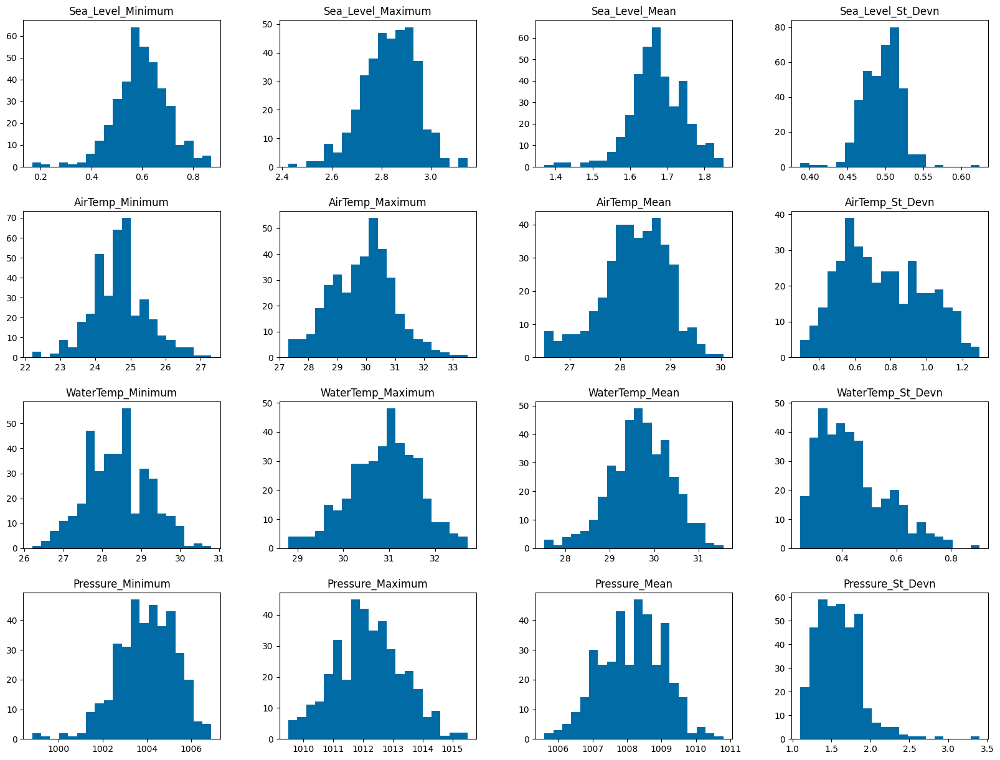

In [37]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15), grid=False)
# plt.ylabel('Frequency')
# plt.xlabel('Values')
# plt.title('Histogram of Each Feature')
# plt.tight_layout()
# plt.savefig('images/kiribati-dist.pdf', format = 'pdf')
plt.show()

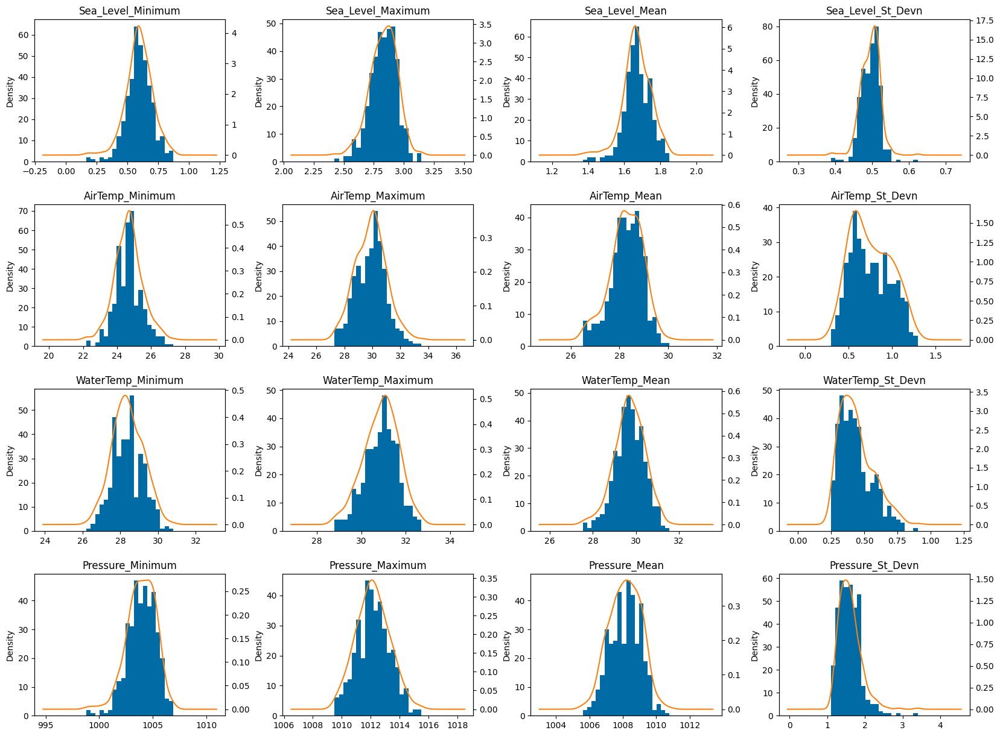

In [38]:
fig, ax = plt.subplots(4,4, figsize=(20, 15))
fig.subplots_adjust(hspace = .3, wspace=.3, )

ax = ax.ravel()

for i in range(len(df_numeric.columns)):
    ax[i] = df_numeric.iloc[:,i].plot(kind='hist', ax=ax[i], bins=20)
    ax[i] = df_numeric.iloc[:,i].plot(kind='kde', ax=ax[i], secondary_y=True)
    plt.title(df_numeric.columns[i])

In [39]:
SI_cols = kiribati2.columns
SI_cols

Index(['Sea_Level_Minimum', 'Sea_Level_Maximum', 'Sea_Level_Mean',
       'Sea_Level_St_Devn', 'AirTemp_Minimum', 'AirTemp_Maximum',
       'AirTemp_Mean', 'AirTemp_St_Devn', 'WaterTemp_Minimum',
       'WaterTemp_Maximum', 'WaterTemp_Mean', 'WaterTemp_St_Devn',
       'Pressure_Minimum', 'Pressure_Maximum', 'Pressure_Mean',
       'Pressure_St_Devn'],
      dtype='object')

In [40]:
# SI_cols = kiribati2.columns
# lambda_values = []

# for col in SI_cols:
#     SI_vals = kiribati2[col].values
#     fitted_data, fitted_lambda = stats.boxcox(SI_vals.ravel())

#     # creating axes to draw plots
#     fig, ax = plt.subplots(1, 2)

#     # plotting the original data(non-normal) and
#     # fitted data (normal)
#     sns.distplot(SI_vals, hist = False, kde = True,
#                 kde_kws = {'shade': True, 'linewidth': 2},
#                 label = "Non-Normal", color ="green", ax = ax[0])

#     sns.distplot(fitted_data, hist = False, kde = True,
#                 kde_kws = {'shade': True, 'linewidth': 2},
#                 label = "Normal", color ="green", ax = ax[1])

#     # adding legends to the subplots
#     plt.legend(loc = "upper right")

#     # rescaling the subplots
#     fig.set_figheight(5)
#     fig.set_figwidth(10)
#     lambda_values.append(fitted_lambda)

#     print(f"Lambda value used for Transformation: {fitted_lambda}")

In [41]:
# print(lambda_values)

In [42]:
# lambda_values = [round(x * 2) / 2 for x in lambda_values]
# print(lambda_values)

## Tuvalu

In [43]:
tuvalu2 = tuvalu.applymap(lambda x: x if x >= 0 else None).dropna()
tuvalu2.drop(columns=['Country'], inplace=True)

In [44]:
df_numeric = tuvalu2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000
mean,1.012444,3.109997,2.032709,0.467036,24.451738,30.729545,28.537717,0.987531,28.826604,30.549465,29.532306,0.270790,1004.588503,1012.630882,1008.717380,1.563102
std,0.115762,0.129048,0.089320,0.024991,0.619818,0.824118,0.407143,0.144976,0.570658,0.850595,0.531339,0.130507,1.938627,1.223604,1.170344,0.353128
min,0.527000,2.425000,1.673000,0.300000,22.400000,27.800000,27.185000,0.366000,26.900000,28.600000,28.106000,0.071000,994.200000,1008.600000,1004.200000,1.000000
25%,0.945250,3.041250,1.984000,0.454250,24.100000,30.200000,28.284250,0.897750,28.500000,29.900000,29.136500,0.180250,1003.600000,1011.800000,1008.000000,1.300000
50%,1.023500,3.122000,2.035500,0.467000,24.500000,30.688462,28.511000,0.981500,28.800000,30.500000,29.542000,0.246125,1004.900000,1012.700000,1008.900000,1.500000
75%,1.084000,3.184000,2.095000,0.480000,24.800000,31.200000,28.807000,1.077750,29.200000,31.200000,29.926500,0.327750,1006.000000,1013.400000,1009.600000,1.700000
max,1.513000,3.438000,2.240000,0.627000,26.400000,33.700000,29.853000,1.447000,30.800000,32.800000,31.202000,0.893000,1008.000000,1016.400000,1011.000000,4.700000


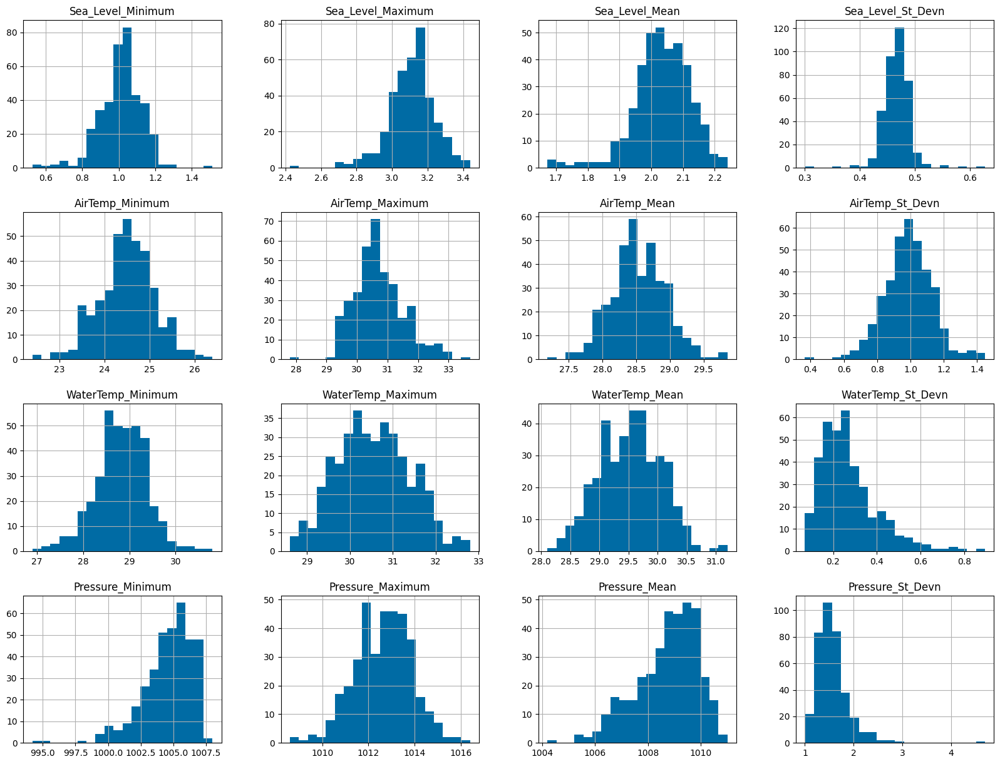

In [45]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

## All Countries:

In [46]:
categorical_columns = ['Country', 'Mth', 'Year']
numerical_columns = all_countries.columns.difference(categorical_columns)

df_categorical = all_countries[categorical_columns]
df_numeric = all_countries[numerical_columns]

# Summary statistics for the numerical columns
df_numeric.describe()

,AirTemp_Maximum,AirTemp_Mean,AirTemp_Minimum,AirTemp_St_Devn,Pressure_Maximum,Pressure_Mean,Pressure_Minimum,Pressure_St_Devn,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_Minimum,Sea_Level_St_Devn,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_Minimum,WaterTemp_St_Devn
count,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000
mean,30.790171,27.980277,24.185437,1.178726,1012.561767,1008.527818,1004.195582,1.620424,2.372606,1.482908,0.626416,0.389126,30.671371,29.567336,28.626105,0.352658
std,1.293066,0.838003,0.928714,0.494784,1.332829,1.237233,1.835944,0.332354,0.883047,0.562238,0.329241,0.136623,0.800545,0.622507,0.705421,0.139373
min,27.300000,25.223000,20.100000,0.296000,1008.600000,1003.800000,994.200000,1.000000,0.719000,0.387000,-0.068000,0.131000,28.400000,27.398000,26.200000,0.071000
25%,30.000000,27.308000,23.600000,0.822000,1011.700000,1007.700000,1003.100000,1.400000,1.235000,0.794000,0.339000,0.218000,30.100000,29.141000,28.200000,0.255000
50%,30.700000,28.123900,24.300000,1.027000,1012.600000,1008.600000,1004.400000,1.600000,2.837000,1.674000,0.598000,0.464000,30.700000,29.594000,28.700000,0.334000
75%,31.500000,28.639000,24.800000,1.699000,1013.500000,1009.400000,1005.500000,1.800000,3.048000,1.986000,0.947000,0.490000,31.200000,30.005000,29.100000,0.429000
max,36.000000,30.051000,27.300000,2.444000,1016.600000,1012.000000,1008.000000,4.700000,3.438000,2.240000,1.513000,0.627000,32.800000,31.559000,30.800000,0.904000


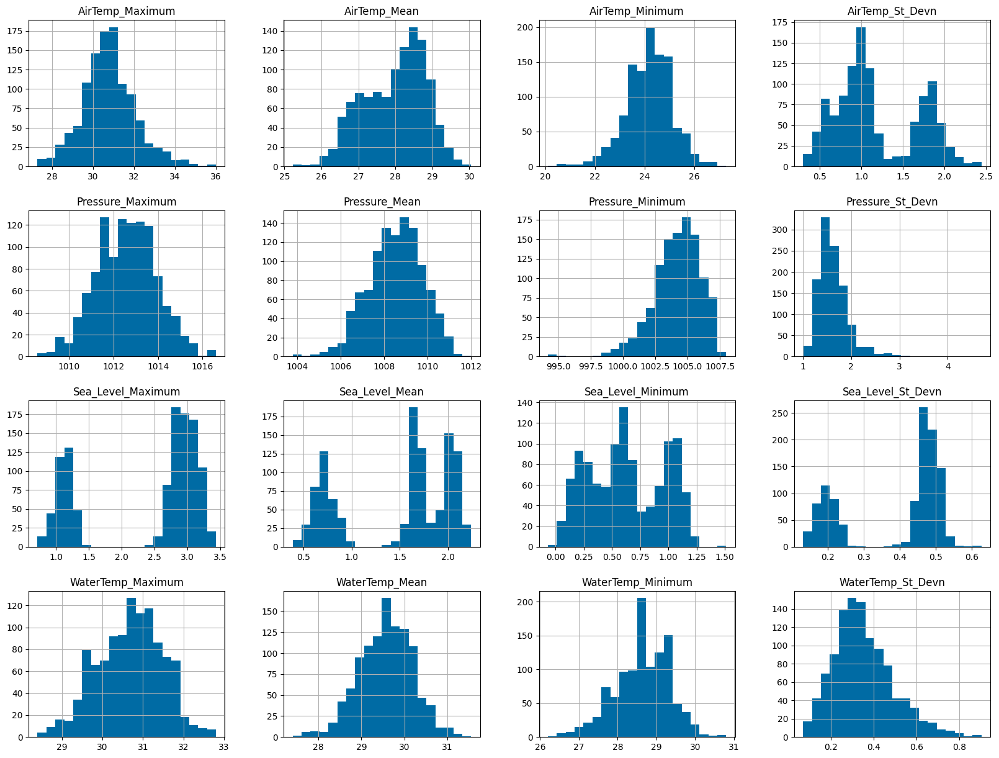

In [47]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

# Normalise data

In [48]:
# MinMax Scaler
def normalise_column(col):
    return (col - col.min()) / (col.max() - col.min())

## Solomon Islands

In [49]:
# Standard Scaler
solomon_islands_std = solomon_islands
solomon_islands_norm = solomon_islands
solomon_islands_rbst = solomon_islands
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()
robust_scaler = RobustScaler()
solomon_islands_std1 = standard_scaler.fit_transform(solomon_islands_std)
solomon_islands_norm1 = minmax_scaler.fit_transform(solomon_islands_norm)
solomon_islands_rbst1 = robust_scaler.fit_transform(solomon_islands_rbst)

In [50]:
# Apply normalisation to all columns
solomon_islands_norm = solomon_islands.apply(normalise_column)
solomon_islands_norm = solomon_islands_norm.drop('Country', axis=1)
solomon_islands_norm

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
1994-07-01,0.589181,0.220930,0.322528,0.000000,0.653846,0.000000,0.200349,0.189774,0.285714,0.000000,0.162729,0.002994,0.901515,0.311688,0.646341,0.047619
1994-08-01,0.364035,0.226744,0.293355,0.320312,0.403846,0.208333,0.190746,0.272370,0.314286,0.114286,0.160957,0.065868,0.780303,0.831169,0.768293,0.380952
1994-09-01,0.336257,0.175872,0.165316,0.171875,0.192308,0.291667,0.089262,0.357915,0.228571,0.114286,0.121382,0.185629,0.833333,0.831169,0.853659,0.380952
1994-10-01,0.381579,0.290698,0.243112,0.218750,0.230769,0.180556,0.183763,0.306785,0.171429,0.085714,0.114885,0.206587,0.795455,0.688312,0.829268,0.190476
1994-11-01,0.289474,0.325581,0.280389,0.492188,0.403846,0.194444,0.302052,0.328417,0.342857,0.371429,0.402835,0.456587,0.636364,0.597403,0.609756,0.428571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.318713,0.645349,0.477715,0.755859,0.769231,0.444444,0.573549,0.013766,0.257143,0.657143,0.586828,0.634731,0.568182,0.415584,0.463415,0.380952
2024-01-01,0.366959,0.659884,0.517828,0.675781,0.788462,0.513889,0.567438,0.176008,0.600000,0.828571,0.773774,0.479042,0.545455,0.701299,0.439024,0.523810
2024-02-01,0.415205,0.674419,0.557942,0.595703,0.961538,0.916667,0.646879,0.340216,0.600000,0.542857,0.563497,0.260479,0.606061,0.415584,0.463415,0.333333


## Kiribati

In [51]:
# Apply normalisation to all columns
kiribati_norm = kiribati.apply(normalise_column)
kiribati_norm = kiribati_norm.drop('Country', axis=1)
kiribati_norm
kiribati_std = kiribati
standard_scaler.fit_transform(kiribati_std)

array([[ 0.        ,  0.80890198, -0.90149009, ..., -1.88945747,
        -1.34501612, -1.38926357],
       [ 0.        ,  1.3682022 , -1.84657948, ..., -1.65408982,
        -0.65858881, -1.50569179],
       [ 0.        ,  1.92750242, -2.79166887, ..., -1.41872218,
         0.02783849, -1.62212001],
       ...,
       [ 0.        , -0.96487871,  0.68077246, ...,  0.40537706,
         0.93103232, -0.69069422],
       [ 0.        , -2.02914712,  1.15636583, ...,  2.78847446,
         0.82264906,  1.75429847],
       [ 0.        , -0.97446671, -0.36187454, ...,  0.3171142 ,
         0.06396625, -0.34140955]])

## Tuvalu

In [52]:
# Apply normalisation to all columns
tuvalu_norm = tuvalu.apply(normalise_column)
tuvalu_norm = tuvalu_norm.drop('Country', axis=1)
tuvalu_norm

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
1993-03-01,0.753550,0.368213,0.587302,0.296636,0.625,0.305085,0.163793,0.587419,0.410256,0.214286,0.316537,0.147202,0.869565,0.384615,0.705882,0.054054
1993-04-01,1.000000,0.000000,0.499118,0.000000,0.875,0.000000,0.000000,0.000000,0.589744,0.285714,0.445413,0.132603,0.884058,0.102564,0.514706,0.000000
1993-05-01,0.521298,0.283317,0.354497,0.330275,0.425,0.423729,0.257871,0.713228,0.410256,0.357143,0.290698,0.155718,0.833333,0.602564,0.764706,0.189189
1993-06-01,0.425963,0.449161,0.386243,0.489297,0.400,0.338983,0.375937,0.468085,0.384615,0.190476,0.236111,0.083942,0.746377,0.564103,0.735294,0.162162
1993-07-01,0.402637,0.526160,0.421517,0.489297,0.325,0.305085,0.122939,0.689177,0.179487,0.071429,0.084625,0.246959,0.818841,0.448718,0.676471,0.054054
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.597363,0.534057,0.615520,0.400612,0.775,0.864407,0.917166,0.641998,0.871795,0.880952,0.943152,0.345499,0.862319,0.602564,0.838235,0.162162
2024-01-01,0.520284,0.687068,0.694885,0.437309,0.600,0.898305,0.977511,0.784459,0.948718,0.714286,0.989018,0.048662,0.862319,0.602564,0.838235,0.162162
2024-02-01,0.480730,0.942744,0.781305,0.544343,0.625,0.796610,0.737256,0.554117,0.641026,0.500000,0.633398,0.244526,0.862319,0.602564,0.838235,0.162162


# Explore Data Again

Check if data augmentation worked well

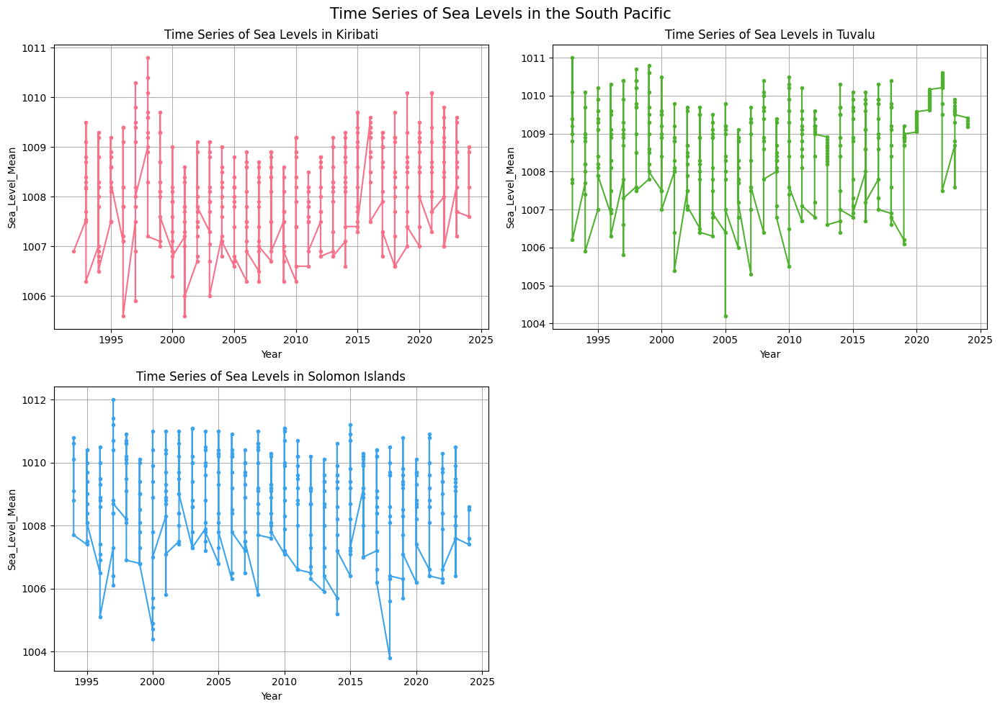

In [53]:
# Plotting time series for Bar_Pressure_Mean for each country with different colors
plt.figure(figsize=(14, 10))

# Define a color palette
colors = sns.color_palette('husl', n_colors=len(all_countries['Country'].unique()))

for i, country in enumerate(all_countries['Country'].unique(), 1):
    plt.subplot(len(all_countries['Country'].unique()) // 2 + 1, 2, i)
    plt.plot(all_countries[all_countries['Country'] == country]['Year'], all_countries[all_countries['Country'] == country]['Pressure_Mean'], marker='.', linestyle='-', color=colors[i-1])
    plt.title(f'Time Series of Sea Levels in {country}')
    plt.xlabel('Year')
    plt.ylabel('Sea_Level_Mean')
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)

plt.suptitle('Time Series of Sea Levels in the South Pacific', fontsize = 15)
plt.tight_layout()
# plt.savefig('images/time-series-SLT.png')

plt.show()
plt.close()

In [54]:
# # Filter to include only the first month of each year
# first_month_data = solomon_islands[solomon_islands['Mth'] == 1]

# # Plot sea level trend with dots for the first month of each year
# plt.figure(figsize=(8, 4))
# plt.plot(first_month_data['Year'], first_month_data['Sea_Level_Mean'], marker='o', linestyle='-', color='b', label='Sea Level Mean')

# # Fit a linear trend line using np.polyfit
# slope, intercept = np.polyfit(first_month_data['Year'], first_month_data['Sea_Level_Mean'], 1)

# # Plot trend line
# plt.plot(first_month_data['Year'], slope * first_month_data['Year'] + intercept, linestyle='--', color='r', label='Line of best fit')

# # Add titles and labels
# plt.title('Sea Level Trend in Solomon Islands with Trend Line')
# plt.xlabel('Year')
# plt.ylabel('Sea Level (m)')

# # Add grid and legend
# plt.grid(True)
# plt.legend()

# # Ensure tight layout for better presentation
# plt.tight_layout()

# # Display the plot
# plt.show()

### All Countries
#### Sea Level

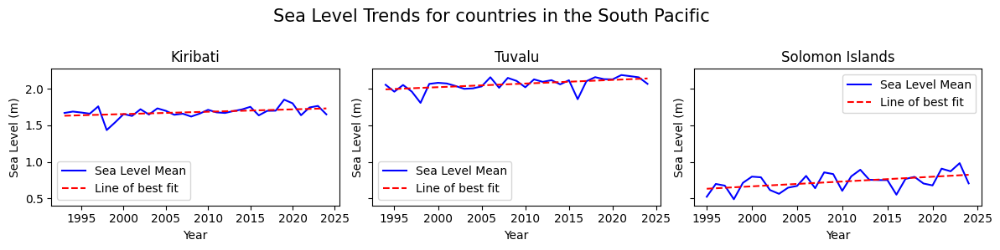

In [55]:
# Filter to include only the first month of each year
first_month_data = all_countries[all_countries['Mth'] == 1]

# Get list of unique countries
countries = first_month_data['Country'].unique()

# Set up the figure and subplots
n_countries = len(countries)
n_cols = 3
n_rows = int(np.ceil(n_countries / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 3 * n_rows), sharey=True)
axes = axes.flatten()

for i, country in enumerate(countries):
    country_data = first_month_data[first_month_data['Country'] == country]

    axes[i].plot(country_data['Year'], country_data['Sea_Level_Mean'], linestyle='-', color='b', label='Sea Level Mean')

    # Fit a linear trend line using np.polyfit
    if not country_data.empty and len(country_data) > 1:  # Ensure there is enough data to fit a line
        slope, intercept = np.polyfit(country_data['Year'], country_data['Sea_Level_Mean'], 1)
        axes[i].plot(country_data['Year'], slope * country_data['Year'] + intercept, linestyle='--', color='r', label='Line of best fit')

    axes[i].set_title(f'{country}')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Sea Level (m)')
    # axes[i].grid(True)
    axes[i].legend()

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
fig.suptitle("Sea Level Trends for countries in the South Pacific", fontsize=15)
# plt.subplots_adjust(top=0.9)
plt.tight_layout(rect=[0, 0, 1, 0.98])
# plt.savefig('images/SLT.png')

plt.show()

#### Water Temperature Levels

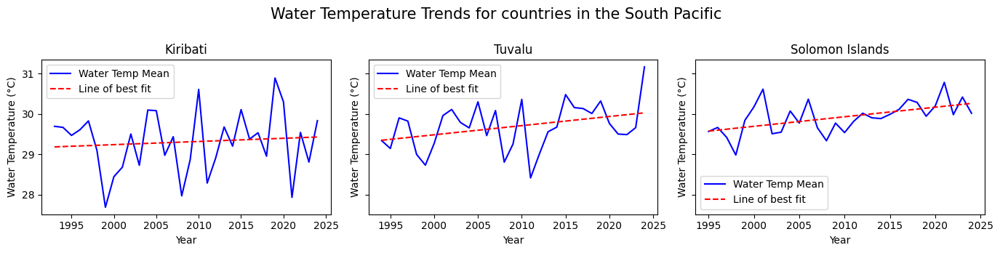

In [56]:
# Filter to include only the first month of each year
# first_month_data = all_countries[all_countries['Mth'] == 1]

# Get list of unique countries
# countries = first_month_data['Country'].unique()

# Set up the figure and subplots
n_countries = len(countries)
n_cols = 3
n_rows = int(np.ceil(n_countries / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 3.5 * n_rows), sharey=True)
axes = axes.flatten()

for i, country in enumerate(countries):
    country_data = first_month_data[first_month_data['Country'] == country]

    axes[i].plot(country_data['Year'], country_data['WaterTemp_Mean'], linestyle='-', color='b', label='Water Temp Mean')

    # Fit a linear trend line using np.polyfit
    if not country_data.empty and len(country_data) > 1:  # Ensure there is enough data to fit a line
        slope, intercept = np.polyfit(country_data['Year'], country_data['WaterTemp_Mean'], 1)
        axes[i].plot(country_data['Year'], slope * country_data['Year'] + intercept, linestyle='--', color='r', label='Line of best fit')

    axes[i].set_title(f'{country}')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Water Temperature (°C)')
    # axes[i].grid(True)
    axes[i].legend()

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
fig.suptitle("Water Temperature Trends for countries in the South Pacific", fontsize=15)
# plt.subplots_adjust(top=0.9)
plt.tight_layout(rect=[0, 0, 1, 0.98])
# plt.savefig('images/WLT.png')
plt.show()

Changes in ocean temperatures and currents brought about by climate change will lead to alterations in climate patterns around the world. For example, warmer waters may promote the development of stronger storms in the tropics, which can cause property damage and loss of life.

#### Air Temperature Levels

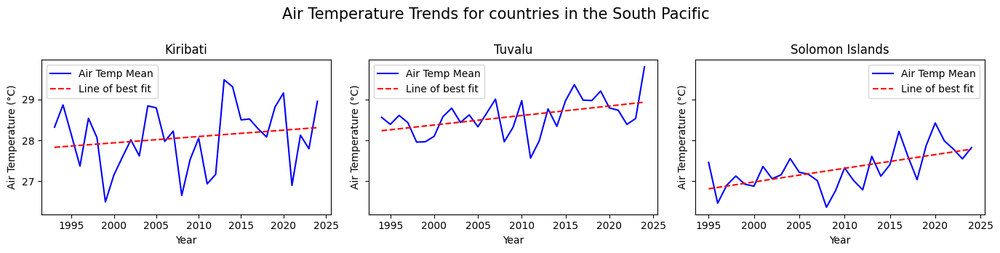

In [57]:
# Filter to include only the first month of each year
# first_month_data = all_countries[all_countries['Mth'] == 1]

# Get list of unique countries
# countries = first_month_data['Country'].unique()

# Set up the figure and subplots
n_countries = len(countries)
n_cols = 3
n_rows = int(np.ceil(n_countries / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 3.5 * n_rows), sharey=True)
axes = axes.flatten()

for i, country in enumerate(countries):
    country_data = first_month_data[first_month_data['Country'] == country]

    axes[i].plot(country_data['Year'], country_data['AirTemp_Mean'], linestyle='-', color='b', label='Air Temp Mean')

    # Fit a linear trend line using np.polyfit
    if not country_data.empty and len(country_data) > 1:  # Ensure there is enough data to fit a line
        slope, intercept = np.polyfit(country_data['Year'], country_data['AirTemp_Mean'], 1)
        axes[i].plot(country_data['Year'], slope * country_data['Year'] + intercept, linestyle='--', color='r', label='Line of best fit')

    axes[i].set_title(f'{country}')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Air Temperature (°C)')
    # axes[i].grid(True)
    axes[i].legend()

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
fig.suptitle("Air Temperature Trends for countries in the South Pacific", fontsize=15)
# plt.subplots_adjust(top=0.9)
plt.tight_layout(rect=[0, 0, 1, 0.98])
# plt.savefig('images/ALT.png')
plt.show()

Higher temperatures increase the evaporation of water, which – together with the lack of precipitation – increases the risks of severe droughts.

#### Barometric Pressure Levels

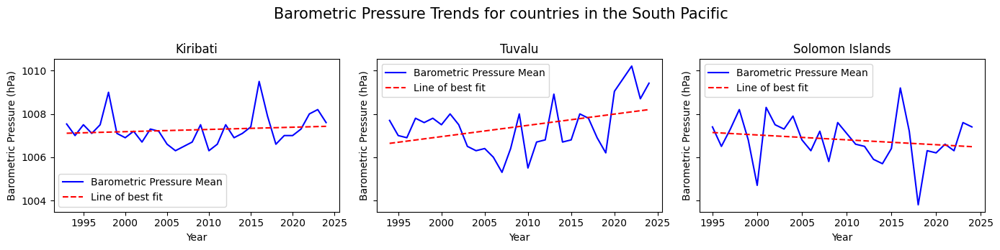

In [58]:
# Filter to include only the first month of each year
# first_month_data = all_countries[all_countries['Mth'] == 1]

# Get list of unique countries
# countries = first_month_data['Country'].unique()

# Set up the figure and subplots
n_countries = len(countries)
n_cols = 3
n_rows = int(np.ceil(n_countries / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 3.5 * n_rows), sharey=True)
axes = axes.flatten()

for i, country in enumerate(countries):
    country_data = first_month_data[first_month_data['Country'] == country]

    axes[i].plot(country_data['Year'], country_data['Pressure_Mean'], linestyle='-', color='b', label='Barometric Pressure Mean')

    # Fit a linear trend line using np.polyfit
    if not country_data.empty and len(country_data) > 1:  # Ensure there is enough data to fit a line
        slope, intercept = np.polyfit(country_data['Year'], country_data['Pressure_Mean'], 1)
        axes[i].plot(country_data['Year'], slope * country_data['Year'] + intercept, linestyle='--', color='r', label='Line of best fit')

    axes[i].set_title(f'{country}')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Barometric Pressure (hPa)')
    # axes[i].grid(True)
    axes[i].legend()

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
fig.suptitle("Barometric Pressure Trends for countries in the South Pacific", fontsize=15)
# plt.subplots_adjust(top=0.9)
plt.tight_layout(rect=[0, 0, 1, 0.98])
# plt.savefig('images/BPT.png')
plt.show()

A rise in barometric pressure is generally considered an improvement in the weather, while a fall in barometric pressure may mean worsening weather.

### Correlation between features

In [59]:
# Handle categorical data
label_encoder = LabelEncoder()
all_countries['Country'] = label_encoder.fit_transform(all_countries['Country'])

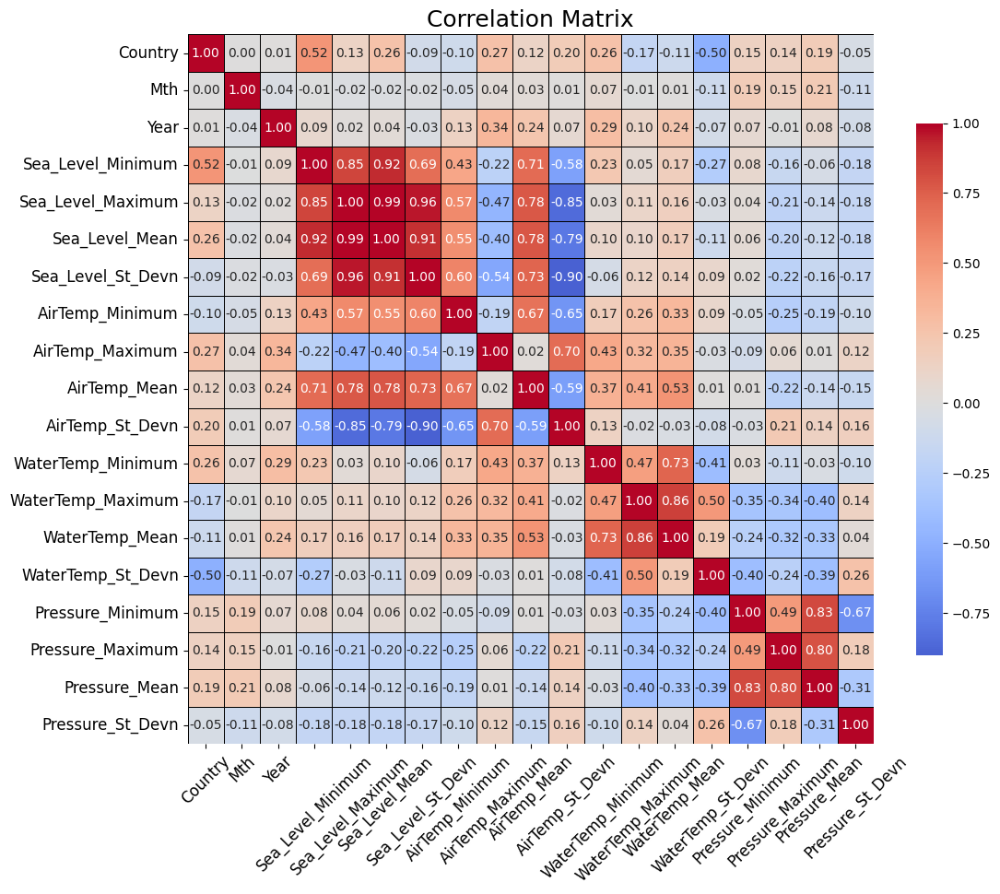

In [60]:
corr_matrix = all_countries.corr()

plt.figure(figsize=(12, 10))

# Create the heatmap
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', center=0,
            linewidths=0.5, linecolor='black', cbar_kws={"shrink": 0.75})

# Customize the plot
plt.title('Correlation Matrix', fontsize=18)
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12, rotation=0)
plt.show()

In [61]:
specific_feature = 'Sea_Level_Mean'
correlations_with_specific_feature = corr_matrix[specific_feature]

sorted_correlations = correlations_with_specific_feature.sort_values(ascending=False)

# Print the correlations
print(f"Correlations with {specific_feature}:")
print(sorted_correlations)

Correlations with Sea_Level_Mean:
Sea_Level_Mean       1.000000
Sea_Level_Maximum    0.985677
Sea_Level_Minimum    0.921299
Sea_Level_St_Devn    0.909219
AirTemp_Mean         0.783137
AirTemp_Minimum      0.549492
Country              0.261975
WaterTemp_Mean       0.170818
WaterTemp_Minimum    0.100567
WaterTemp_Maximum    0.097762
Pressure_Minimum     0.056052
Year                 0.038994
Mth                 -0.023077
WaterTemp_St_Devn   -0.110447
Pressure_Mean       -0.115676
Pressure_St_Devn    -0.182896
Pressure_Maximum    -0.204122
AirTemp_Maximum     -0.400828
AirTemp_St_Devn     -0.790764
Name: Sea_Level_Mean, dtype: float64


In [62]:
kiribati_corr = kiribati.drop(['Country'], axis = 1)
corr_matrix_kiribati = kiribati_corr.corr()

specific_feature = 'Sea_Level_Mean'
correlations_with_specific_feature = corr_matrix_kiribati[specific_feature]

sorted_correlations = correlations_with_specific_feature.sort_values(ascending=False)

correlation_table = pd.DataFrame(sorted_correlations).reset_index()
correlation_table.columns = ['Feature', 'Correlation']
correlation_table['Correlation'] = correlation_table['Correlation'].round(2)

# print("Correlations with target_feature:")
# print(correlation_table)
print(tabulate(correlation_table, headers='keys', tablefmt='pretty'))

+----+-------------------+-------------+
|    |      Feature      | Correlation |
+----+-------------------+-------------+
| 0  |  Sea_Level_Mean   |     1.0     |
| 1  | Sea_Level_Maximum |    0.69     |
| 2  | Sea_Level_Minimum |    0.66     |
| 3  |  WaterTemp_Mean   |    0.51     |
| 4  |  AirTemp_Maximum  |    0.51     |
| 5  | WaterTemp_Maximum |    0.47     |
| 6  |   AirTemp_Mean    |    0.44     |
| 7  |  AirTemp_St_Devn  |    0.43     |
| 8  | WaterTemp_Minimum |    0.34     |
| 9  | WaterTemp_St_Devn |    0.16     |
| 10 | Pressure_St_Devn  |    0.11     |
| 11 | Sea_Level_St_Devn |    0.02     |
| 12 |  AirTemp_Minimum  |    -0.11    |
| 13 | Pressure_Maximum  |    -0.13    |
| 14 |   Pressure_Mean   |    -0.21    |
| 15 | Pressure_Minimum  |    -0.24    |
+----+-------------------+-------------+


## Seasonality

### Kiribati

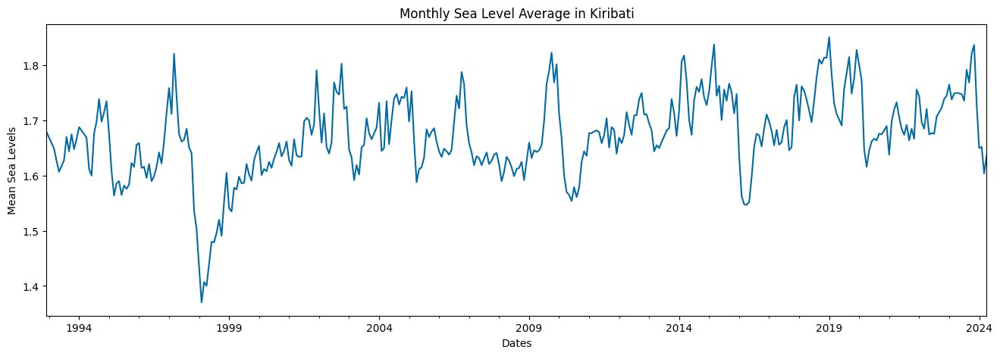

In [63]:
kiribati.index.freq = 'MS'
ax = kiribati['Sea_Level_Mean'].plot(figsize = (16,5), title = "Monthly Sea Level Average in Kiribati")
ax.set(xlabel='Dates', ylabel='Mean Sea Levels');
# plt.savefig('images/Kiribati-SLA.png')

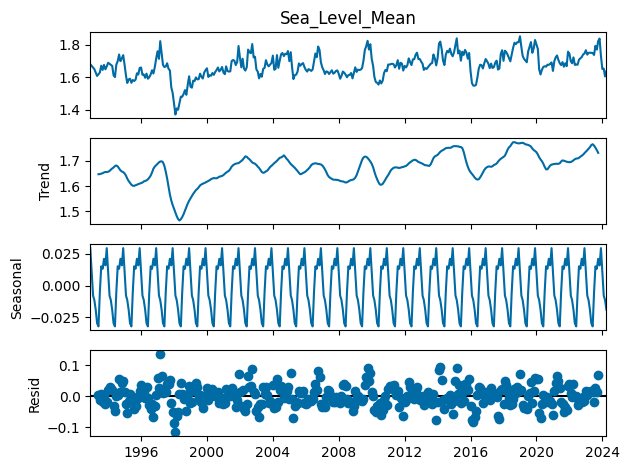

In [64]:
decomposition = sm.tsa.seasonal_decompose(kiribati["Sea_Level_Mean"],period =12)
figure = decomposition.plot()
# plt.savefig('images/Kiribati-season-decomp.png')
plt.show()

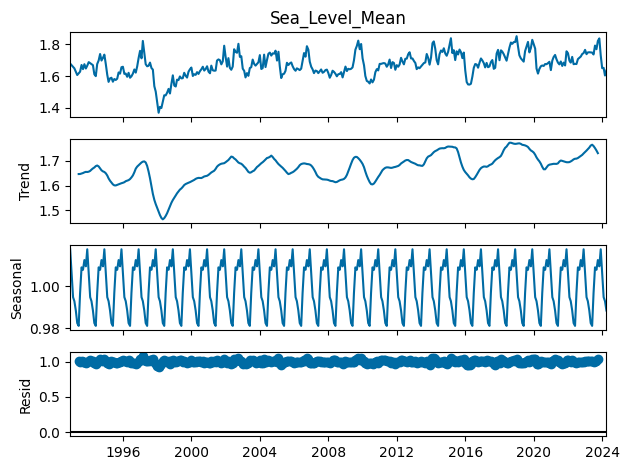

In [65]:
decomposition = sm.tsa.seasonal_decompose(kiribati["Sea_Level_Mean"],period =12, model = 'multiplicative')
figure = decomposition.plot()
plt.show()

### Solomon Islands

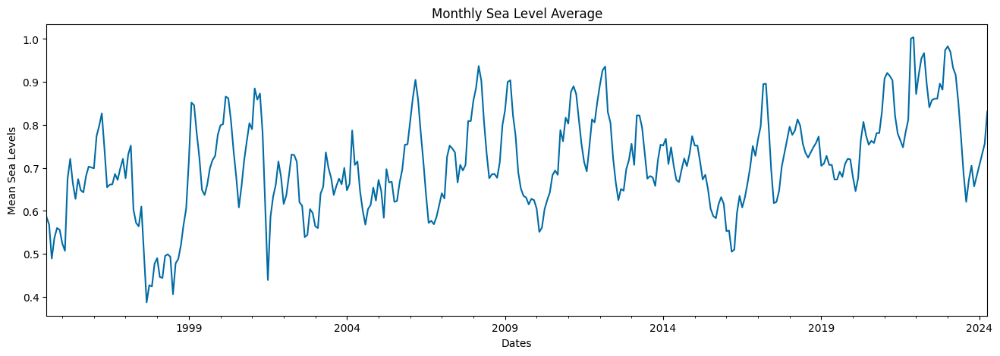

In [66]:
solomon_islands.index.freq = 'MS'
ax = solomon_islands['Sea_Level_Mean'].plot(figsize = (16,5), title = "Monthly Sea Level Average")
ax.set(xlabel='Dates', ylabel='Mean Sea Levels');

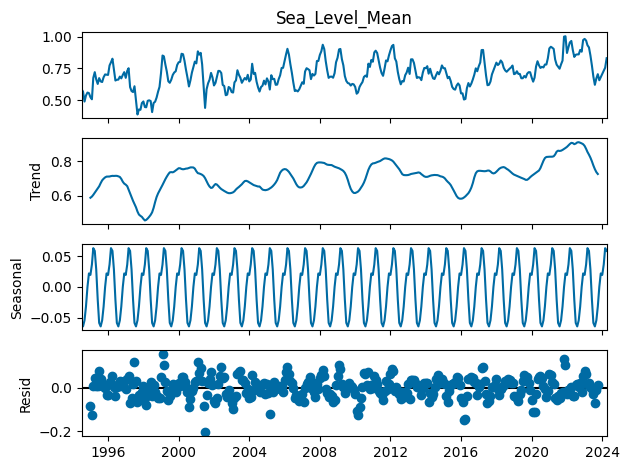

In [67]:
decomposition = sm.tsa.seasonal_decompose(solomon_islands["Sea_Level_Mean"],period =12)
figure = decomposition.plot()
plt.show()

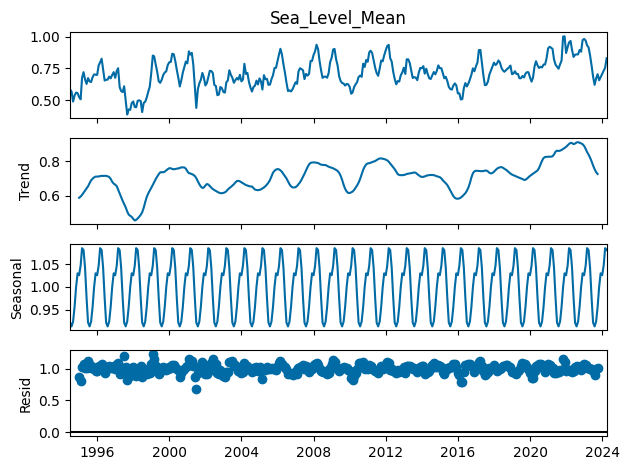

In [68]:
decomposition = sm.tsa.seasonal_decompose(solomon_islands["Sea_Level_Mean"],period =12, model = 'multiplicative')
figure = decomposition.plot()
plt.show()

### Tuvalu

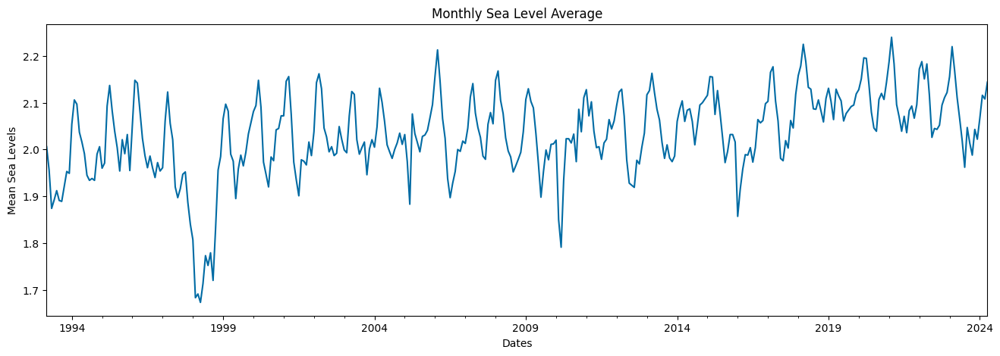

In [69]:
tuvalu.index.freq = 'MS'
ax = tuvalu['Sea_Level_Mean'].plot(figsize = (16,5), title = "Monthly Sea Level Average")
ax.set(xlabel='Dates', ylabel='Mean Sea Levels');

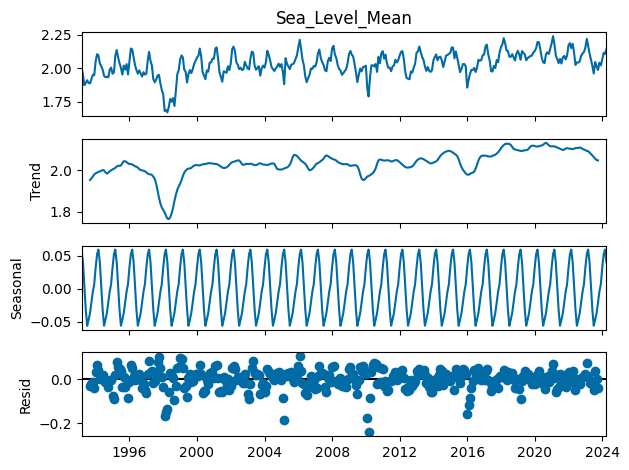

In [70]:
decomposition = sm.tsa.seasonal_decompose(tuvalu["Sea_Level_Mean"],period =12)
figure = decomposition.plot()
plt.show()

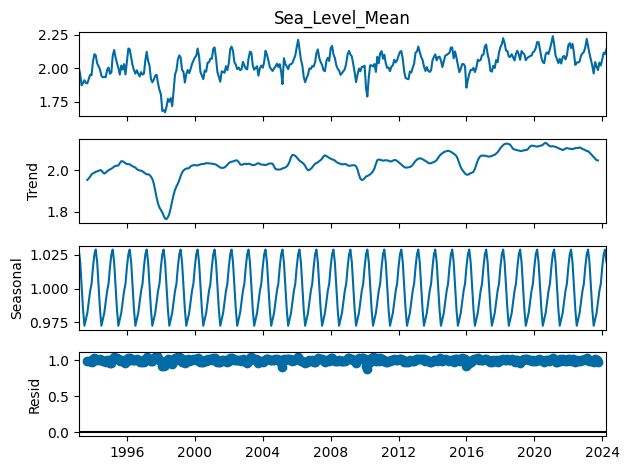

In [71]:
decomposition = sm.tsa.seasonal_decompose(tuvalu["Sea_Level_Mean"],period =12, model = 'multiplicative')
figure = decomposition.plot()
plt.show()

### All Countries

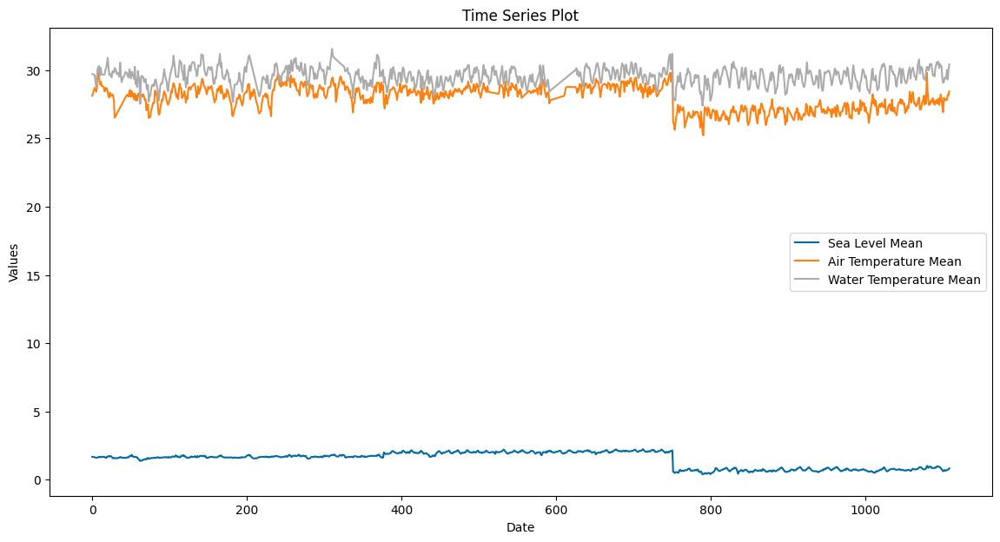

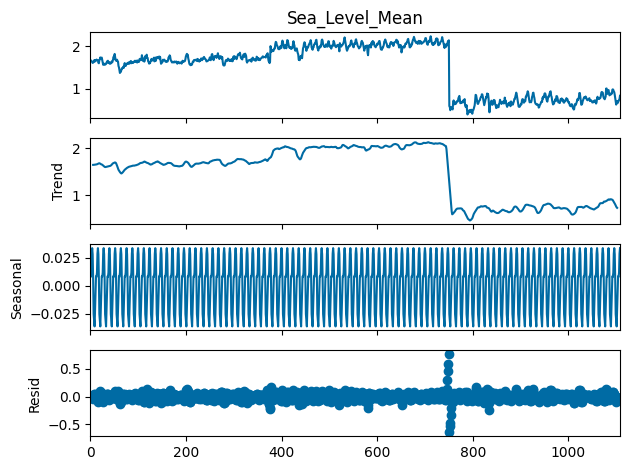

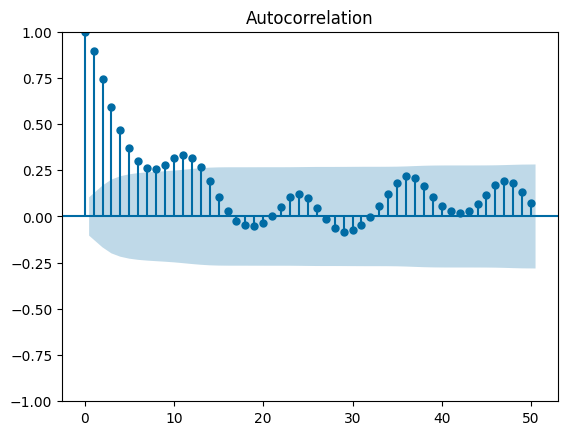

In [72]:
# Plot the time series
plt.figure(figsize=(14, 7))
plt.plot(all_countries['Sea_Level_Mean'], label='Sea Level Mean')
plt.plot(all_countries['AirTemp_Mean'], label='Air Temperature Mean')
plt.plot(all_countries['WaterTemp_Mean'], label='Water Temperature Mean')
# plt.plot(all_countries['Pressure_Mean'], label='Bariometric Pressure Mean')
plt.xlabel('Date')
plt.ylabel('Values')
plt.title('Time Series Plot')
plt.legend()
plt.show()

# Decompose the time series
result = seasonal_decompose(all_countries['Sea_Level_Mean'].dropna(), model='additive', period=12)
result.plot()
plt.show()

# Plot the autocorrelation function
plot_acf(solomon_islands['Sea_Level_Mean'].dropna(), lags=50)
# plt.savefig('images/autocorrelation.png')
plt.show()

# Plot the partial autocorrelation function
# plot_pacf(solomon_islands['Sea_Level_Mean'].dropna(), lags=50)
# plt.savefig('images/partial-autocorrelation.png')
plt.show()

In [73]:
if 'Mth' in all_countries.columns:
    all_countries.rename(columns={'Mth': 'Month'}, inplace=True)

# Convert 'Mth' and 'Year' to datetime
all_countries['Date'] = pd.to_datetime(all_countries[['Year', 'Month']].assign(DAY=1))
all_countries = all_countries.set_index('Date')

# Drop original 'Mth' and 'Year' columns
all_countries = all_countries.drop(columns=['Month', 'Year'])

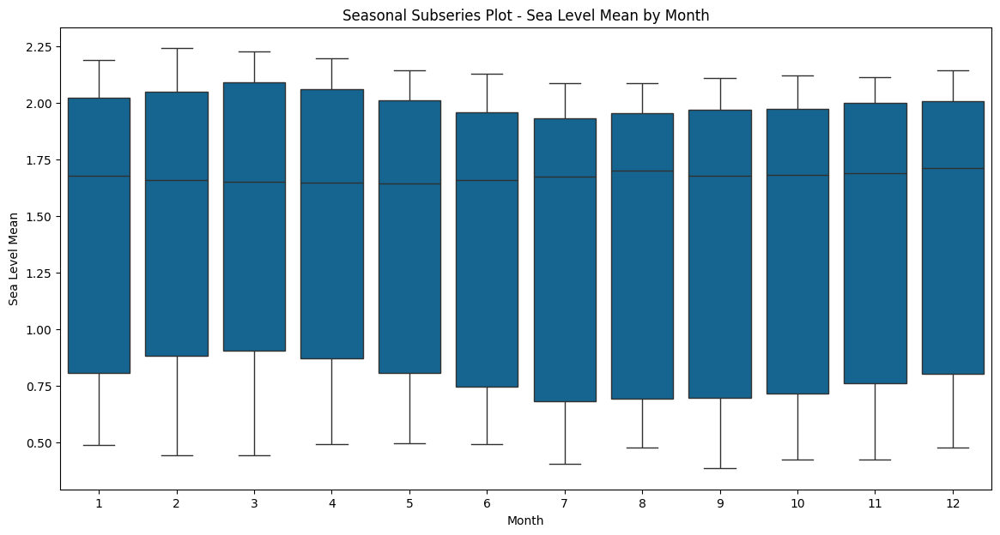

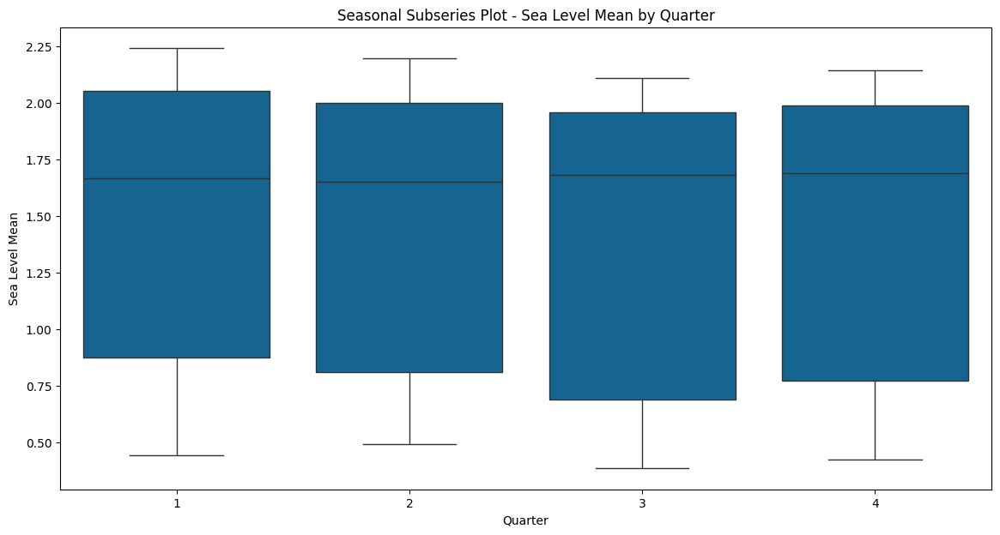

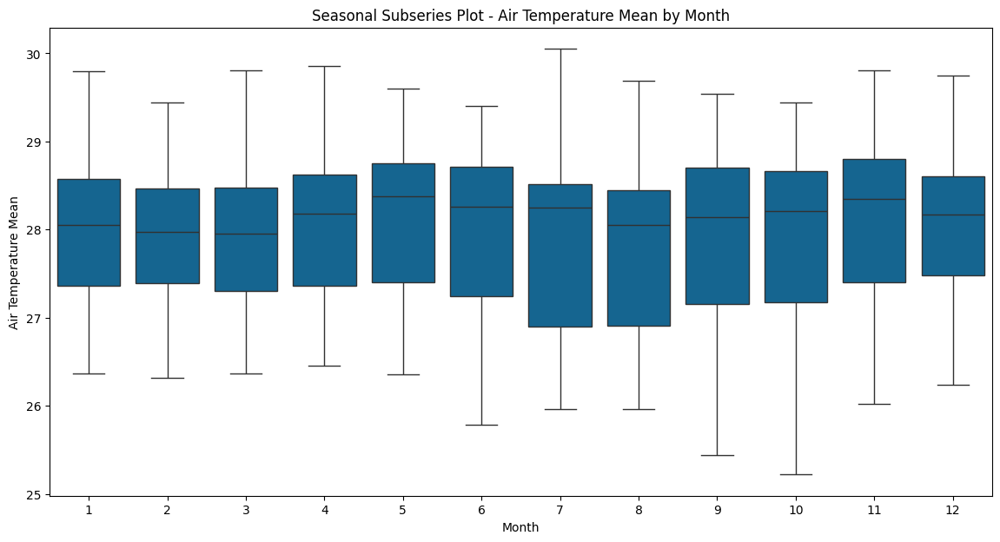

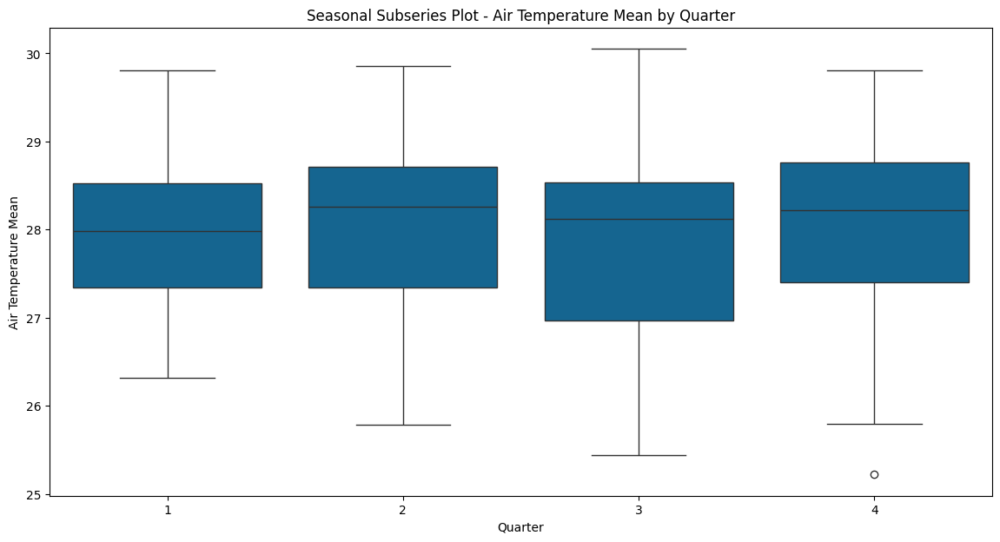

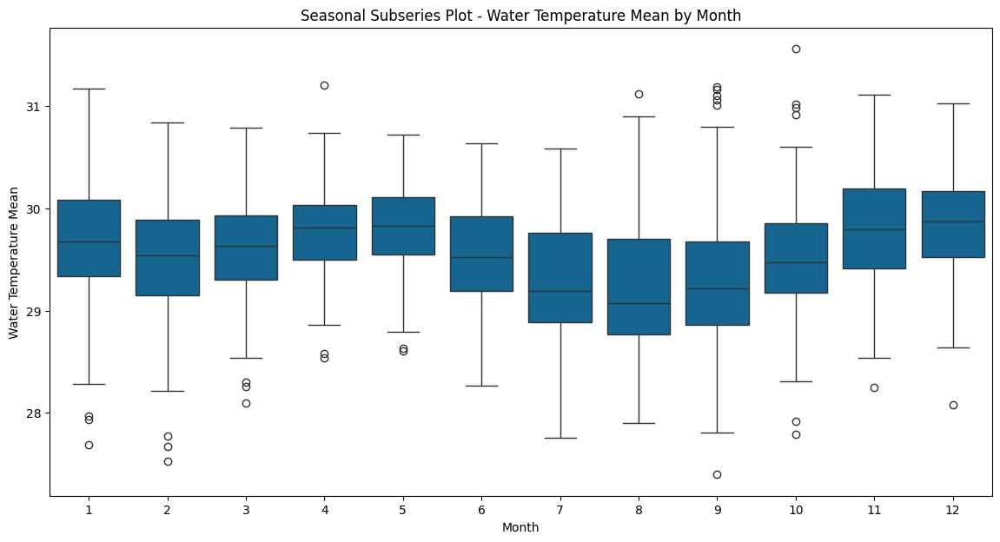

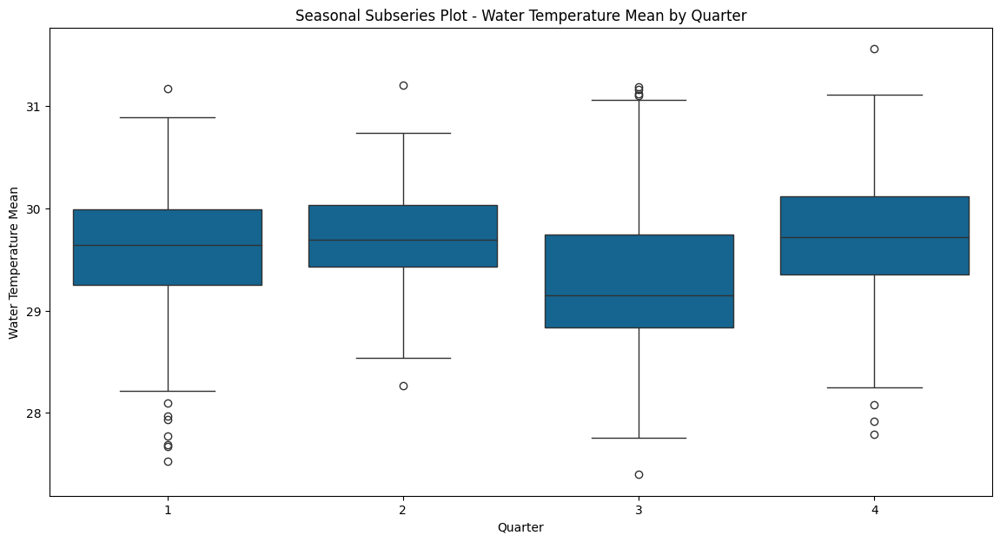

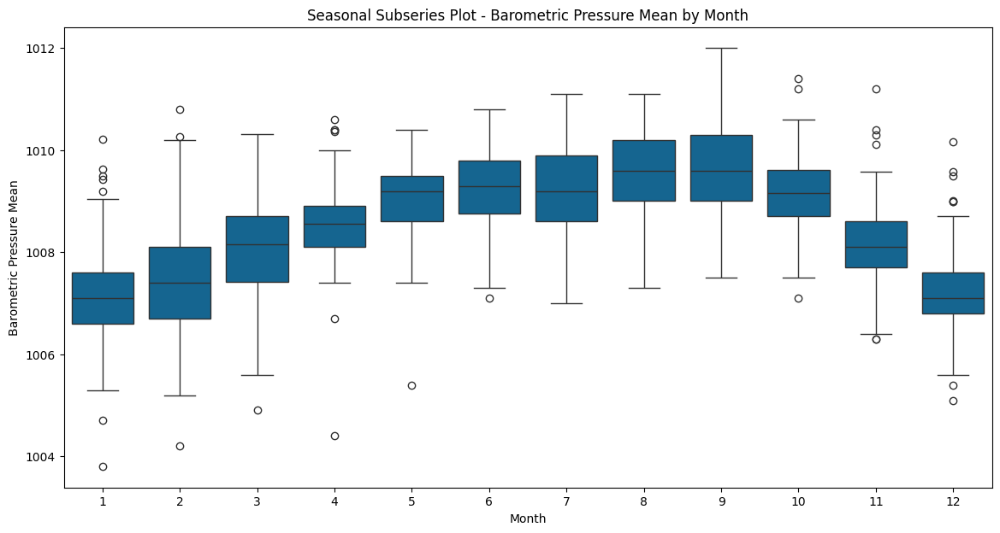

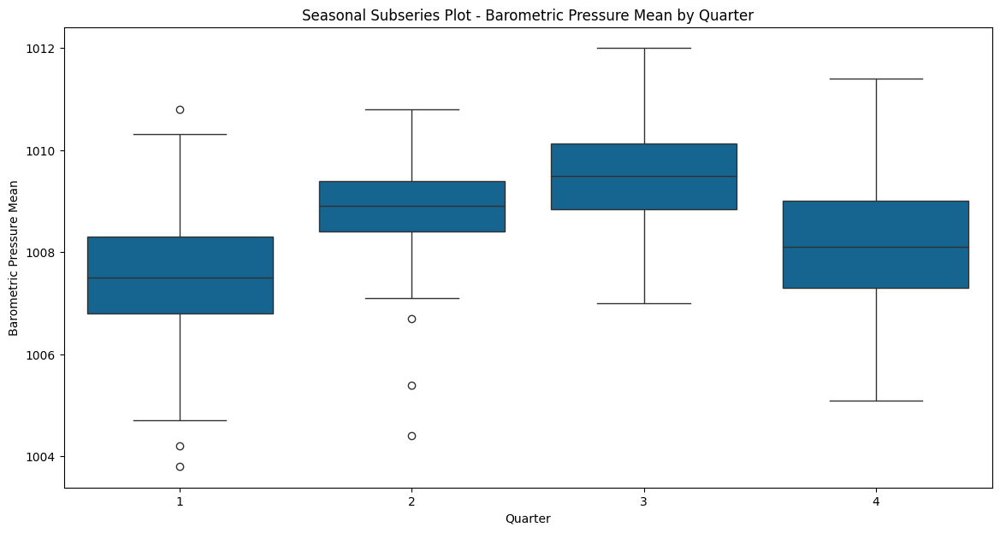

In [74]:
# Extract seasonal information
all_countries['Month'] = all_countries.index.month
all_countries['Quarter'] = all_countries.index.quarter

# Seasonal Subseries Plot for Monthly Data
plt.figure(figsize=(14, 7))
sns.boxplot(x='Month', y='Sea_Level_Mean', data=all_countries)
plt.xlabel('Month')
plt.ylabel('Sea Level Mean')
plt.title('Seasonal Subseries Plot - Sea Level Mean by Month')
plt.show()

# Seasonal Subseries Plot for Quarterly Data
plt.figure(figsize=(14, 7))
sns.boxplot(x='Quarter', y='Sea_Level_Mean', data=all_countries)
plt.xlabel('Quarter')
plt.ylabel('Sea Level Mean')
plt.title('Seasonal Subseries Plot - Sea Level Mean by Quarter')
plt.show()

# Similarly for Air Temperature Mean
plt.figure(figsize=(14, 7))
sns.boxplot(x='Month', y='AirTemp_Mean', data=all_countries)
plt.xlabel('Month')
plt.ylabel('Air Temperature Mean')
plt.title('Seasonal Subseries Plot - Air Temperature Mean by Month')
plt.show()

plt.figure(figsize=(14, 7))
sns.boxplot(x='Quarter', y='AirTemp_Mean', data=all_countries)
plt.xlabel('Quarter')
plt.ylabel('Air Temperature Mean')
plt.title('Seasonal Subseries Plot - Air Temperature Mean by Quarter')
plt.show()

# Similarly for Water Temperature Mean
plt.figure(figsize=(14, 7))
sns.boxplot(x='Month', y='WaterTemp_Mean', data=all_countries)
plt.xlabel('Month')
plt.ylabel('Water Temperature Mean')
plt.title('Seasonal Subseries Plot - Water Temperature Mean by Month')
plt.show()

plt.figure(figsize=(14, 7))
sns.boxplot(x='Quarter', y='WaterTemp_Mean', data=all_countries)
plt.xlabel('Quarter')
plt.ylabel('Water Temperature Mean')
plt.title('Seasonal Subseries Plot - Water Temperature Mean by Quarter')
plt.show()

# Similarly for Barometric Pressure Mean
plt.figure(figsize=(14, 7))
sns.boxplot(x='Month', y='Pressure_Mean', data=all_countries)
plt.xlabel('Month')
plt.ylabel('Barometric Pressure Mean')
plt.title('Seasonal Subseries Plot - Barometric Pressure Mean by Month')
plt.show()

plt.figure(figsize=(14, 7))
sns.boxplot(x='Quarter', y='Pressure_Mean', data=all_countries)
plt.xlabel('Quarter')
plt.ylabel('Barometric Pressure Mean')
plt.title('Seasonal Subseries Plot - Barometric Pressure Mean by Quarter')
plt.show()

# Machine Learning Models

**Time-Series:**

ARIMA/SARIMA: Good for univariate time series.

LSTM (Recurrent Neural Networks): For capturing long-term dependencies in time-series data.

**Regression:**

Linear Regression: Simple and interpretable.

Random Forest Regressor: Handles non-linear relationships well.

Gradient Boosting (e.g., XGBoost, LightGBM): Powerful for capturing complex patterns.

## Kiribati

### Train and Test Split

In [75]:
X = kiribati.drop(columns=['Sea_Level_Mean'])
y = kiribati['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

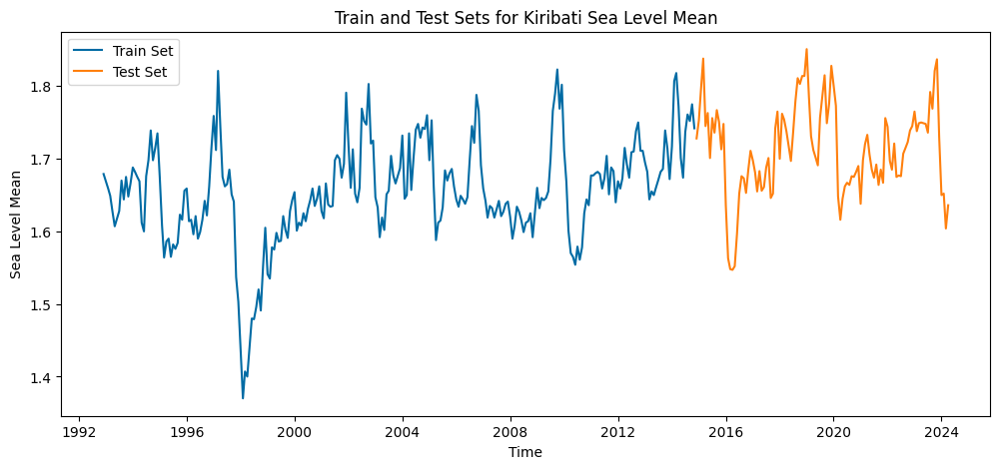

In [76]:
# Plot the training and testing sets
plt.figure(figsize=(12, 5))
plt.plot(y_train.index, y_train, label='Train Set')
plt.plot(y_test.index, y_test, label='Test Set')
plt.xlabel('Time')
plt.ylabel('Sea Level Mean')
plt.title('Train and Test Sets for Kiribati Sea Level Mean')
plt.legend()
plt.show()

### Basic models

#### Linear Regression - Baseline

In [77]:
np.random.seed(42)
# from matplotlib import pyplot
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Model evaluation
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse}')

mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2:.6f}")

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape:.2f}%")

mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae:.2f}%")

Root Mean Squared Error: 0.029644843514143746
Mean Squared Error: 0.0008788167469780706
R-squared: 0.774296
Mean Absolute Percentage Error: 1.38%
Mean Absolute Error: 0.02%


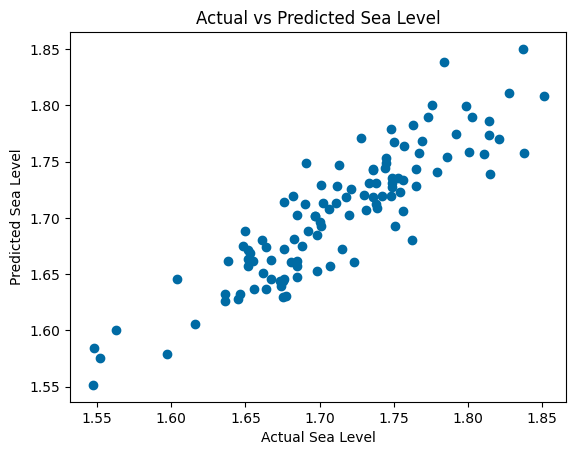

In [78]:
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Sea Level')
plt.ylabel('Predicted Sea Level')
plt.title('Actual vs Predicted Sea Level')
plt.show()

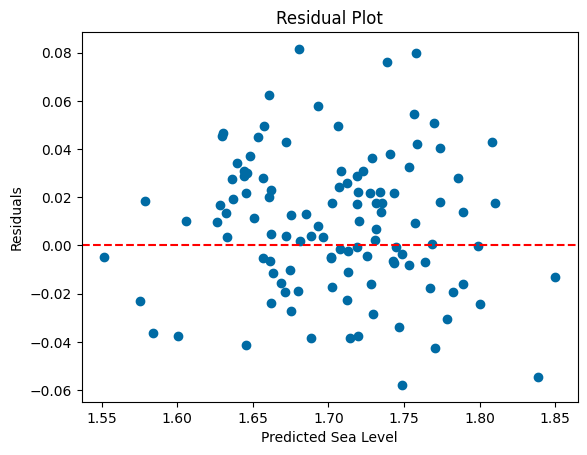

In [79]:
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.xlabel('Predicted Sea Level')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

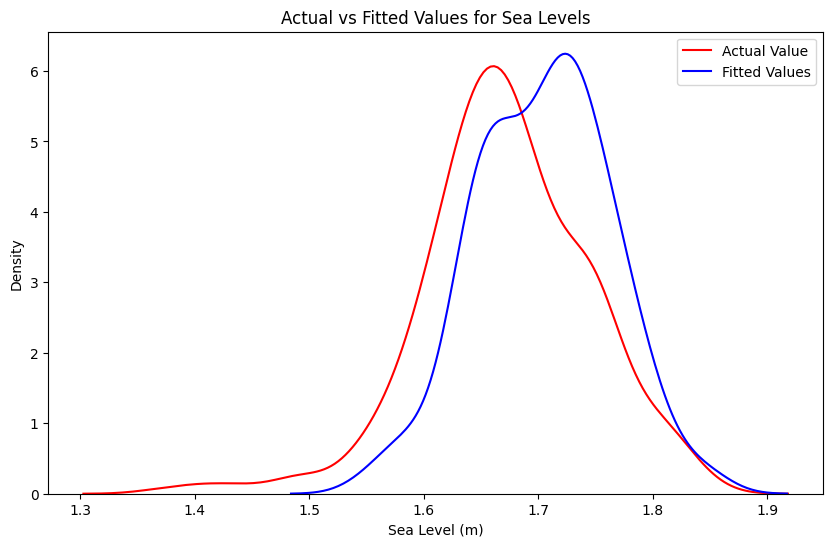

In [80]:
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(y, color="r", label="Actual Value")
sns.kdeplot(y_pred, color="b", label="Fitted Values", ax=ax1)

plt.title('Actual vs Fitted Values for Sea Levels')
plt.xlabel('Sea Level (m)')
plt.ylabel('Density')

plt.legend()
plt.show()
plt.close()

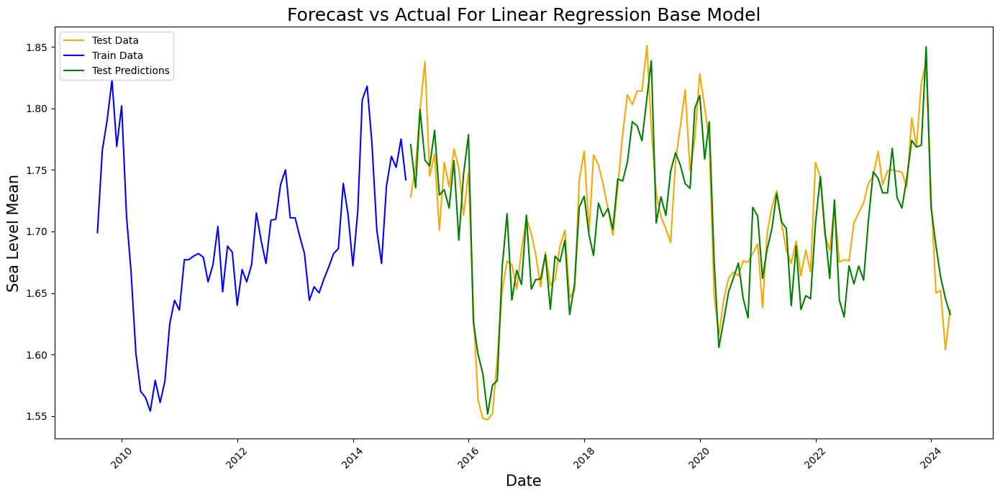

In [81]:
# Create date ranges for training, test, and forecast data
y_train = y_train['2009-07-01':]
train_dates = pd.date_range(start=y_train.index[-len(y_train)], periods=len(y_train), freq='M')
test_dates = pd.date_range(start=y.index[-len(y_pred)], periods=len(y_pred), freq='M')

# Convert results to DataFrames
train_values_df = pd.DataFrame(y_train.values, index=train_dates)
test_predictions_df = pd.DataFrame(y_pred, index=test_dates)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
# Use .to_timestamp() to align the index types
plt.plot(test_predictions_df.index, y_test.values, label='Test Data', color='orange')
plt.plot(train_values_df.index, y_train.values, label='Train Data', color='blue')

# Plot forecast data
# plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Forecasted Data', color='red')
plt.plot(test_predictions_df.index, y_pred, label='Test Predictions', color='green')
# plt.plot(train_predictions_df.index, train_predictions_df.values, label='Train Predictions', color='purple')

# Show the plot
plt.title('Forecast vs Actual For Linear Regression Base Model', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


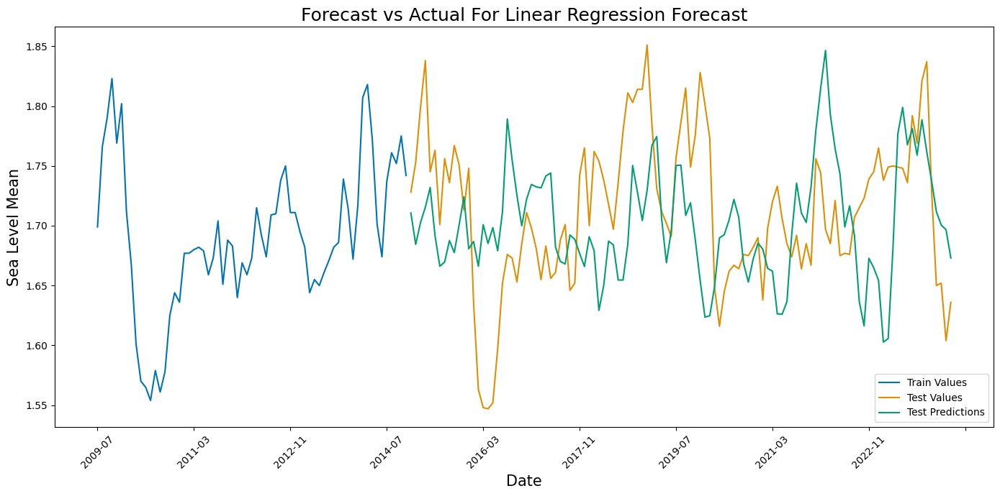

Root Mean Squared Error: 0.07518238138213011
Mean Squared Error: 0.005652390470288065
R-squared: -0.451687
Mean Absolute Percentage Error: 3.63%
Mean Absolute Error: 0.06%


In [82]:
X = kiribati_dat.drop(columns=['Sea_Level_Mean'])
y = kiribati_dat['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Linear regression forecaster
regressor = LinearRegression()
forecaster = make_reduction(regressor, window_length=180, strategy="recursive")

# Fit and predict
forecaster.fit(y_train)
y_pred = forecaster.predict(fh=fh)

fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["Train Values", "Test Values", "Test Predictions"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual For Linear Regression Forecast', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse}')

mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2:.6f}")

mape = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape:.2f}%")

mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae:.2f}%")

#### XGBRegressor

In [83]:
import xgboost as xgb

np.random.seed(42)
X = kiribati_dat.drop(columns=['Sea_Level_Mean'])
y = kiribati_dat['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Initialize the XGBoost Regressor
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Train the model
xgb_model.fit(X_train, y_train)

# Perform predictions
train_predictions = xgb_model.predict(X_train)
test_predictions = xgb_model.predict(X_test)

# Calculate evaluation metrics
def calculate_metrics(true_values, predicted_values):
    mse = mean_squared_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(true_values, predicted_values)
    mape = np.mean(np.abs((true_values - predicted_values) / true_values)) * 100
    r2 = r2_score(true_values, predicted_values)
    return mse, rmse, mae, mape, r2

# Calculate metrics for training data
train_mse, train_rmse, train_mae, train_mape, train_r2 = calculate_metrics(y_train, train_predictions)
print(f'Training MSE: {train_mse}, RMSE: {train_rmse}, MAE: {train_mae}, MAPE: {train_mape}, R-squared: {train_r2}')

# Calculate metrics for test data
test_mse, test_rmse, test_mae, test_mape, test_r2 = calculate_metrics(y_test, test_predictions)
print(f'Test MSE: {test_mse}, RMSE: {test_rmse}, MAE: {test_mae}, MAPE: {test_mape}, R-squared: {test_r2}')


Training MSE: 6.260556769731277e-07, RMSE: 0.00079123680208464, MAE: 0.0005793985417394869, MAPE: 0.03501298149405596, R-squared: 0.9998740499476623
Test MSE: 0.0016413509648611048, RMSE: 0.040513589878719766, MAE: 0.033122265444392646, MAPE: 1.9260083198232234, R-squared: 0.5784566467240732


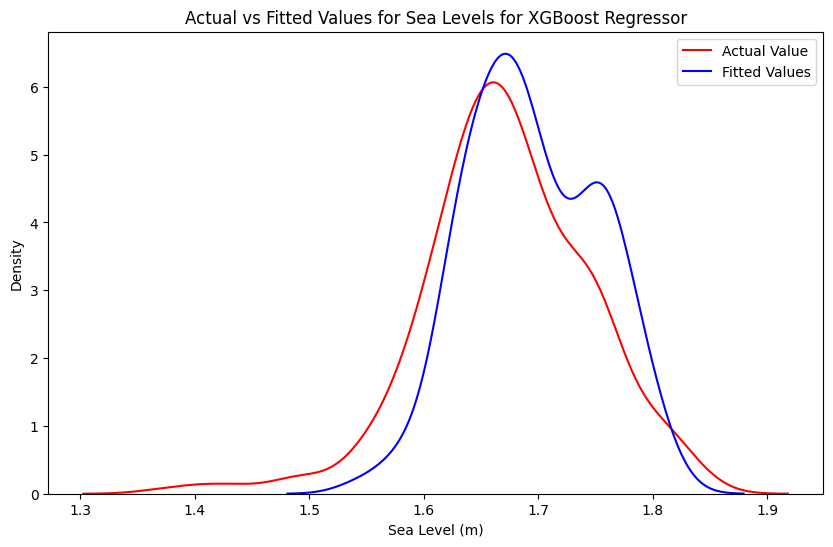

In [84]:
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(y, color="r", label="Actual Value")
sns.kdeplot(test_predictions, color="b", label="Fitted Values", ax=ax1)

plt.title('Actual vs Fitted Values for Sea Levels for XGBoost Regressor')
plt.xlabel('Sea Level (m)')
plt.ylabel('Density')

plt.legend()
plt.show()
plt.close()

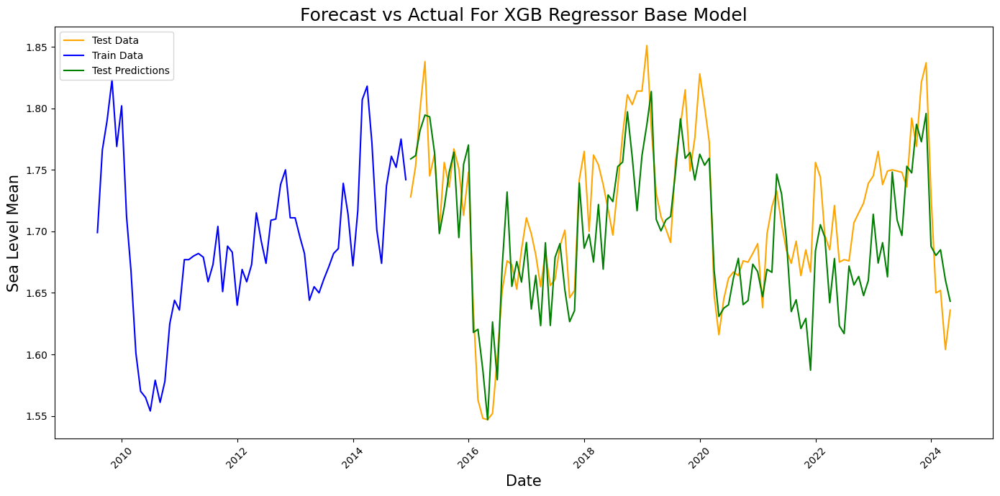

In [85]:
# Create date ranges for training, test, and forecast data
y_train = y_train['2009-07-01':]
train_dates = pd.date_range(start=y_train.index[-len(y_train)].to_timestamp(), periods=len(y_train), freq='M')
test_dates = pd.date_range(start=y.index[-len(test_predictions)].to_timestamp(), periods=len(test_predictions), freq='M')

# Convert results to DataFrames
train_values_df = pd.DataFrame(y_train.values, index=train_dates)
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
# Use .to_timestamp() to align the index types
plt.plot(test_predictions_df.index, y_test.values, label='Test Data', color='orange')
plt.plot(train_values_df.index, y_train.values, label='Train Data', color='blue')

# Plot forecast data
# plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Forecasted Data', color='red')
plt.plot(test_predictions_df.index, test_predictions_df.values, label='Test Predictions', color='green')
# plt.plot(train_predictions_df.index, train_predictions_df.values, label='Train Predictions', color='purple')

# Show the plot
plt.title('Forecast vs Actual For XGB Regressor Base Model', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

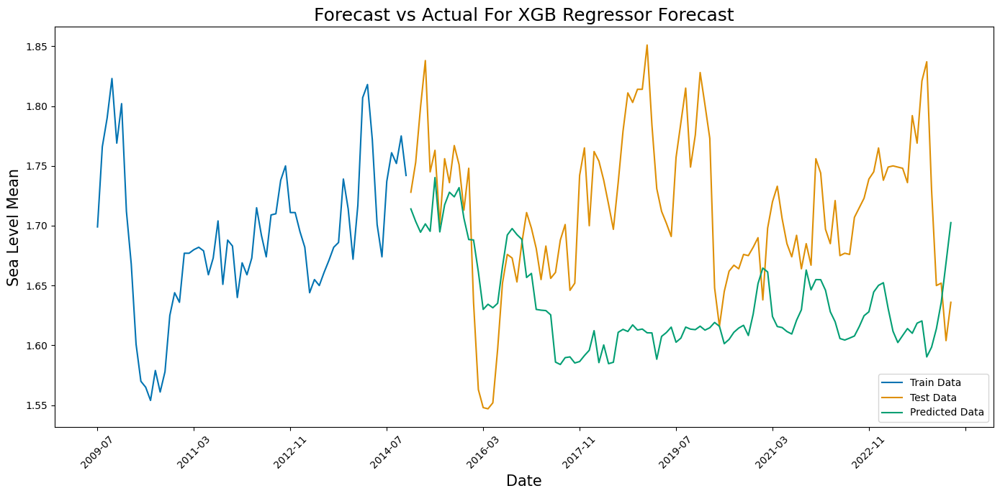

Root Mean Squared Error: 0.10885568604738412
Mean Squared Error: 0.011849560384846658
R-squared : -2.043288
Mean Absolute Percentage Error: 5.28%
Mean Absolute Error: 0.09%


In [86]:
np.random.seed(42)
X = kiribati_dat.drop(columns=['Sea_Level_Mean'])
y = kiribati_dat['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# XGBoost forecaster
regressor = XGBRegressor(objective='reg:squarederror', r0andom_state=42)
forecaster = make_reduction(regressor, window_length=60, strategy="recursive")

# Fit and predict
forecaster.fit(y=y_train, X=X_train)
y_pred = forecaster.predict(fh=fh, X=X_test)

fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["Train Data", "Test Data", "Predicted Data"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
# Show the plot
plt.title('Forecast vs Actual For XGB Regressor Forecast', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
rmse_xgb = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse_xgb}')

mse_xgb = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse_xgb}')

r2_xgb = r2_score(y_test, y_pred)
print(f"R-squared : {r2_xgb:.6f}")

mape_xgb = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape_xgb:.2f}%")

mae_xgb = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae_xgb:.2f}%")

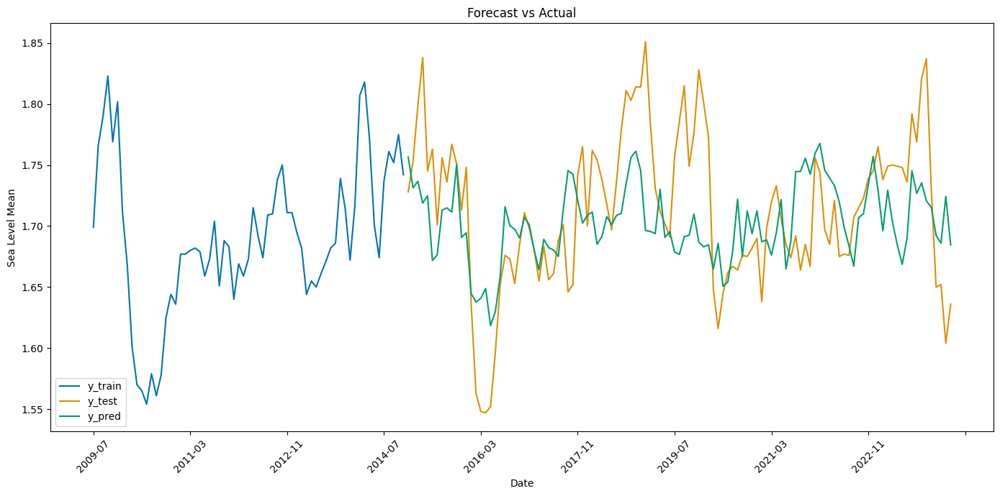

Root Mean Squared Error: 0.05595880141218142
Mean Squared Error: 0.0031313874554879575
R-squared: 0.195775
Mean Absolute Percentage Error: 2.54%
Mean Absolute Error: 0.04%


In [87]:
np.random.seed(42)
X = kiribati_dat.drop(columns=['Sea_Level_Mean'])
y = kiribati_dat['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Window for cross-validation
validation_size = 26
cv = SingleWindowSplitter(window_length=len(y)-validation_size, fh=validation_size)

# XGBoost forecaster with grid of parameters and detrender and deseasonaliser
regressor = XGBRegressor(objective='reg:squarederror', random_state=42)
forecaster = TransformedTargetForecaster(
    [
        ("deseasonalize", Deseasonalizer(model="multiplicative", sp=52)),
        ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=1))),
        ("forecast", make_reduction(regressor, window_length=195, strategy="recursive"),
        ),
    ]
)

# Param grid
param_grid = {
    'deseasonalize__model': ['multiplicative', 'additive'],
    'detrend__forecaster__degree': [1, 2, 3],
    'forecast__estimator__max_depth': [3, 5, 6, 10, 15, 20],
    'forecast__estimator__learning_rate': [0.01, 0.1, 0.2, 0.3],
    'forecast__estimator__subsample': np.arange(0.5, 1.0, 0.1),
    'forecast__estimator__colsample_bytree': np.arange(0.4, 1.0, 0.1),
    'forecast__estimator__colsample_bylevel': np.arange(0.4, 1.0, 0.1),
    'forecast__estimator__n_estimators': [100, 500, 1000]
}

# Randomised search
gscv = ForecastingRandomizedSearchCV(forecaster, cv=cv, param_distributions=param_grid, n_iter=100, random_state=42)

# Fit and predict
gscv.fit(y=y_train, X=X_train)
y_pred = gscv.predict(fh=fh, X=X_test)

fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sea Level Mean')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
# Model evaluation
rmse_xgb = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse_xgb}')

mse_xgb = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse_xgb}')

r2_xgb = r2_score(y_test, y_pred)
print(f"R-squared: {r2_xgb:.6f}")

mape_xgb = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape_xgb:.2f}%")

mae_xgb = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae_xgb:.2f}%")

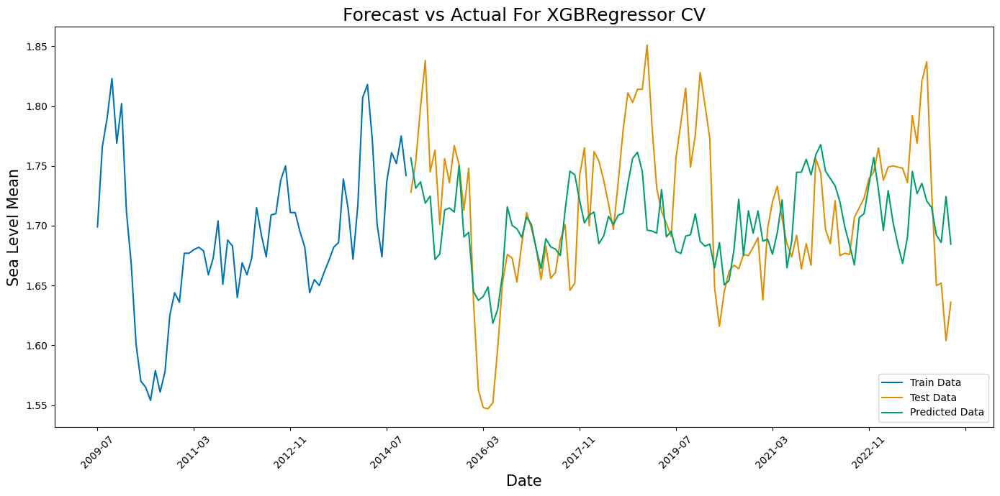

In [88]:
fig, ax = plt.subplots(figsize=(14, 7))
plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["Train Data", "Test Data", "Predicted Data"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual For XGBRegressor CV', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### Random Forest Regressor

In [89]:
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)
np.random.seed(42)
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

# Predictions
y_pred_rf = rf_model.predict(X_test)

# Model evaluation
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

mae_rf = mean_absolute_error(y_test, y_pred_rf)
print(f"Mean Absolute Error (Random Forest): {mae_rf:.2f}%")

Root Mean Squared Error (Random Forest): 0.03807289289897934
Mean Squared Error (Random Forest): 0.0014495451736971513
R-squared (Random Forest): 0.627718
Mean Absolute Percentage Error (Random Forest): 1.76%
Mean Absolute Error (Random Forest): 0.03%


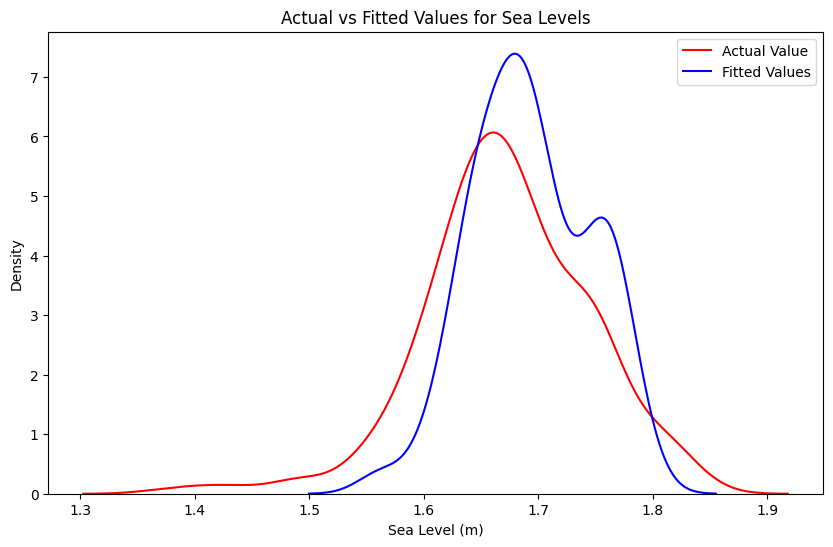

In [90]:
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(y, color="r", label="Actual Value")
sns.kdeplot(y_pred_rf, color="b", label="Fitted Values", ax=ax1)

plt.title('Actual vs Fitted Values for Sea Levels')
plt.xlabel('Sea Level (m)')
plt.ylabel('Density')

plt.legend()
plt.show()
plt.close()

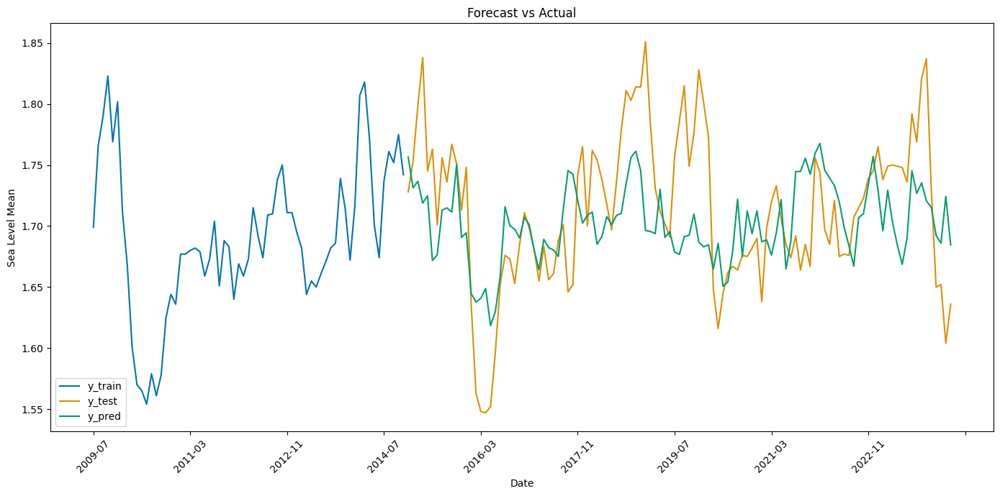

Root Mean Squared Error (Random Forest): 0.07389800230214483
Mean Squared Error (Random Forest): 0.005460914744247801
R-squared (Random Forest): -0.402511
Mean Absolute Percentage Error (Random Forest): 3.53%
Mean Absolute Error (Random Forest): 0.06%


In [91]:
np.random.seed(42)
X = kiribati_dat.drop(columns=['Sea_Level_Mean'])
y = kiribati_dat['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False, freq='M')

# Linear regression forecaster
regressor = RandomForestRegressor()
forecaster = make_reduction(regressor, window_length=170, strategy="recursive")

# Fit and predict
forecaster.fit(y_train)
y_pred_rf = forecaster.predict(fh=fh)

# Plot predictions with training and test data
fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sea Level Mean')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

mae_rf = mean_absolute_error(y_test, y_pred_rf)
print(f"Mean Absolute Error (Random Forest): {mae_rf:.2f}%")

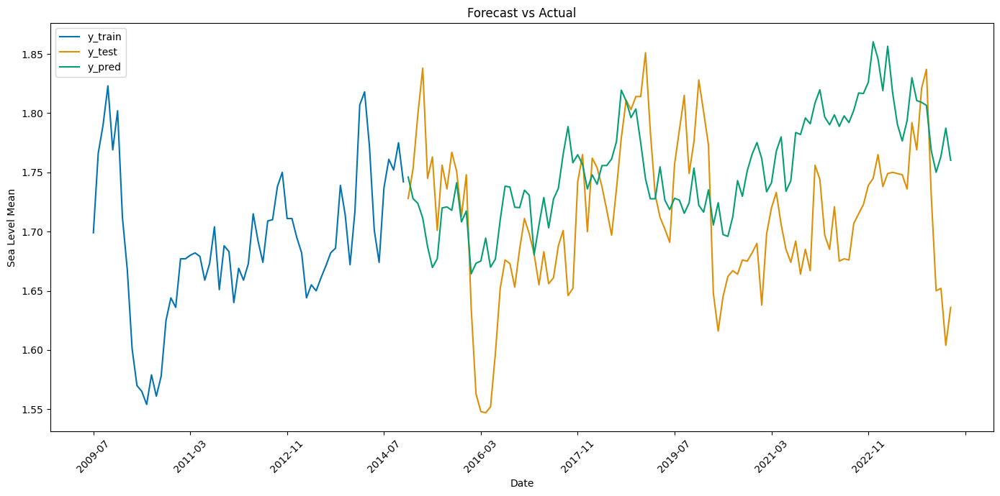

Root Mean Squared Error (Random Forest): 0.0737477287269125
Mean Squared Error (Random Forest): 0.005438727492378274
R-squared (Random Forest): -0.396812
Mean Absolute Percentage Error (Random Forest): 3.71%
Mean Absolute Error (Random Forest): 0.06%


In [92]:
np.random.seed(42)
X = kiribati_dat.drop(columns=['Sea_Level_Mean'])
y = kiribati_dat['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Window for cross-validation
validation_size = 26
cv = SingleWindowSplitter(window_length=len(y)-validation_size, fh=validation_size)

# XGBoost forecaster with grid of parameters and detrender and deseasonaliser
regressor = RandomForestRegressor()
forecaster = TransformedTargetForecaster(
    [
        ("deseasonalize", Deseasonalizer(model="multiplicative", sp=52)),
        ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=1))),
        ("forecast", make_reduction(regressor, window_length=195, strategy="recursive"),
        ),
    ]
)

# Param grid
param_grid = {
    'deseasonalize__model': ['multiplicative', 'additive'],
    'detrend__forecaster__degree': [1, 2, 3],
    'forecast__estimator__max_depth': [3, 5, 6, 10, 15, 20],
    'forecast__estimator__n_estimators': [100, 200, 300]
}

# Randomised search
gscv = ForecastingRandomizedSearchCV(forecaster, cv=cv, param_distributions=param_grid, n_iter=100, random_state=42)

# Fit and predict
gscv.fit(y=y_train, X=X_train)
y_pred = gscv.predict(fh=fh, X=X_test)

# Plot predictions with training and test data
fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sea Level Mean')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
rmse_rf = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

mae_rf = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error (Random Forest): {mae_rf:.2f}%")

In [93]:
mae_rf = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error (Random Forest): {mae_rf:.2f}%")

Mean Absolute Error (Random Forest): 0.06%


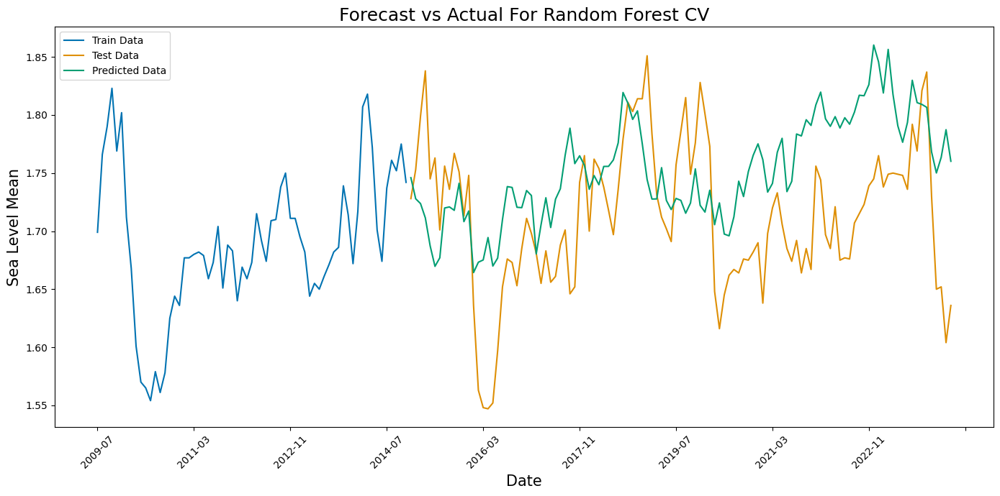

In [94]:
# Plot predictions with training and test data
fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["Train Data", "Test Data", "Predicted Data"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual For Random Forest CV', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### ARIMA

In [95]:
# pip install pmdarima

In [96]:
auto_arima(kiribati['Sea_Level_Mean'], seasonal=True, m=12,max_p=7, max_d=5,max_q=7, max_P=4, max_D=4,max_Q=4).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  377
Model:               SARIMAX(0, 1, 0)   Log Likelihood                 700.473
Date:                Sat, 24 Aug 2024   AIC                          -1398.946
Time:                        19:47:10   BIC                          -1395.017
Sample:                    12-01-1992   HQIC                         -1397.386
                         - 04-01-2024                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0014   9.09e-05     15.506      0.000       0.001       0.002
===================================================================================
Ljung-Box (L1) (Q):                   0.40   Jarque-Bera (JB):                 9.87
Prob(Q):                              0.53   Prob(JB):                         0.01
Heteroskedasticity (H):               1.08   Skew:                            -0.28
Prob(H) (two-sided):                  0.67   Kurtosis:                         3.55
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [97]:
X = kiribati.drop(columns=['Sea_Level_Mean'])
y = kiribati['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

arima_model = SARIMAX(y_train, order = (2,1,1), seasonal_order = (6,2,3,12)) # 4,0,3,12
arima_result = arima_model.fit()
arima_result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                         SARIMAX Results                                          
==================================================================================================
Dep. Variable:                             Sea_Level_Mean   No. Observations:                  331
Model:             SARIMAX(2, 1, 1)x(6, 2, [1, 2, 3], 12)   Log Likelihood                 523.959
Date:                                    Sat, 24 Aug 2024   AIC                          -1021.917
Time:                                            19:49:48   BIC                           -973.511
Sample:                                        12-01-1992   HQIC                         -1002.558
                                             - 06-01-2020                                         
Covariance Type:                                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0803      0.987     -0.081      0.935      -2.015       1.855
ar.L2         -0.0619      0.124     -0.500      0.617      -0.304       0.180
ma.L1         -0.0387      0.994     -0.039      0.969      -1.986       1.909
ar.S.L12      -2.0288      0.668     -3.035      0.002      -3.339      -0.719
ar.S.L24      -2.3271      0.986     -2.361      0.018      -4.259      -0.395
ar.S.L36      -1.7146      0.793     -2.161      0.031      -3.270      -0.160
ar.S.L48      -1.0273      0.534     -1.923      0.055      -2.075       0.020
ar.S.L60      -0.4079      0.273     -1.495      0.135      -0.943       0.127
ar.S.L72      -0.1230      0.105     -1.175      0.240      -0.328       0.082
ma.S.L12       0.2358      0.694      0.340      0.734      -1.125       1.596
ma.S.L24      -0.5231      0.675     -0.775      0.438      -1.846       0.800
ma.S.L36      -0.6672      0.615     -1.085      0.278      -1.873       0.538
sigma2         0.0015      0.001      2.698      0.007       0.000       0.003
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 7.34
Prob(Q):                              0.99   Prob(JB):                         0.03
Heteroskedasticity (H):               1.02   Skew:                            -0.18
Prob(H) (two-sided):                  0.93   Kurtosis:                         3.67
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [98]:
np.random.seed(42)
arima_pred = arima_result.predict(start = 20, end = len(kiribati)+45, typ="levels").rename("ARIMA Predictions")
arima_pred

,ARIMA Predictions
1994-08-01,1.739000
1994-09-01,1.659000
1994-10-01,1.785500
1994-11-01,1.657500
1994-12-01,1.462167
...,...
2027-10-01,1.725149
2027-11-01,1.775907
2027-12-01,1.803462
2028-01-01,1.776194


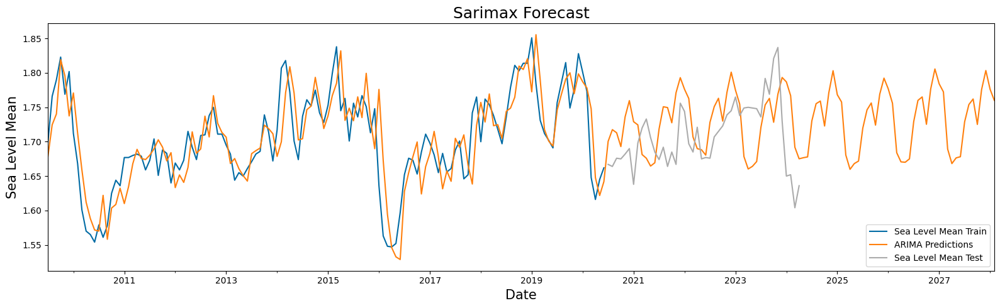

In [99]:
y_train['2009-07-01':].plot(figsize = (16,5), legend=True, label = 'Sea Level Mean Train')
arima_pred['2009-07-01':].plot(legend = True)
y_test.plot(legend=True, label = 'Sea Level Mean Test')
plt.title('Sarimax Forecast', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.tight_layout()
plt.show()
# plt.savefig('images/SARIMAX.png')

In [100]:
# Model evaluation
dates = y_test.index
arima_pred_series = pd.Series(arima_pred, index=dates)

# Slice arima_pred to match the dates in y_test
arima_pred_slice = arima_pred_series.loc[y_test.index]

# Calculate RMSE
rmse_arima = mean_squared_error(y_test, arima_pred_slice, squared=False)
print(f'Root Mean Squared Error: {rmse_arima}')

mse_arima = mean_squared_error(y_test, arima_pred_slice)
print(f'Mean Squared Error: {mse_arima}')

r2_arima = r2_score(y_test, arima_pred_slice)
print(f"R-squared: {r2_arima:.6f}")

mape_arima = mean_absolute_percentage_error(y_test, arima_pred_slice)
print(f"Mean Absolute Percentage Error: {mape_arima:.2f}%")

mae_arima = mean_absolute_error(y_test, arima_pred_slice)
print(f"Mean Absolute Error: {mae_arima:.2f}%")

Root Mean Squared Error: 0.059152807623278465
Mean Squared Error: 0.0034990546497165906
R-squared: -0.555243
Mean Absolute Percentage Error: 2.97%
Mean Absolute Error: 0.05%


In [101]:
# Model evaluation
dates = y_train['1994-08-01':].index
arima_pred_series = pd.Series(arima_pred, index=dates)

# Slice arima_pred to match the dates in y_test
arima_pred_slice = arima_pred_series.loc[dates]

# Calculate RMSE
rmse_arima = mean_squared_error(y_train['1994-08-01':], arima_pred_slice, squared=False)
print(f'Root Mean Squared Error: {rmse_arima}')

mse_arima = mean_squared_error(y_train['1994-08-01':], arima_pred_slice)
print(f'Mean Squared Error: {mse_arima}')

r2_arima = r2_score(y_train['1994-08-01':], arima_pred_slice)
print(f"R-squared: {r2_arima:.6f}")

mape_arima = mean_absolute_percentage_error(y_train['1994-08-01':], arima_pred_slice)
print(f"Mean Absolute Percentage Error: {mape_arima:.2f}%")

mae_arima = mean_absolute_error(y_train['1994-08-01':], arima_pred_slice)
print(f"Mean Absolute Error: {mae_arima:.2f}%")

Root Mean Squared Error: 0.048411808334938605
Mean Squared Error: 0.0023437031862588308
R-squared: 0.601967
Mean Absolute Percentage Error: 2.12%
Mean Absolute Error: 0.04%


In [102]:
y_test2 = y_test
y_test2['ARIMA_Predictions'] = arima_pred

Root Mean Squared Error: 0.1315066604860118
Mean Squared Error: 0.01729400175218318
R-squared: -3.441568
Mean Absolute Percentage Error: 0.07%
Mean Absolute Error: 0.11%


<Axes: xlabel='Date'>

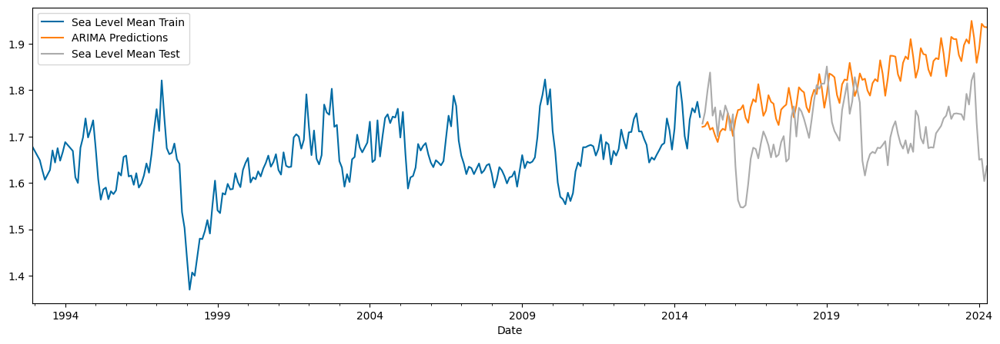

In [103]:
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.base import BaseEstimator, RegressorMixin

# Custom SARIMAX model wrapper compatible with Scikit-learn's API
class SARIMAXWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12)):
        self.order = order
        self.seasonal_order = seasonal_order
        self.model_ = None

    def fit(self, y, X=None):
        self.model_ = SARIMAX(y, order=self.order, seasonal_order=self.seasonal_order)
        self.model_ = self.model_.fit(disp=False)
        return self

    def predict(self, start=None, end=None, X=None):
        if start is None:
            start = 0
        if end is None:
            end = len(X) - 1
        return self.model_.predict(start=start, end=end)

# Assuming kiribati dataframe is loaded and 'Sea_Level_Mean' is the target variable
X = kiribati.drop(columns=['Sea_Level_Mean'])
y = kiribati['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)

# Define the parameter grid for GridSearchCV
param_grid = {
    'order': [(2, 1, 1), (3, 1, 1), (2, 1, 2)],
    'seasonal_order': [(6, 2, 3, 12), (6, 1, 3, 12), (5, 1, 2, 12)]
}

# Create time series split
tscv = TimeSeriesSplit(n_splits=3)

# Perform GridSearchCV
gscv = GridSearchCV(SARIMAXWrapper(), param_grid, cv=tscv, scoring='neg_mean_squared_error', n_jobs=-1)
gscv.fit(y_train)

# Best model
best_model = gscv.best_estimator_

# Make predictions
arima_pred = best_model.predict(start=1, end=len(y_train) + len(y_test) - 1)

# Convert predictions to series
dates = y_test.index
arima_pred_series = pd.Series(arima_pred, index=dates)

# Calculate evaluation metrics
rmse_arima = mean_squared_error(y_test, arima_pred_series, squared=False)
mse_arima = mean_squared_error(y_test, arima_pred_series)
r2_arima = r2_score(y_test, arima_pred_series)
mape_arima = mean_absolute_percentage_error(y_test, arima_pred_series)
mae_arima = mean_absolute_error(y_test, arima_pred_series)

# Print evaluation metrics
print(f'Root Mean Squared Error: {rmse_arima}')
print(f'Mean Squared Error: {mse_arima}')
print(f"R-squared: {r2_arima:.6f}")
print(f"Mean Absolute Percentage Error: {mape_arima:.2f}%")
print(f"Mean Absolute Error: {mae_arima:.2f}%")

# Plot results
y_train.plot(figsize=(16, 5), legend=True, label='Sea Level Mean Train')
arima_pred_series.plot(legend=True, label='ARIMA Predictions')
y_test.plot(legend=True, label='Sea Level Mean Test')
# plt.savefig('images/SARIMAX_GridSearch.png')


### Neural Networks

#### LSTM

In [104]:
X = kiribati
y = kiribati['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

In [105]:
scaler = MinMaxScaler()
scaler.fit(X_train)
scaler_test = MinMaxScaler()
scaler_test.fit(X_test)
scaled_train_data = scaler.transform(X_train)
scaled_test_data = scaler.transform(X_test)

In [106]:
timesteps = 12  # Number of time steps to use in each sequence
features = scaled_train_data.shape[1]

# Create sequences using TimeseriesGenerator
generator = TimeseriesGenerator(scaled_train_data, scaled_train_data,
                                length=timesteps, batch_size=32)

In [107]:
# Define the model
model = Sequential()
model.add(LSTM(200, activation='relu', input_shape=(timesteps, features)))
model.add(Dense(features))

model.compile(optimizer='adam', loss='mean_squared_error')

In [108]:
history = model.fit(generator, epochs=245, verbose=1)

Epoch 1/245
8/8 [==============================] - 2s 28ms/step - loss: 0.1262
Epoch 2/245
8/8 [==============================] - 0s 29ms/step - loss: 0.0366
Epoch 3/245
8/8 [==============================] - 0s 29ms/step - loss: 0.0320
Epoch 4/245
8/8 [==============================] - 0s 31ms/step - loss: 0.0287
Epoch 5/245
8/8 [==============================] - 0s 35ms/step - loss: 0.0272
Epoch 6/245
8/8 [==============================] - 0s 29ms/step - loss: 0.0266
Epoch 7/245
8/8 [==============================] - 0s 30ms/step - loss: 0.0263
Epoch 8/245
8/8 [==============================] - 0s 55ms/step - loss: 0.0258
Epoch 9/245
8/8 [==============================] - 0s 43ms/step - loss: 0.0249
Epoch 10/245
8/8 [==============================] - 0s 46ms/step - loss: 0.0249
Epoch 11/245
8/8 [==============================] - 0s 47ms/step - loss: 0.0242
Epoch 12/245
8/8 [==============================] - 0s 44ms/step - loss: 0.0240
Epoch 13/245
8/8 [==============================]

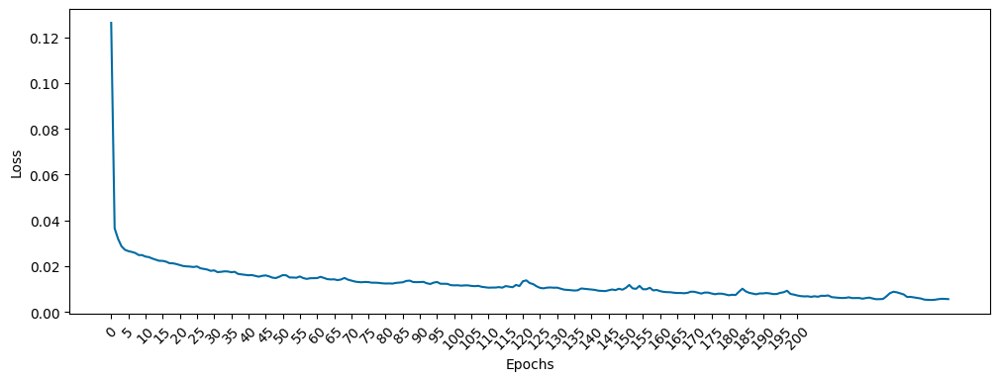

In [109]:
losses_lstm = history.history['loss']
plt.figure(figsize=(12,4))
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(np.arange(0,201,5), rotation = 45)
plt.plot(range(len(losses_lstm)),losses_lstm);

In [110]:
# Perform predictions
# Function to predict all data including training and test
def predict_all_data(scaled_train_data, scaled_test_data, model, timesteps, features, scaler):
    # Predicting training data
    training_predictions = []
    forecast_input = scaled_train_data[:timesteps]  # Use the start of the training data as the initial input

    for i in range(len(scaled_train_data)):
        forecast_input_reshaped = forecast_input.reshape((1, timesteps, features))
        prediction = model.predict(forecast_input_reshaped)
        training_predictions.append(prediction[0])

        if i + timesteps < len(scaled_train_data):
            forecast_input = np.append(forecast_input[1:], scaled_train_data[i + timesteps].reshape(1, -1), axis=0)

    # Convert the training predictions back to the original scale
    training_predictions = np.array(training_predictions)
    training_predictions = scaler.inverse_transform(training_predictions)

    # Predicting test data
    test_predictions = []
    forecast_input = scaled_train_data[-timesteps:]  # Use the end of the training data as the initial input

    for _ in range(len(scaled_test_data)):
        forecast_input_reshaped = forecast_input.reshape((1, timesteps, features))
        prediction = model.predict(forecast_input_reshaped)
        test_predictions.append(prediction[0])

        # Update forecast_input to include the latest prediction
        forecast_input = np.append(forecast_input[1:], prediction, axis=0)

    # Convert the test predictions back to the original scale
    test_predictions = np.array(test_predictions)
    test_predictions = scaler.inverse_transform(test_predictions)

    return training_predictions, test_predictions

# Predicting future values
def predict_future_values(scaled_train_data, model, timesteps, features, forecast_length, scaler):
    forecast_input = scaled_train_data[-timesteps:]
    forecast = []

    for _ in range(forecast_length):
        forecast_input_reshaped = forecast_input.reshape((1, timesteps, features))
        prediction = model.predict(forecast_input_reshaped)
        forecast.append(prediction[0])

        # Update forecast_input to include the latest prediction
        forecast_input = np.append(forecast_input[1:], prediction, axis=0)

    # Convert the forecast back to original scale
    forecast = np.array(forecast)
    forecast = scaler.inverse_transform(forecast)

    return forecast

training_predictions, test_predictions = predict_all_data(scaled_train_data, scaled_test_data, model, timesteps, features, scaler)
future_forecast = predict_future_values(scaled_train_data, model, timesteps, features, forecast_length=60, scaler = scaler)

# Create date ranges for training, test, and forecast data
train_dates = pd.date_range(start=X.index[0], periods=len(training_predictions), freq='M')
test_dates = pd.date_range(start=X.index[-len(test_predictions)], periods=len(test_predictions), freq='M')
forecast_dates = pd.date_range(start=X.index[-1] + pd.DateOffset(months=1), periods=60, freq='M')

# Convert results to DataFrames
train_predictions_df = pd.DataFrame(training_predictions, index=train_dates, columns=X.columns)
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)

1/1 [==============================] - 0s 28ms/step


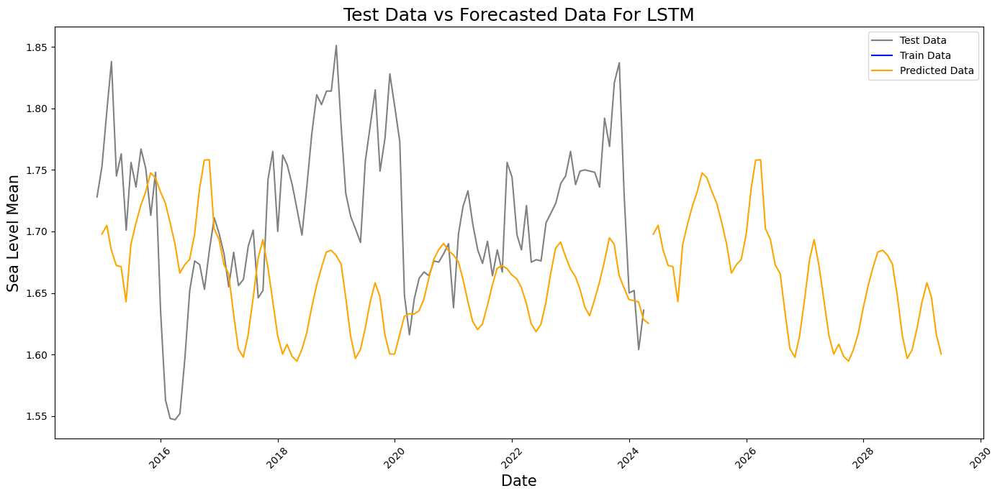

In [111]:
X_train_short = X_train['2015-07-01':]

test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
plt.plot(X_test.index, X_test['Sea_Level_Mean'].values, label='Test Data', color='grey')
plt.plot(X_train_short.index, X_train_short['Sea_Level_Mean'].values, label='Train Data', color='blue')

# Plot forecast data
plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Predicted Data', color='orange')
plt.plot(test_predictions_df.index, test_predictions_df['Sea_Level_Mean'].values, color='orange')
plt.plot(X_train_short.index, train_predictions_df['2015-07-01':]['Sea_Level_Mean'].values, color='orange')

plt.title('Test Data vs Forecasted Data For LSTM', fontsize = 18)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Sea Level Mean', fontsize = 15)
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [112]:
# Calculate RMSE
rmse_lstm = mean_squared_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values, squared=False)
print(f'Root Mean Squared Error: {rmse_lstm}')

mse_lstm = mean_squared_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f'Mean Squared Error: {mse_lstm}')

r2_lstm = r2_score(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"R-squared: {r2_lstm:.6f}")

mape_lstm = mean_absolute_percentage_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Percentage Error: {mape_lstm:.2f}%")

mae_lstm = mean_absolute_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Error: {mae_lstm:.2f}%")

Root Mean Squared Error: 0.0918250182798025
Mean Squared Error: 0.008431833982086063
R-squared: -1.165523
Mean Absolute Percentage Error: 0.04%
Mean Absolute Error: 0.08%


Training Evaluation

In [113]:
# Calculate RMSE
rmse_lstm = mean_squared_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values, squared=False)
print(f'Root Mean Squared Error: {rmse_lstm}')

mse_lstm = mean_squared_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f'Mean Squared Error: {mse_lstm}')

r2_lstm = r2_score(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"R-squared: {r2_lstm:.6f}")

mape_lstm = mean_absolute_percentage_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Percentage Error: {mape_lstm:.2f}%")

mae_lstm = mean_absolute_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Error: {mae_lstm:.2f}%")

Root Mean Squared Error: 0.0916024647049325
Mean Squared Error: 0.008391011540018404
R-squared: -0.688106
Mean Absolute Percentage Error: 0.04%
Mean Absolute Error: 0.07%


Best: -0.14390541948047422 using {'activation': 'tanh', 'batch_size': 32, 'epochs': 50, 'optimizer': 'rmsprop', 'units': 200}
Epoch 1/245
8/8 [==============================] - 2s 33ms/step - loss: 0.0145
Epoch 2/245
8/8 [==============================] - 0s 32ms/step - loss: 0.0142
Epoch 3/245
8/8 [==============================] - 0s 35ms/step - loss: 0.0145
Epoch 4/245
8/8 [==============================] - 0s 35ms/step - loss: 0.0140
Epoch 5/245
8/8 [==============================] - 0s 33ms/step - loss: 0.0141
Epoch 6/245
8/8 [==============================] - 0s 36ms/step - loss: 0.0145
Epoch 7/245
8/8 [==============================] - 0s 32ms/step - loss: 0.0140
Epoch 8/245
8/8 [==============================] - 0s 37ms/step - loss: 0.0142
Epoch 9/245
8/8 [==============================] - 0s 35ms/step - loss: 0.0139
Epoch 10/245
8/8 [==============================] - 0s 34ms/step - loss: 0.0138
Epoch 11/245
8/8 [==============================] - 0s 38ms/step - loss: 0.0136
Epo

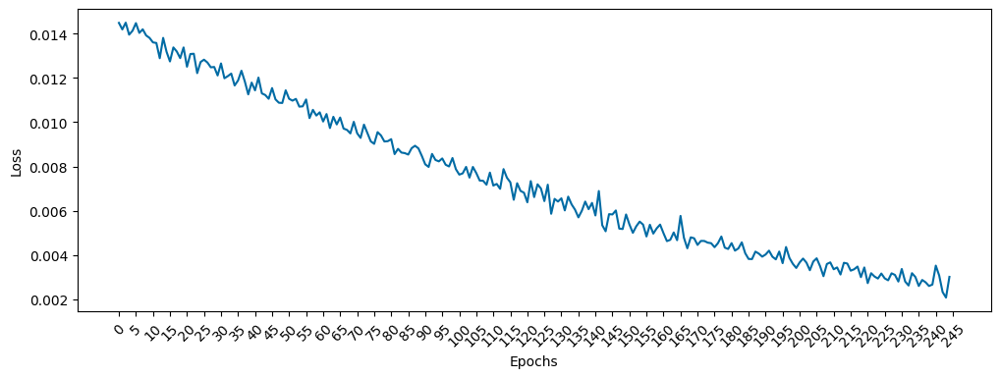

In [114]:
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV

# Example data, replace 'kiribati' with your actual dataset
X = kiribati
y = kiribati['Sea_Level_Mean']

# Train-test split
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Scaling data
scaler = MinMaxScaler()
scaler.fit(X_train)
scaler_test = MinMaxScaler()
scaler_test.fit(X_test)
scaled_train_data = scaler.transform(X_train)
scaled_test_data = scaler.transform(X_test)

# Create sequences using TimeseriesGenerator
timesteps = 12  # Number of time steps to use in each sequence
features = scaled_train_data.shape[1]

generator = TimeseriesGenerator(scaled_train_data, scaled_train_data,
                                length=timesteps, batch_size=32)

# Reshape input data to be 3D (samples, timesteps, features)
def reshape_data(X, timesteps, features):
    # Calculate the number of samples that can be formed with the given timesteps
    num_samples = X.shape[0] - timesteps

    # Initialize an array to hold the reshaped data
    reshaped_data = np.zeros((num_samples, timesteps, features))

    # Populate the reshaped data with sequences
    for i in range(num_samples):
        reshaped_data[i] = X[i:i+timesteps]

    return reshaped_data

# Update create_model to match input shape
def create_model(units=50, activation='relu', optimizer='adam'):
    model = Sequential()
    model.add(LSTM(units, activation=activation, input_shape=(timesteps, features)))
    model.add(Dense(features))
    model.compile(optimizer=optimizer, loss='mean_squared_error')
    return model

# Wrap the model using KerasRegressor
model = KerasRegressor(build_fn=create_model, verbose=0)

# Define the grid of hyperparameters to search
param_grid = {
    'units': [50, 100, 200],
    'activation': ['relu', 'tanh'],
    'batch_size': [32, 64],
    'epochs': [10, 50],
    'optimizer': ['adam', 'rmsprop']
}

# Use TimeSeriesSplit for time series cross-validation
tscv = TimeSeriesSplit(n_splits=3)

# Apply GridSearchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=tscv, scoring='neg_root_mean_squared_error', error_score='raise')

# Fit model using reshaped data
X_reshaped = reshape_data(scaled_train_data, timesteps, features)
y_reshaped = scaled_train_data[timesteps:]  # Adjust target variable

grid_result = grid.fit(X_reshaped, y_reshaped)

# Print the best score and the best parameters
print(f"Best: {grid_result.best_score_} using {grid_result.best_params_}")

# Train the model using the best parameters
best_model = grid_result.best_estimator_.model
history = best_model.fit(generator, epochs=245, verbose=1)
losses_lstm = history.history['loss']

# Plotting the loss over epochs
plt.figure(figsize=(12,4))
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(np.arange(0, 246, 5), rotation = 45)
plt.plot(range(len(losses_lstm)), losses_lstm)
plt.show()

1/1 [==============================] - 0s 35ms/step


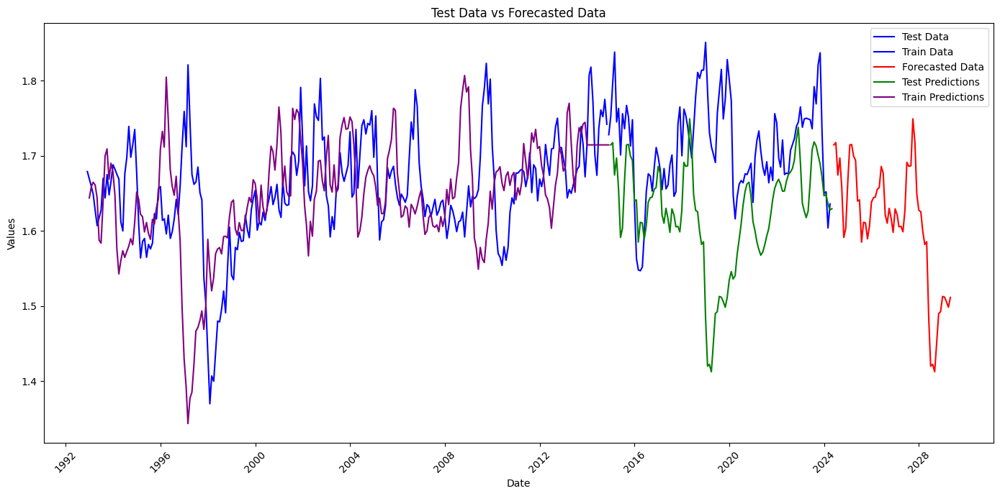

In [115]:
# Perform predictions
training_predictions, test_predictions = predict_all_data(scaled_train_data, scaled_test_data, best_model, timesteps, features, scaler)
future_forecast = predict_future_values(scaled_train_data, best_model, timesteps, features, forecast_length=60, scaler=scaler)

# Create date ranges for training, test, and forecast data
train_dates = pd.date_range(start=X.index[0], periods=len(training_predictions), freq='M')
test_dates = pd.date_range(start=X.index[-len(test_predictions)], periods=len(test_predictions), freq='M')
forecast_dates = pd.date_range(start=X.index[-1] + pd.DateOffset(months=1), periods=60, freq='M')

# Convert results to DataFrames
train_predictions_df = pd.DataFrame(training_predictions, index=train_dates, columns=X.columns)
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
plt.plot(X_test.index, X_test['Sea_Level_Mean'].values, label='Test Data', color='blue')
plt.plot(X_train.index, X_train['Sea_Level_Mean'].values, label='Train Data', color='blue')

# Plot forecast data
plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Forecasted Data', color='red')
plt.plot(test_predictions_df.index, test_predictions_df['Sea_Level_Mean'].values, label='Test Predictions', color='green')
plt.plot(train_predictions_df.index, train_predictions_df['Sea_Level_Mean'].values, label='Train Predictions', color='purple')

plt.title('Test Data vs Forecasted Data')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [116]:
# Calculate evaluation metrics
def calculate_metrics(true_values, predicted_values):
    mse = mean_squared_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(true_values, predicted_values)
    mape = np.mean(np.abs((true_values - predicted_values) / true_values)) * 100
    r2 = r2_score(true_values, predicted_values)
    return mse, rmse, mae, mape, r2

# Calculate metrics for test data
test_mse, test_rmse, test_mae, test_mape, test_r2 = calculate_metrics(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'])
print(f'Test MSE: {test_mse}, RMSE: {test_rmse}, MAE: {test_mae}, MAPE: {test_mape}, R-squared: {test_r2}')



Test MSE: 0.017078478839225197, RMSE: 0.13068465418412828, MAE: 0.09329988817198086, MAPE: 5.334680650740117, R-squared: -3.3862156192464123


## Solomon Islands

### Train and Test Split

In [117]:
X = solomon_islands.drop(columns=['Sea_Level_Mean'])
y = solomon_islands['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

### Basic models

#### Linear Regression - Baseline

In [118]:
np.random.seed(42)
# from matplotlib import pyplot
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Model evaluation
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse}')

mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2:.6f}")

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape:.2f}%")

mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae:.2f}%")

Root Mean Squared Error: 0.03009322571778209
Mean Squared Error: 0.0009056022341013813
R-squared: 0.924377
Mean Absolute Percentage Error: 3.24%
Mean Absolute Error: 0.02%


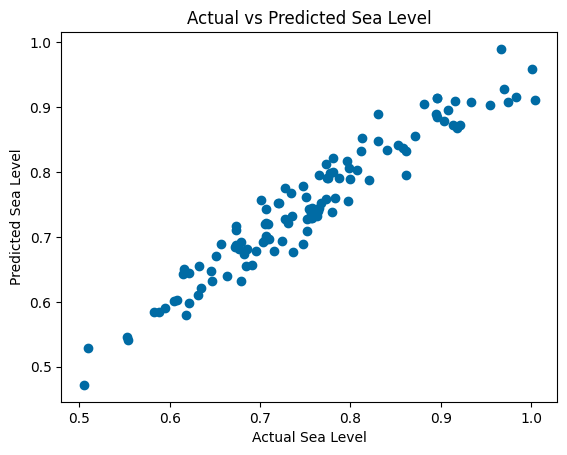

In [119]:
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Sea Level')
plt.ylabel('Predicted Sea Level')
plt.title('Actual vs Predicted Sea Level')
plt.show()

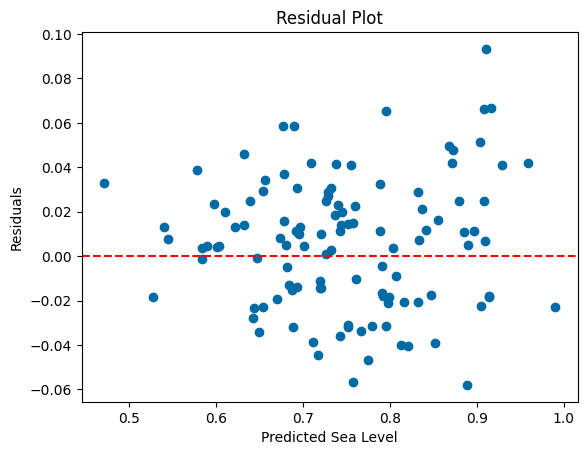

In [120]:
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.xlabel('Predicted Sea Level')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

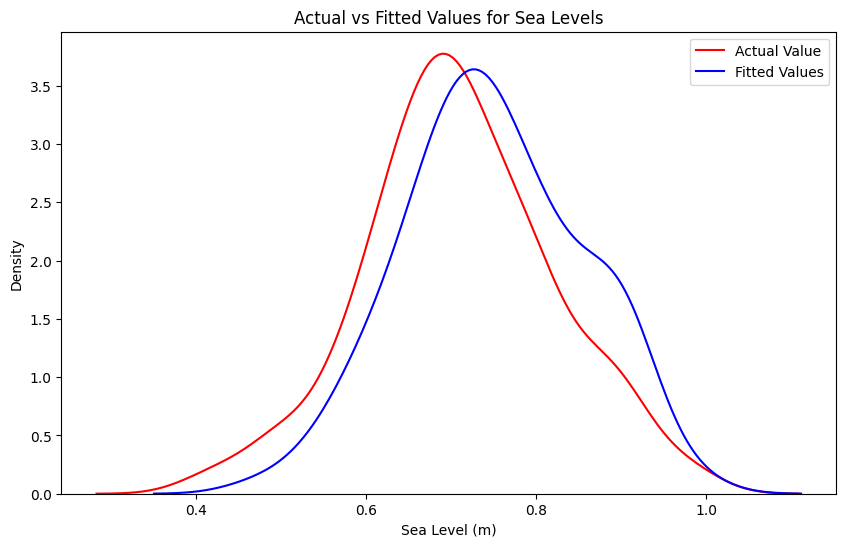

In [121]:
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(y, color="r", label="Actual Value")
sns.kdeplot(y_pred, color="b", label="Fitted Values", ax=ax1)

plt.title('Actual vs Fitted Values for Sea Levels')
plt.xlabel('Sea Level (m)')
plt.ylabel('Density')

plt.legend()
plt.show()
plt.close()

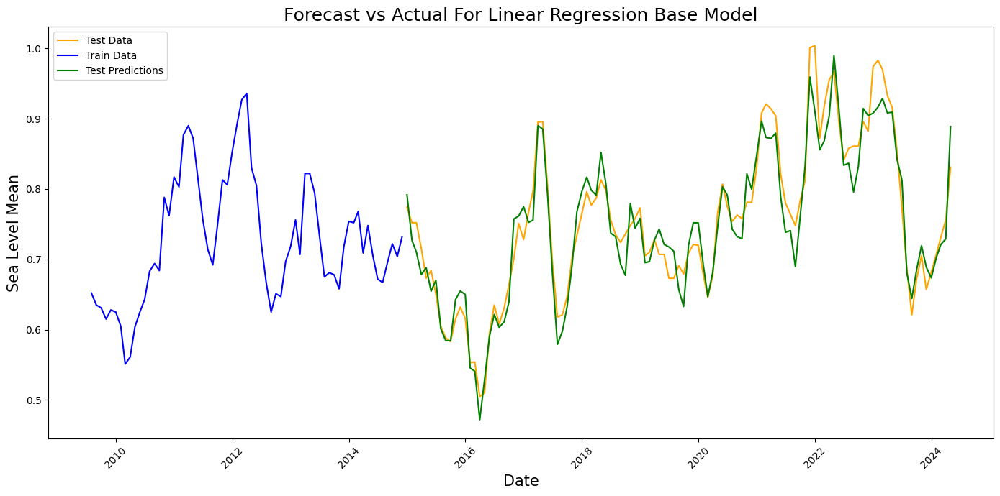

In [122]:
# Create date ranges for training, test, and forecast data
y_train = y_train['2009-07-01':]
train_dates = pd.date_range(start=y_train.index[-len(y_train)], periods=len(y_train), freq='M')
test_dates = pd.date_range(start=y.index[-len(y_pred)], periods=len(y_pred), freq='M')

# Convert results to DataFrames
train_values_df = pd.DataFrame(y_train.values, index=train_dates)
test_predictions_df = pd.DataFrame(y_pred, index=test_dates)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
# Use .to_timestamp() to align the index types
plt.plot(test_predictions_df.index, y_test.values, label='Test Data', color='orange')
plt.plot(train_values_df.index, y_train.values, label='Train Data', color='blue')

# Plot forecast data
# plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Forecasted Data', color='red')
plt.plot(test_predictions_df.index, y_pred, label='Test Predictions', color='green')
# plt.plot(train_predictions_df.index, train_predictions_df.values, label='Train Predictions', color='purple')

# Show the plot
plt.title('Forecast vs Actual For Linear Regression Base Model', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


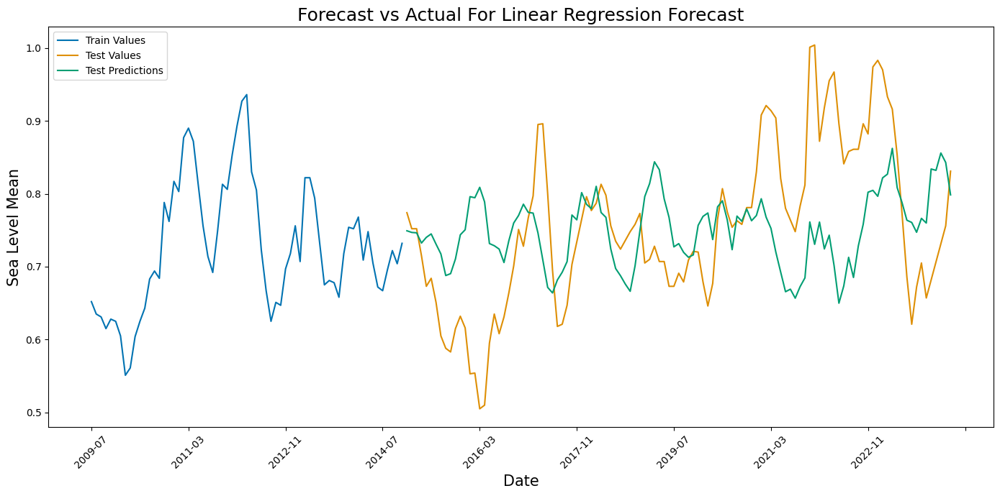

Root Mean Squared Error: 0.11598153691660641
Mean Squared Error: 0.013451716905538135
R-squared: -0.123295
Mean Absolute Percentage Error: 12.59%
Mean Absolute Error: 0.09%


In [123]:
X = solomon_islands_dat.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_dat['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Linear regression forecaster
regressor = LinearRegression()
forecaster = make_reduction(regressor, window_length=180, strategy="recursive")

# Fit and predict
forecaster.fit(y_train)
y_pred = forecaster.predict(fh=fh)

fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["Train Values", "Test Values", "Test Predictions"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual For Linear Regression Forecast', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse}')

mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2:.6f}")

mape = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape:.2f}%")

mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae:.2f}%")

#### XGBRegressor

In [124]:
import xgboost as xgb

np.random.seed(42)
X = solomon_islands_dat.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_dat['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Initialize the XGBoost Regressor
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Train the model
xgb_model.fit(X_train, y_train)

# Perform predictions
train_predictions = xgb_model.predict(X_train)
test_predictions = xgb_model.predict(X_test)

# Calculate evaluation metrics
def calculate_metrics(true_values, predicted_values):
    mse = mean_squared_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(true_values, predicted_values)
    mape = np.mean(np.abs((true_values - predicted_values) / true_values)) * 100
    r2 = r2_score(true_values, predicted_values)
    return mse, rmse, mae, mape, r2

# Calculate metrics for training data
train_mse, train_rmse, train_mae, train_mape, train_r2 = calculate_metrics(y_train, train_predictions)
print(f'Training MSE: {train_mse}, RMSE: {train_rmse}, MAE: {train_mae}, MAPE: {train_mape}, R-squared: {train_r2}')

# Calculate metrics for test data
test_mse, test_rmse, test_mae, test_mape, test_r2 = calculate_metrics(y_test, test_predictions)
print(f'Test MSE: {test_mse}, RMSE: {test_rmse}, MAE: {test_mae}, MAPE: {test_mape}, R-squared: {test_r2}')


Training MSE: 4.953534219316909e-07, RMSE: 0.0007038134851874401, MAE: 0.0005035826352177838, MAPE: 0.07438097008762104, R-squared: 0.9999578181347751
Test MSE: 0.0019712512000407975, RMSE: 0.04439877475832861, MAE: 0.033540842739881664, MAPE: 4.366371480211022, R-squared: 0.8353893513404099


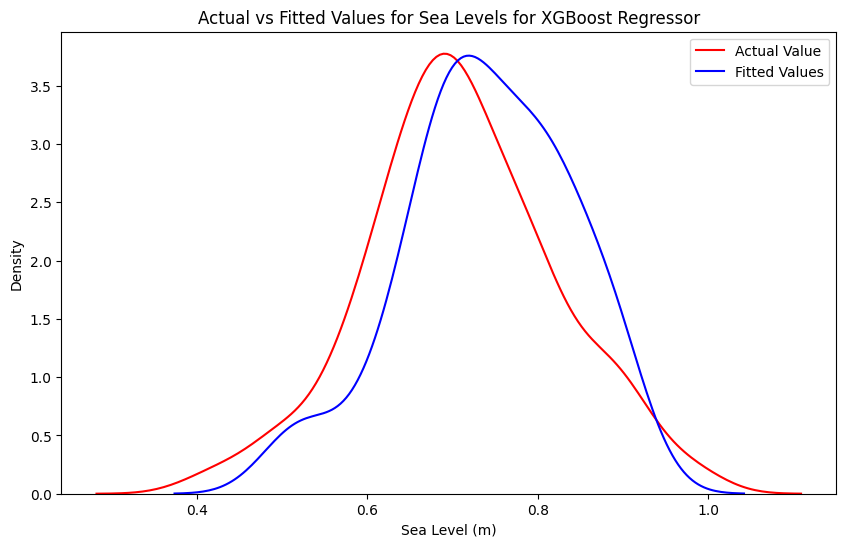

In [125]:
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(y, color="r", label="Actual Value")
sns.kdeplot(test_predictions, color="b", label="Fitted Values", ax=ax1)

plt.title('Actual vs Fitted Values for Sea Levels for XGBoost Regressor')
plt.xlabel('Sea Level (m)')
plt.ylabel('Density')

plt.legend()
plt.show()
plt.close()

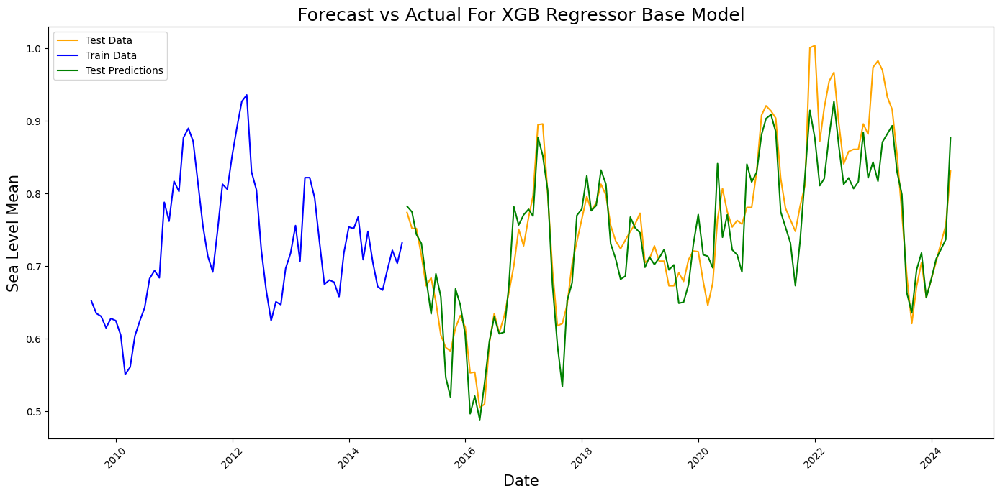

In [126]:
# Create date ranges for training, test, and forecast data
y_train = y_train['2009-07-01':]
train_dates = pd.date_range(start=y_train.index[-len(y_train)].to_timestamp(), periods=len(y_train), freq='M')
test_dates = pd.date_range(start=y.index[-len(test_predictions)].to_timestamp(), periods=len(test_predictions), freq='M')

# Convert results to DataFrames
train_values_df = pd.DataFrame(y_train.values, index=train_dates)
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
# Use .to_timestamp() to align the index types
plt.plot(test_predictions_df.index, y_test.values, label='Test Data', color='orange')
plt.plot(train_values_df.index, y_train.values, label='Train Data', color='blue')

# Plot forecast data
# plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Forecasted Data', color='red')
plt.plot(test_predictions_df.index, test_predictions_df.values, label='Test Predictions', color='green')
# plt.plot(train_predictions_df.index, train_predictions_df.values, label='Train Predictions', color='purple')

# Show the plot
plt.title('Forecast vs Actual For XGB Regressor Base Model', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

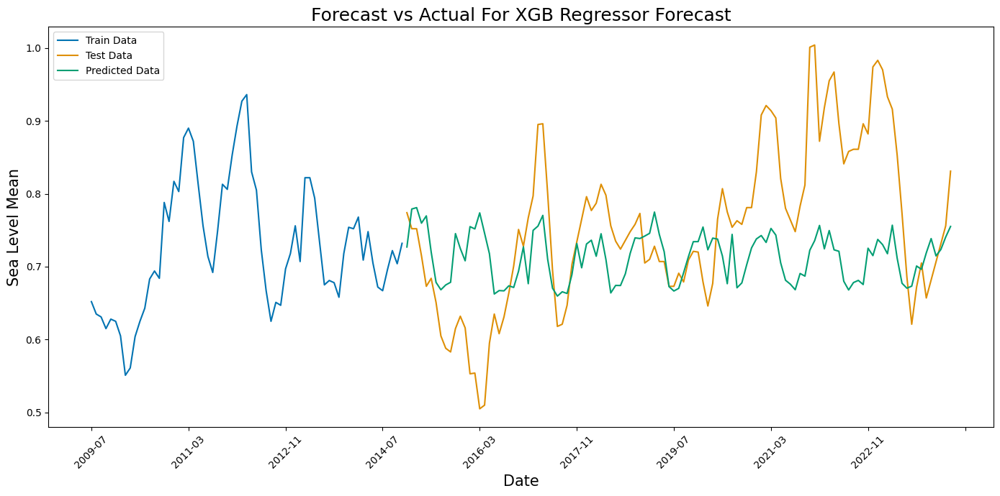

Root Mean Squared Error: 0.11510712957464582
Mean Squared Error: 0.0132496512789143
R-squared : -0.106421
Mean Absolute Percentage Error: 11.58%
Mean Absolute Error: 0.09%


In [127]:
np.random.seed(42)
X = solomon_islands_dat.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_dat['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# XGBoost forecaster
regressor = XGBRegressor(objective='reg:squarederror', r0andom_state=42)
forecaster = make_reduction(regressor, window_length=60, strategy="recursive")

# Fit and predict
forecaster.fit(y=y_train, X=X_train)
y_pred = forecaster.predict(fh=fh, X=X_test)

fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["Train Data", "Test Data", "Predicted Data"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
# Show the plot
plt.title('Forecast vs Actual For XGB Regressor Forecast', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
rmse_xgb = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse_xgb}')

mse_xgb = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse_xgb}')

r2_xgb = r2_score(y_test, y_pred)
print(f"R-squared : {r2_xgb:.6f}")

mape_xgb = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape_xgb:.2f}%")

mae_xgb = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae_xgb:.2f}%")

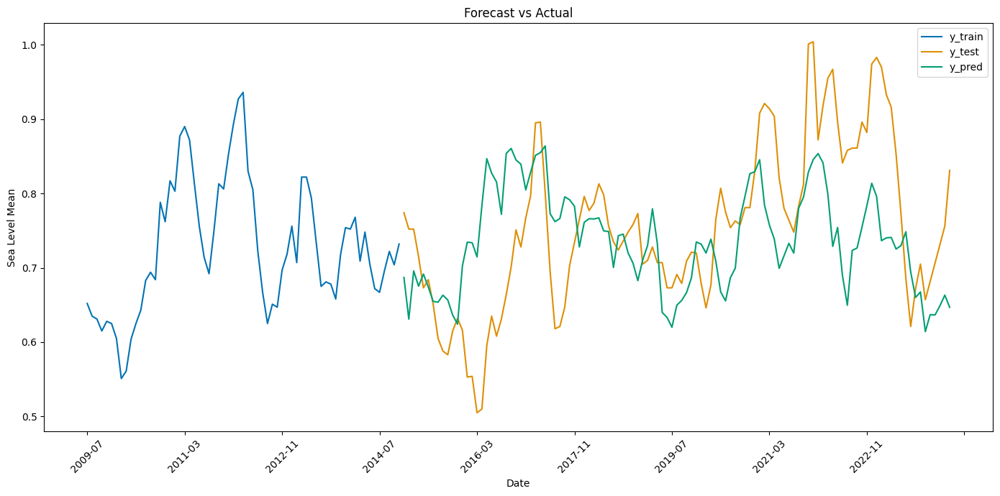

Root Mean Squared Error: 0.10843791038001807
Mean Squared Error: 0.011758780407584832
R-squared: 0.018075
Mean Absolute Percentage Error: 11.61%
Mean Absolute Error: 0.09%


In [128]:
np.random.seed(42)
X = solomon_islands_dat.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_dat['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Window for cross-validation
validation_size = 26
cv = SingleWindowSplitter(window_length=len(y)-validation_size, fh=validation_size)

# XGBoost forecaster with grid of parameters and detrender and deseasonaliser
regressor = XGBRegressor(objective='reg:squarederror', random_state=42)
forecaster = TransformedTargetForecaster(
    [
        ("deseasonalize", Deseasonalizer(model="multiplicative", sp=52)),
        ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=1))),
        ("forecast", make_reduction(regressor, window_length=195, strategy="recursive"),
        ),
    ]
)

# Param grid
param_grid = {
    'deseasonalize__model': ['multiplicative', 'additive'],
    'detrend__forecaster__degree': [1, 2, 3],
    'forecast__estimator__max_depth': [3, 5, 6, 10, 15, 20],
    'forecast__estimator__learning_rate': [0.01, 0.1, 0.2, 0.3],
    'forecast__estimator__subsample': np.arange(0.5, 1.0, 0.1),
    'forecast__estimator__colsample_bytree': np.arange(0.4, 1.0, 0.1),
    'forecast__estimator__colsample_bylevel': np.arange(0.4, 1.0, 0.1),
    'forecast__estimator__n_estimators': [100, 500, 1000]
}

# Randomised search
gscv = ForecastingRandomizedSearchCV(forecaster, cv=cv, param_distributions=param_grid, n_iter=100, random_state=42)

# Fit and predict
gscv.fit(y=y_train, X=X_train)
y_pred = gscv.predict(fh=fh, X=X_test)

fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sea Level Mean')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
# Model evaluation
rmse_xgb = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse_xgb}')

mse_xgb = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse_xgb}')

r2_xgb = r2_score(y_test, y_pred)
print(f"R-squared: {r2_xgb:.6f}")

mape_xgb = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape_xgb:.2f}%")

mae_xgb = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae_xgb:.2f}%")

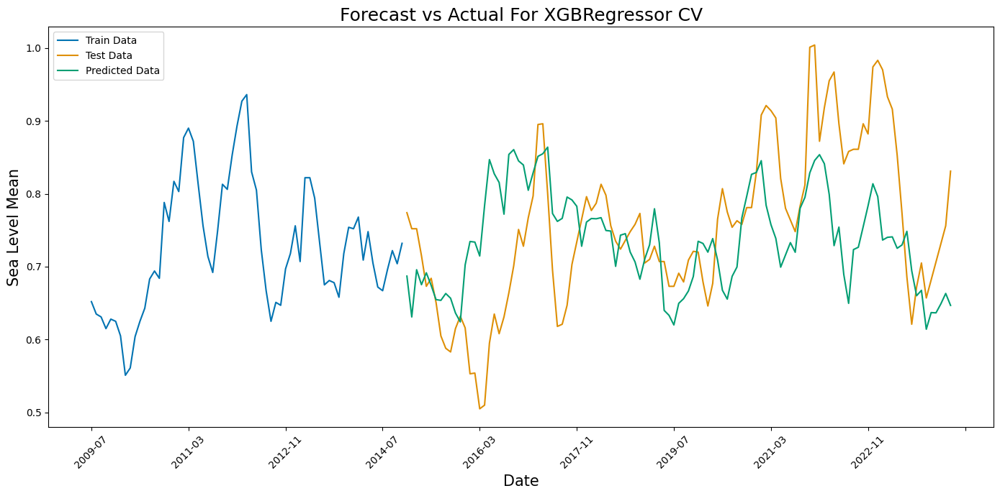

In [129]:
fig, ax = plt.subplots(figsize=(14, 7))
plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["Train Data", "Test Data", "Predicted Data"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual For XGBRegressor CV', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### Random Forest Regressor

In [130]:
X = solomon_islands_dat.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_dat['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)
np.random.seed(42)
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

# Predictions
y_pred_rf = rf_model.predict(X_test)

# Model evaluation
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

mae_rf = mean_absolute_error(y_test, y_pred_rf)
print(f"Mean Absolute Error (Random Forest): {mae_rf:.2f}%")

Root Mean Squared Error (Random Forest): 0.040406451357217536
Mean Squared Error (Random Forest): 0.001632681311283187
R-squared (Random Forest): 0.863662
Mean Absolute Percentage Error (Random Forest): 3.94%
Mean Absolute Error (Random Forest): 0.03%


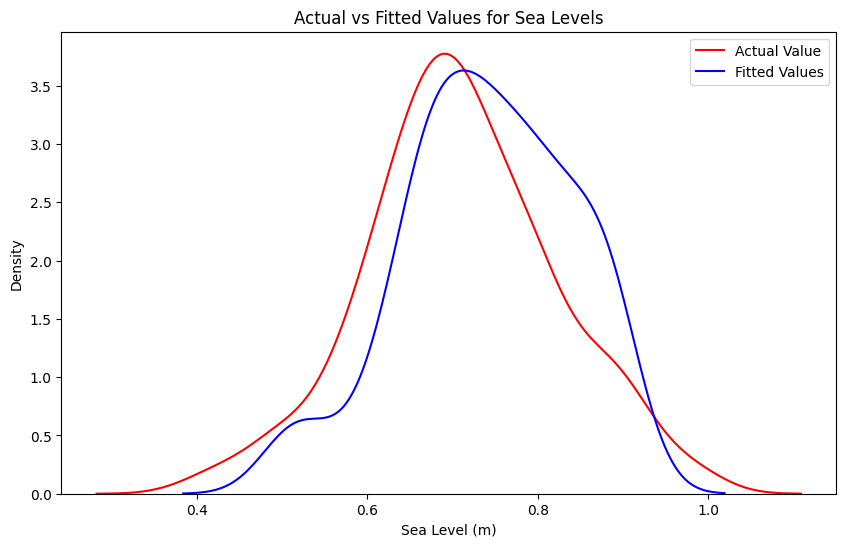

In [131]:
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(y, color="r", label="Actual Value")
sns.kdeplot(y_pred_rf, color="b", label="Fitted Values", ax=ax1)

plt.title('Actual vs Fitted Values for Sea Levels')
plt.xlabel('Sea Level (m)')
plt.ylabel('Density')

plt.legend()
plt.show()
plt.close()

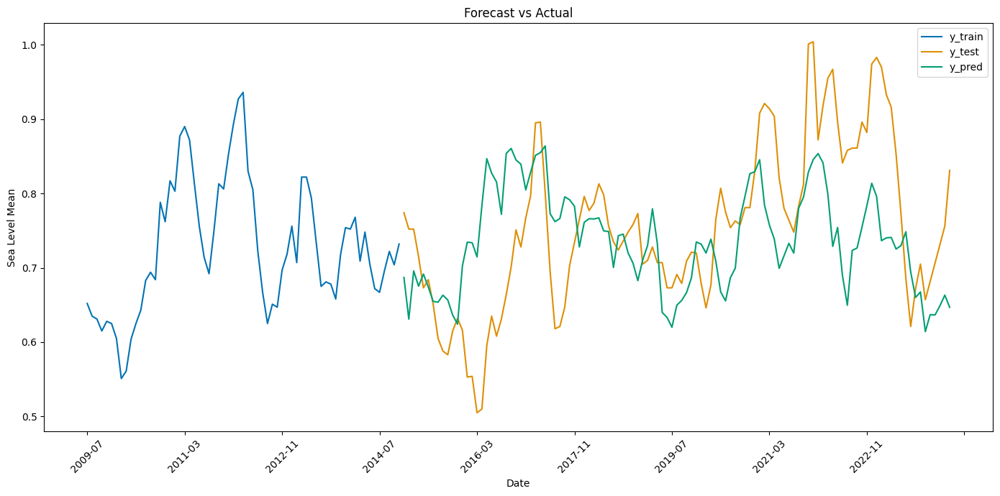

Root Mean Squared Error (Random Forest): 0.10706222223176363
Mean Squared Error (Random Forest): 0.011462319429203545
R-squared (Random Forest): 0.042831
Mean Absolute Percentage Error (Random Forest): 11.31%
Mean Absolute Error (Random Forest): 0.08%


In [132]:
np.random.seed(42)
X = solomon_islands_dat.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_dat['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False, freq='M')

# Linear regression forecaster
regressor = RandomForestRegressor()
forecaster = make_reduction(regressor, window_length=170, strategy="recursive")

# Fit and predict
forecaster.fit(y_train)
y_pred_rf = forecaster.predict(fh=fh)

# Plot predictions with training and test data
fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sea Level Mean')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

mae_rf = mean_absolute_error(y_test, y_pred_rf)
print(f"Mean Absolute Error (Random Forest): {mae_rf:.2f}%")

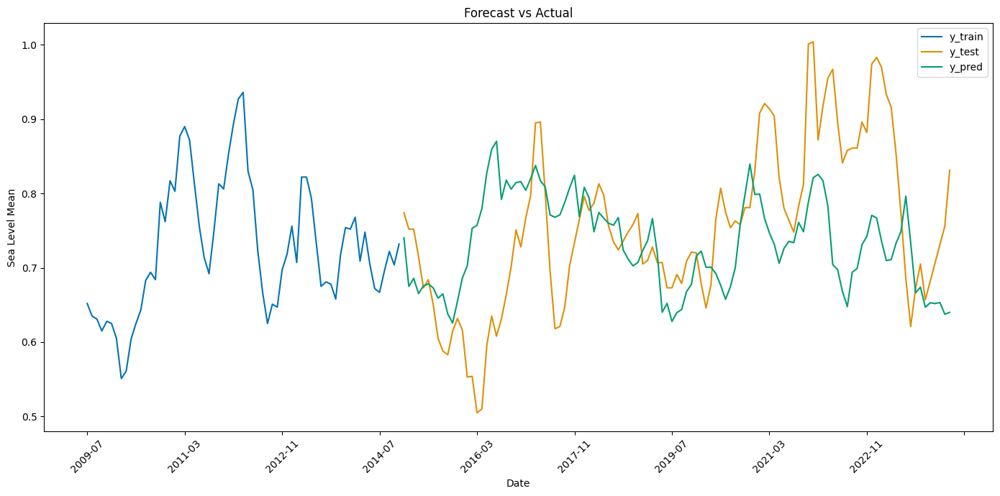

Root Mean Squared Error (Random Forest): 0.10706222223176363
Mean Squared Error (Random Forest): 0.011462319429203545
R-squared (Random Forest): 0.042831
Mean Absolute Percentage Error (Random Forest): 11.31%


In [133]:
np.random.seed(42)
X = solomon_islands_dat.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_dat['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Window for cross-validation
validation_size = 26
cv = SingleWindowSplitter(window_length=len(y)-validation_size, fh=validation_size)

# XGBoost forecaster with grid of parameters and detrender and deseasonaliser
regressor = RandomForestRegressor()
forecaster = TransformedTargetForecaster(
    [
        ("deseasonalize", Deseasonalizer(model="multiplicative", sp=52)),
        ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=1))),
        ("forecast", make_reduction(regressor, window_length=195, strategy="recursive"),
        ),
    ]
)

# Param grid
param_grid = {
    'deseasonalize__model': ['multiplicative', 'additive'],
    'detrend__forecaster__degree': [1, 2, 3],
    'forecast__estimator__max_depth': [3, 5, 6, 10, 15, 20],
    'forecast__estimator__n_estimators': [100, 200, 300]
}

# Randomised search
gscv = ForecastingRandomizedSearchCV(forecaster, cv=cv, param_distributions=param_grid, n_iter=100, random_state=42)

# Fit and predict
gscv.fit(y=y_train, X=X_train)
y_pred = gscv.predict(fh=fh, X=X_test)

# Plot predictions with training and test data
fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sea Level Mean')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

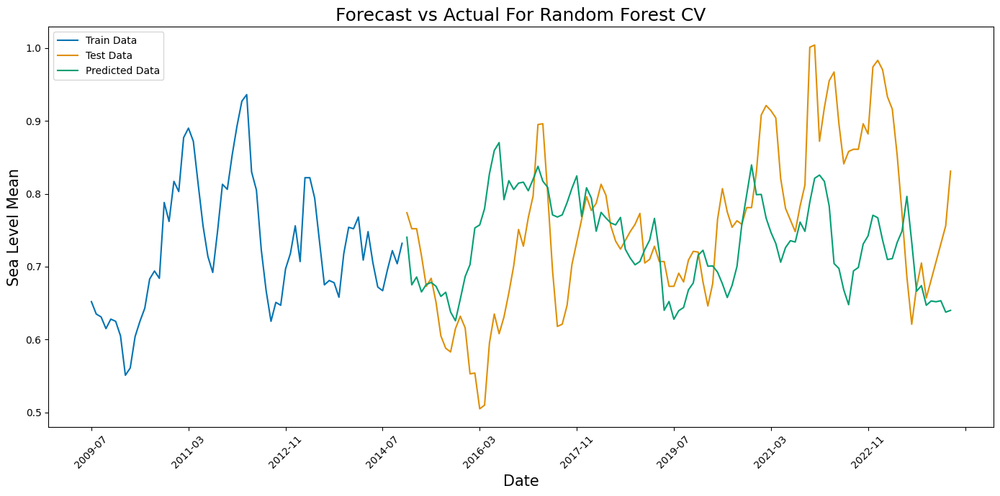

In [134]:
# Plot predictions with training and test data
fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["Train Data", "Test Data", "Predicted Data"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual For Random Forest CV', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### ARIMA

In [135]:
auto_arima(solomon_islands['Sea_Level_Mean'], seasonal=True, m=12,max_p=7, max_d=5,max_q=7, max_P=4, max_D=4,max_Q=4).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  358
Model:               SARIMAX(0, 1, 1)   Log Likelihood                 565.595
Date:                Sat, 24 Aug 2024   AIC                          -1127.191
Time:                        20:33:39   BIC                          -1119.435
Sample:                    07-01-1994   HQIC                         -1124.106
                         - 04-01-2024                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2316      0.046      4.983      0.000       0.141       0.323
sigma2         0.0025      0.000     16.520      0.000       0.002       0.003
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                18.37
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               0.54   Skew:                             0.18
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.05
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [136]:
X = solomon_islands.drop(columns=['Sea_Level_Mean'])
y = solomon_islands['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

arima_model = SARIMAX(y_train, order = (2,1,1), seasonal_order = (6,2,3,12)) # 4,0,3,12
arima_result = arima_model.fit()
arima_result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                         SARIMAX Results                                          
==================================================================================================
Dep. Variable:                             Sea_Level_Mean   No. Observations:                  312
Model:             SARIMAX(2, 1, 1)x(6, 2, [1, 2, 3], 12)   Log Likelihood                 423.413
Date:                                    Sat, 24 Aug 2024   AIC                           -820.826
Time:                                            20:35:59   BIC                           -773.253
Sample:                                        07-01-1994   HQIC                          -801.759
                                             - 06-01-2020                                         
Covariance Type:                                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0536     21.050      0.050      0.960     -40.204      42.311
ar.L2         -0.0682      1.483     -0.046      0.963      -2.975       2.839
ma.L1         -0.9841     20.931     -0.047      0.963     -42.008      40.040
ar.S.L12      -1.8679      0.180    -10.392      0.000      -2.220      -1.516
ar.S.L24      -2.2573      0.285     -7.924      0.000      -2.816      -1.699
ar.S.L36      -1.6899      0.281     -6.003      0.000      -2.242      -1.138
ar.S.L48      -1.2873      0.244     -5.265      0.000      -1.767      -0.808
ar.S.L60      -0.7688      0.169     -4.547      0.000      -1.100      -0.437
ar.S.L72      -0.3867      0.078     -4.979      0.000      -0.539      -0.234
ma.S.L12       0.0954      1.599      0.060      0.952      -3.038       3.229
ma.S.L24      -0.3079      1.798     -0.171      0.864      -3.831       3.215
ma.S.L36      -0.7721      1.311     -0.589      0.556      -3.342       1.798
sigma2         0.0023      0.004      0.627      0.531      -0.005       0.010
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 1.80
Prob(Q):                              0.97   Prob(JB):                         0.41
Heteroskedasticity (H):               0.51   Skew:                             0.17
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.20
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [137]:
np.random.seed(42)
arima_pred = arima_result.predict(start = 20, end = len(kiribati)+45, typ="levels").rename("ARIMA Predictions")
arima_pred

,ARIMA Predictions
1996-03-01,1.026000
1996-04-01,0.867000
1996-05-01,0.741500
1996-06-01,0.690000
1996-07-01,0.626333
...,...
2029-05-01,1.061307
2029-06-01,1.016897
2029-07-01,0.965879
2029-08-01,0.983215


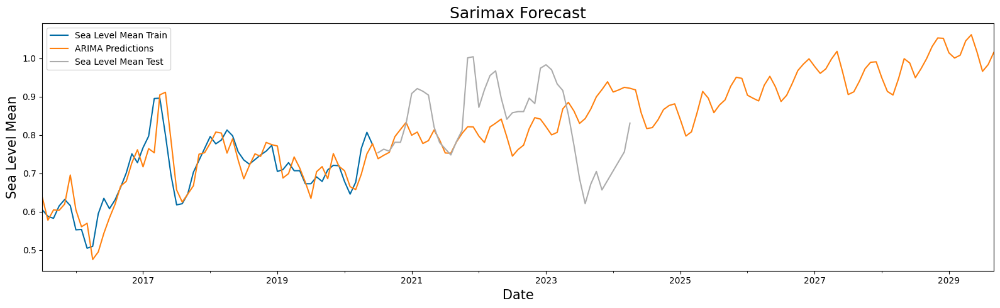

In [138]:
y_train['2015-07-01':].plot(figsize = (16,5), legend=True, label = 'Sea Level Mean Train')
arima_pred['2015-07-01':].plot(legend = True)
y_test.plot(legend=True, label = 'Sea Level Mean Test')
plt.title('Sarimax Forecast', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.tight_layout()
plt.show()
# plt.savefig('images/SARIMAX.png')

In [139]:
# Model evaluation
dates = y_test.index
arima_pred_series = pd.Series(arima_pred, index=dates)

# Slice arima_pred to match the dates in y_test
arima_pred_slice = arima_pred_series.loc[y_test.index]

# Calculate RMSE
rmse_arima = mean_squared_error(y_test, arima_pred_slice, squared=False)
print(f'Root Mean Squared Error: {rmse_arima}')

mse_arima = mean_squared_error(y_test, arima_pred_slice)
print(f'Mean Squared Error: {mse_arima}')

r2_arima = r2_score(y_test, arima_pred_slice)
print(f"R-squared: {r2_arima:.6f}")

mape_arima = mean_absolute_percentage_error(y_test, arima_pred_slice)
print(f"Mean Absolute Percentage Error: {mape_arima:.2f}%")

mae_arima = mean_absolute_error(y_test, arima_pred_slice)
print(f"Mean Absolute Error: {mae_arima:.2f}%")

Root Mean Squared Error: 0.1253326789823796
Mean Squared Error: 0.01570828042090022
R-squared: -0.592665
Mean Absolute Percentage Error: 12.52%
Mean Absolute Error: 0.10%


In [140]:
arima_pred_slice.head(20)

,ARIMA Predictions
Date,
2020-07-01,0.738215
2020-08-01,0.747094
2020-09-01,0.754803
2020-10-01,0.795698
2020-11-01,0.814468
2020-12-01,0.832734
2021-01-01,0.799356
2021-02-01,0.807677
2021-03-01,0.777835


In [141]:
# Model evaluation
dates = y_train['1996-03-01':].index
arima_pred_series = pd.Series(arima_pred, index=dates)

# Slice arima_pred to match the dates in y_test
arima_pred_slice = arima_pred_series.loc[dates]

# Calculate RMSE
rmse_arima = mean_squared_error(y_train['1996-03-01':], arima_pred_slice, squared=False)
print(f'Root Mean Squared Error: {rmse_arima}')

mse_arima = mean_squared_error(y_train['1996-03-01':], arima_pred_slice)
print(f'Mean Squared Error: {mse_arima}')

r2_arima = r2_score(y_train['1996-03-01':], arima_pred_slice)
print(f"R-squared: {r2_arima:.6f}")

mape_arima = mean_absolute_percentage_error(y_train['1996-03-01':], arima_pred_slice)
print(f"Mean Absolute Percentage Error: {mape_arima:.2f}%")

mae_arima = mean_absolute_error(y_train['1996-03-01':], arima_pred_slice)
print(f"Mean Absolute Error: {mae_arima:.2f}%")

Root Mean Squared Error: 0.060911393009468434
Mean Squared Error: 0.00371019779835392
R-squared: 0.651105
Mean Absolute Percentage Error: 6.90%
Mean Absolute Error: 0.05%


In [142]:
y_test2 = y_test
y_test2['ARIMA_Predictions'] = arima_pred

Root Mean Squared Error: 0.1253326789823796
Mean Squared Error: 0.01570828042090022
R-squared: -0.592665
Mean Absolute Percentage Error: 0.13%
Mean Absolute Error: 0.10%


<Axes: xlabel='Date'>

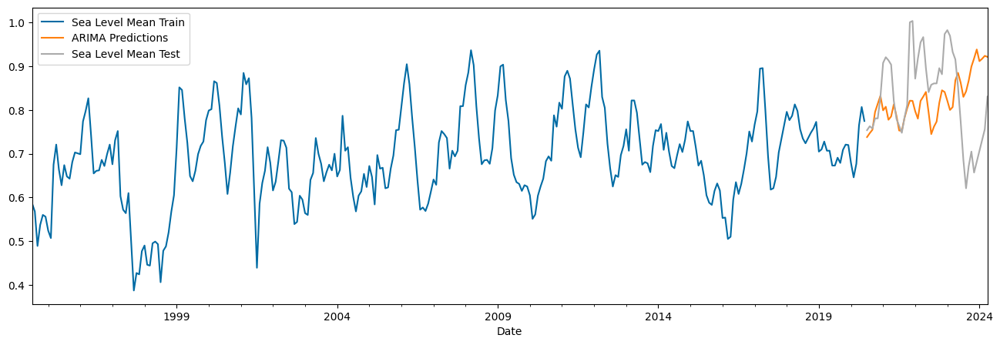

In [143]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.base import BaseEstimator, RegressorMixin

# Custom SARIMAX model wrapper compatible with Scikit-learn's API
class SARIMAXWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12)):
        self.order = order
        self.seasonal_order = seasonal_order
        self.model_ = None

    def fit(self, y, X=None):
        self.model_ = SARIMAX(y, order=self.order, seasonal_order=self.seasonal_order)
        self.model_ = self.model_.fit(disp=False)
        return self

    def predict(self, start=None, end=None, X=None):
        if start is None:
            start = 0
        if end is None:
            end = len(X) - 1
        return self.model_.predict(start=start, end=end)

# Assuming kiribati dataframe is loaded and 'Sea_Level_Mean' is the target variable
X = solomon_islands.drop(columns=['Sea_Level_Mean'])
y = solomon_islands['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)

# Define the parameter grid for GridSearchCV
param_grid = {
    'order': [(2, 1, 1), (3, 1, 1), (2, 1, 2)],
    'seasonal_order': [(6, 2, 3, 12), (6, 1, 3, 12), (5, 1, 2, 12)]
}

# Create time series split
tscv = TimeSeriesSplit(n_splits=3)

# Perform GridSearchCV
gscv = GridSearchCV(SARIMAXWrapper(), param_grid, cv=tscv, scoring='neg_mean_squared_error', n_jobs=-1)
gscv.fit(y_train)

# Best model
best_model = gscv.best_estimator_

# Make predictions
arima_pred = best_model.predict(start=1, end=len(y_train) + len(y_test) - 1)

# Convert predictions to series
dates = y_test.index
arima_pred_series = pd.Series(arima_pred, index=dates)

# Calculate evaluation metrics
rmse_arima = mean_squared_error(y_test, arima_pred_series, squared=False)
mse_arima = mean_squared_error(y_test, arima_pred_series)
r2_arima = r2_score(y_test, arima_pred_series)
mape_arima = mean_absolute_percentage_error(y_test, arima_pred_series)
mae_arima = mean_absolute_error(y_test, arima_pred_series)

# Print evaluation metrics
print(f'Root Mean Squared Error: {rmse_arima}')
print(f'Mean Squared Error: {mse_arima}')
print(f"R-squared: {r2_arima:.6f}")
print(f"Mean Absolute Percentage Error: {mape_arima:.2f}%")
print(f"Mean Absolute Error: {mae_arima:.2f}%")

# Plot results
y_train.plot(figsize=(16, 5), legend=True, label='Sea Level Mean Train')
arima_pred_series.plot(legend=True, label='ARIMA Predictions')
y_test.plot(legend=True, label='Sea Level Mean Test')
# plt.savefig('images/SARIMAX_GridSearch.png')


### Neural Networks

#### LSTM

In [144]:
X = solomon_islands
y = solomon_islands['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

In [145]:
scaler = MinMaxScaler()
scaler.fit(X_train)
scaler_test = MinMaxScaler()
scaler_test.fit(X_test)
scaled_train_data = scaler.transform(X_train)
scaled_test_data = scaler.transform(X_test)

In [146]:
timesteps = 12  # Number of time steps to use in each sequence
features = scaled_train_data.shape[1]

# Create sequences using TimeseriesGenerator
generator = TimeseriesGenerator(scaled_train_data, scaled_train_data,
                                length=timesteps, batch_size=32)

In [147]:
# Define the model
model = Sequential()
model.add(LSTM(200, activation='relu', input_shape=(timesteps, features)))
model.add(Dense(features))

model.compile(optimizer='adam', loss='mean_squared_error')

In [148]:
history = model.fit(generator, epochs=245, verbose=1)

Epoch 1/245
10/10 [==============================] - 3s 67ms/step - loss: 0.2129
Epoch 2/245
10/10 [==============================] - 1s 69ms/step - loss: 0.0461
Epoch 3/245
10/10 [==============================] - 1s 74ms/step - loss: 0.0337
Epoch 4/245
10/10 [==============================] - 0s 33ms/step - loss: 0.0294
Epoch 5/245
10/10 [==============================] - 0s 33ms/step - loss: 0.0286
Epoch 6/245
10/10 [==============================] - 0s 34ms/step - loss: 0.0277
Epoch 7/245
10/10 [==============================] - 0s 32ms/step - loss: 0.0273
Epoch 8/245
10/10 [==============================] - 0s 36ms/step - loss: 0.0270
Epoch 9/245
10/10 [==============================] - 0s 35ms/step - loss: 0.0262
Epoch 10/245
10/10 [==============================] - 0s 35ms/step - loss: 0.0257
Epoch 11/245
10/10 [==============================] - 0s 39ms/step - loss: 0.0243
Epoch 12/245
10/10 [==============================] - 0s 33ms/step - loss: 0.0232
Epoch 13/245
10/10 [=====

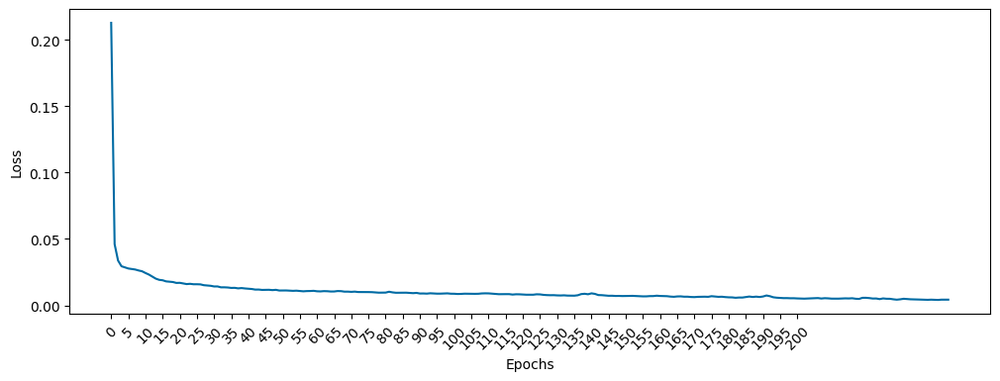

In [149]:
losses_lstm = history.history['loss']
plt.figure(figsize=(12,4))
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(np.arange(0,201,5), rotation = 45)
plt.plot(range(len(losses_lstm)),losses_lstm);

In [150]:
training_predictions, test_predictions = predict_all_data(scaled_train_data, scaled_test_data, model, timesteps, features, scaler)
future_forecast = predict_future_values(scaled_train_data, model, timesteps, features, forecast_length=60, scaler = scaler)

# Create date ranges for training, test, and forecast data
train_dates = pd.date_range(start=X.index[0], periods=len(training_predictions), freq='M')
test_dates = pd.date_range(start=X.index[-len(test_predictions)], periods=len(test_predictions), freq='M')
forecast_dates = pd.date_range(start=X.index[-1] + pd.DateOffset(months=1), periods=60, freq='M')

# Convert results to DataFrames
train_predictions_df = pd.DataFrame(training_predictions, index=train_dates, columns=X.columns)
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)

1/1 [==============================] - 0s 28ms/step


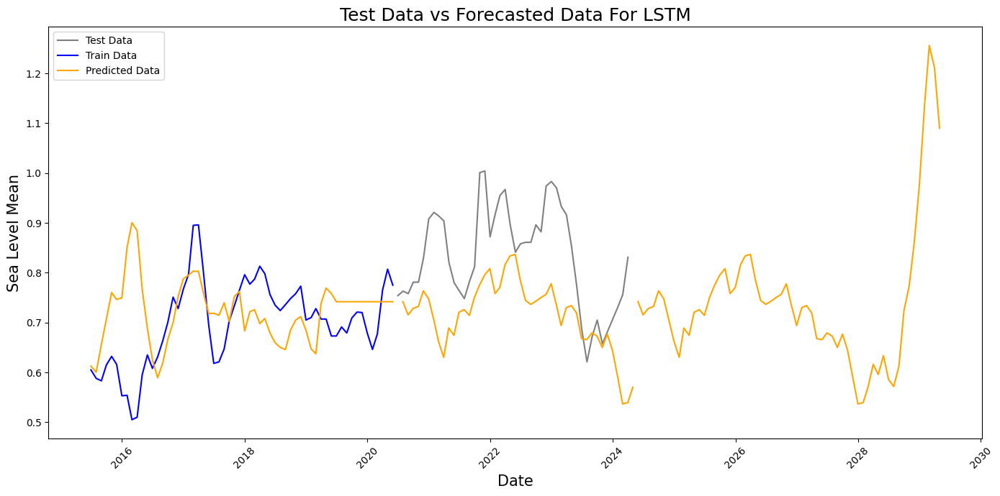

In [151]:
X_train_short = X_train['2015-07-01':]

test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
plt.plot(X_test.index, X_test['Sea_Level_Mean'].values, label='Test Data', color='grey')
plt.plot(X_train_short.index, X_train_short['Sea_Level_Mean'].values, label='Train Data', color='blue')

# Plot forecast data
plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Predicted Data', color='orange')
plt.plot(test_predictions_df.index, test_predictions_df['Sea_Level_Mean'].values, color='orange')
plt.plot(X_train_short.index, train_predictions_df['2015-07-01':]['Sea_Level_Mean'].values, color='orange')

plt.title('Test Data vs Forecasted Data For LSTM', fontsize = 18)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Sea Level Mean', fontsize = 15)
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [152]:
# Calculate RMSE
rmse_lstm = mean_squared_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values, squared=False)
print(f'Root Mean Squared Error: {rmse_lstm}')

mse_lstm = mean_squared_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f'Mean Squared Error: {mse_lstm}')

r2_lstm = r2_score(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"R-squared: {r2_lstm:.6f}")

mape_lstm = mean_absolute_percentage_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Percentage Error: {mape_lstm:.2f}%")

mae_lstm = mean_absolute_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Error: {mae_lstm:.2f}%")

Root Mean Squared Error: 0.14528173087238147
Mean Squared Error: 0.02110678132527508
R-squared: -1.140020
Mean Absolute Percentage Error: 0.14%
Mean Absolute Error: 0.12%


Training Evaluation

In [153]:
# Calculate RMSE
rmse_lstm = mean_squared_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values, squared=False)
print(f'Root Mean Squared Error: {rmse_lstm}')

mse_lstm = mean_squared_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f'Mean Squared Error: {mse_lstm}')

r2_lstm = r2_score(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"R-squared: {r2_lstm:.6f}")

mape_lstm = mean_absolute_percentage_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Percentage Error: {mape_lstm:.2f}%")

mae_lstm = mean_absolute_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Error: {mae_lstm:.2f}%")

Root Mean Squared Error: 0.12880395555144403
Mean Squared Error: 0.01659045896569837
R-squared: -0.560423
Mean Absolute Percentage Error: 0.15%
Mean Absolute Error: 0.10%


Best: -0.12742629496591015 using {'activation': 'tanh', 'batch_size': 32, 'epochs': 50, 'optimizer': 'adam', 'units': 200}
Epoch 1/245
10/10 [==============================] - 4s 33ms/step - loss: 0.0109
Epoch 2/245
10/10 [==============================] - 0s 31ms/step - loss: 0.0117
Epoch 3/245
10/10 [==============================] - 0s 32ms/step - loss: 0.0115
Epoch 4/245
10/10 [==============================] - 0s 35ms/step - loss: 0.0118
Epoch 5/245
10/10 [==============================] - 0s 31ms/step - loss: 0.0112
Epoch 6/245
10/10 [==============================] - 0s 32ms/step - loss: 0.0113
Epoch 7/245
10/10 [==============================] - 0s 31ms/step - loss: 0.0112
Epoch 8/245
10/10 [==============================] - 0s 33ms/step - loss: 0.0107
Epoch 9/245
10/10 [==============================] - 0s 33ms/step - loss: 0.0107
Epoch 10/245
10/10 [==============================] - 0s 31ms/step - loss: 0.0107
Epoch 11/245
10/10 [==============================] - 0s 31ms/step

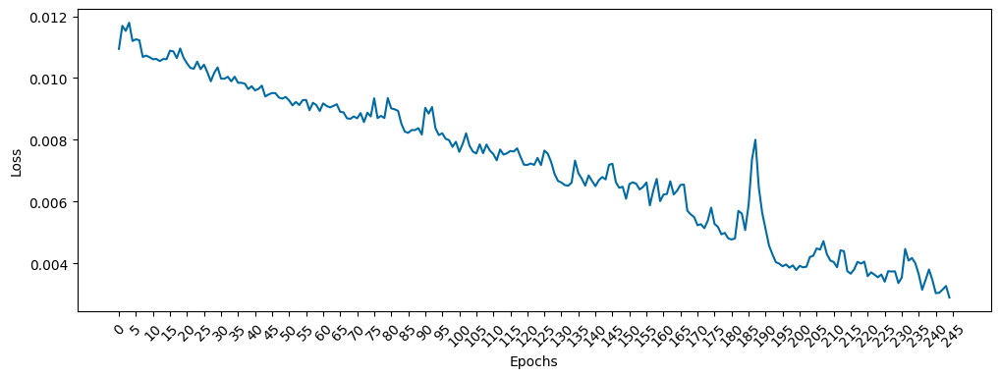

In [154]:
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV

X = solomon_islands
y = solomon_islands['Sea_Level_Mean']

# Train-test split
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

# Scaling data
scaler = MinMaxScaler()
scaler.fit(X_train)
scaler_test = MinMaxScaler()
scaler_test.fit(X_test)
scaled_train_data = scaler.transform(X_train)
scaled_test_data = scaler.transform(X_test)

# Create sequences using TimeseriesGenerator
timesteps = 12  # Number of time steps to use in each sequence
features = scaled_train_data.shape[1]

generator = TimeseriesGenerator(scaled_train_data, scaled_train_data,
                                length=timesteps, batch_size=32)

# Reshape input data to be 3D (samples, timesteps, features)
def reshape_data(X, timesteps, features):
    # Calculate the number of samples that can be formed with the given timesteps
    num_samples = X.shape[0] - timesteps

    # Initialize an array to hold the reshaped data
    reshaped_data = np.zeros((num_samples, timesteps, features))

    # Populate the reshaped data with sequences
    for i in range(num_samples):
        reshaped_data[i] = X[i:i+timesteps]

    return reshaped_data

# Update create_model to match input shape
def create_model(units=50, activation='relu', optimizer='adam'):
    model = Sequential()
    model.add(LSTM(units, activation=activation, input_shape=(timesteps, features)))
    model.add(Dense(features))
    model.compile(optimizer=optimizer, loss='mean_squared_error')
    return model

# Wrap the model using KerasRegressor
model = KerasRegressor(build_fn=create_model, verbose=0)

# Define the grid of hyperparameters to search
param_grid = {
    'units': [50, 100, 200],
    'activation': ['relu', 'tanh'],
    'batch_size': [32, 64],
    'epochs': [10, 50],
    'optimizer': ['adam', 'rmsprop']
}

# Use TimeSeriesSplit for time series cross-validation
tscv = TimeSeriesSplit(n_splits=3)

# Apply GridSearchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=tscv, scoring='neg_root_mean_squared_error', error_score='raise')

# Fit model using reshaped data
X_reshaped = reshape_data(scaled_train_data, timesteps, features)
y_reshaped = scaled_train_data[timesteps:]  # Adjust target variable

grid_result = grid.fit(X_reshaped, y_reshaped)

# Print the best score and the best parameters
print(f"Best: {grid_result.best_score_} using {grid_result.best_params_}")

# Train the model using the best parameters
best_model = grid_result.best_estimator_.model
history = best_model.fit(generator, epochs=245, verbose=1)
losses_lstm = history.history['loss']

# Plotting the loss over epochs
plt.figure(figsize=(12,4))
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(np.arange(0, 246, 5), rotation = 45)
plt.plot(range(len(losses_lstm)), losses_lstm)
plt.show()

1/1 [==============================] - 0s 37ms/step


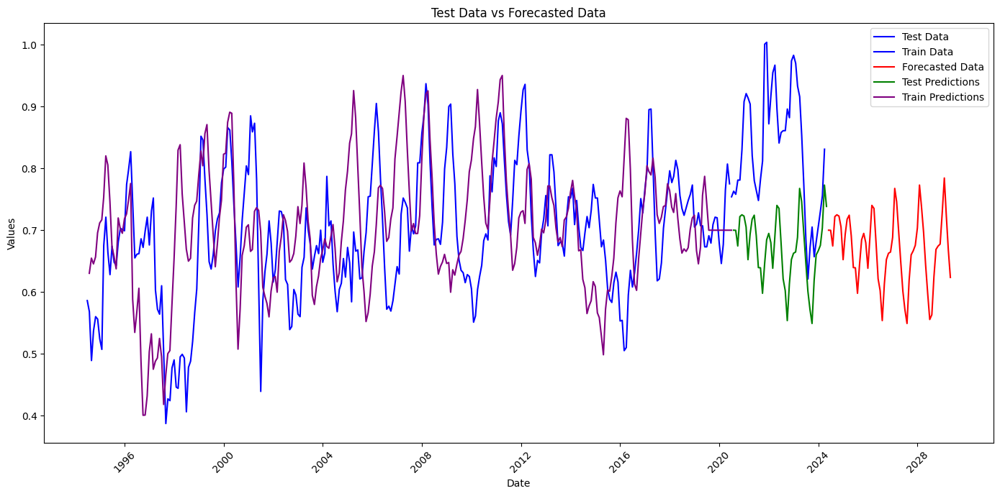

In [155]:
# Perform predictions
training_predictions, test_predictions = predict_all_data(scaled_train_data, scaled_test_data, best_model, timesteps, features, scaler)
future_forecast = predict_future_values(scaled_train_data, best_model, timesteps, features, forecast_length=60, scaler=scaler)

# Create date ranges for training, test, and forecast data
train_dates = pd.date_range(start=X.index[0], periods=len(training_predictions), freq='M')
test_dates = pd.date_range(start=X.index[-len(test_predictions)], periods=len(test_predictions), freq='M')
forecast_dates = pd.date_range(start=X.index[-1] + pd.DateOffset(months=1), periods=60, freq='M')

# Convert results to DataFrames
train_predictions_df = pd.DataFrame(training_predictions, index=train_dates, columns=X.columns)
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
plt.plot(X_test.index, X_test['Sea_Level_Mean'].values, label='Test Data', color='blue')
plt.plot(X_train.index, X_train['Sea_Level_Mean'].values, label='Train Data', color='blue')

# Plot forecast data
plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Forecasted Data', color='red')
plt.plot(test_predictions_df.index, test_predictions_df['Sea_Level_Mean'].values, label='Test Predictions', color='green')
plt.plot(train_predictions_df.index, train_predictions_df['Sea_Level_Mean'].values, label='Train Predictions', color='purple')

plt.title('Test Data vs Forecasted Data')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [156]:
# Calculate evaluation metrics
def calculate_metrics(true_values, predicted_values):
    mse = mean_squared_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(true_values, predicted_values)
    mape = np.mean(np.abs((true_values - predicted_values) / true_values)) * 100
    r2 = r2_score(true_values, predicted_values)
    return mse, rmse, mae, mape, r2

# Calculate metrics for test data
test_mse, test_rmse, test_mae, test_mape, test_r2 = calculate_metrics(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'])
print(f'Test MSE: {test_mse}, RMSE: {test_rmse}, MAE: {test_mae}, MAPE: {test_mape}, R-squared: {test_r2}')



Test MSE: 0.034522314800143714, RMSE: 0.18580181592262146, MAE: 0.15999061428982278, MAPE: 18.3118743909081, R-squared: -2.5002225751920593


## Tuvalu

### Train and Test Split

In [157]:
X = tuvalu.drop(columns=['Sea_Level_Mean'])
y = tuvalu['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

### Basic models

#### Linear Regression - Baseline

In [158]:
np.random.seed(42)
# from matplotlib import pyplot
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Model evaluation
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse}')

mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2:.6f}")

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape:.2f}%")

mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae:.2f}%")

Root Mean Squared Error: 0.02556156644466561
Mean Squared Error: 0.0006533936791050549
R-squared: 0.856923
Mean Absolute Percentage Error: 1.01%
Mean Absolute Error: 0.02%


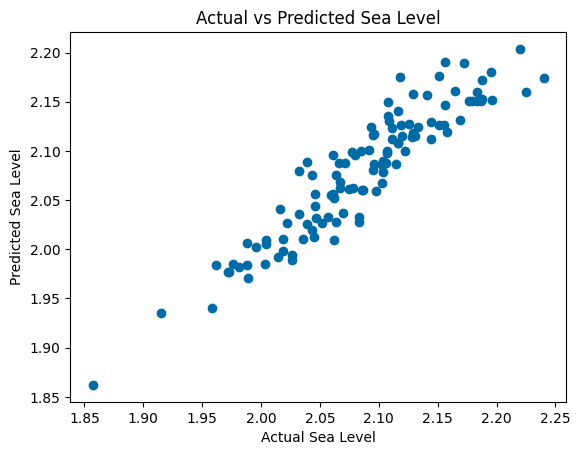

In [159]:
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Sea Level')
plt.ylabel('Predicted Sea Level')
plt.title('Actual vs Predicted Sea Level')
plt.show()

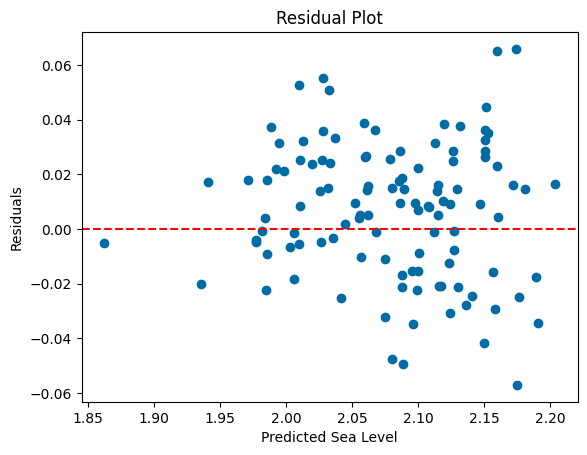

In [160]:
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.xlabel('Predicted Sea Level')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

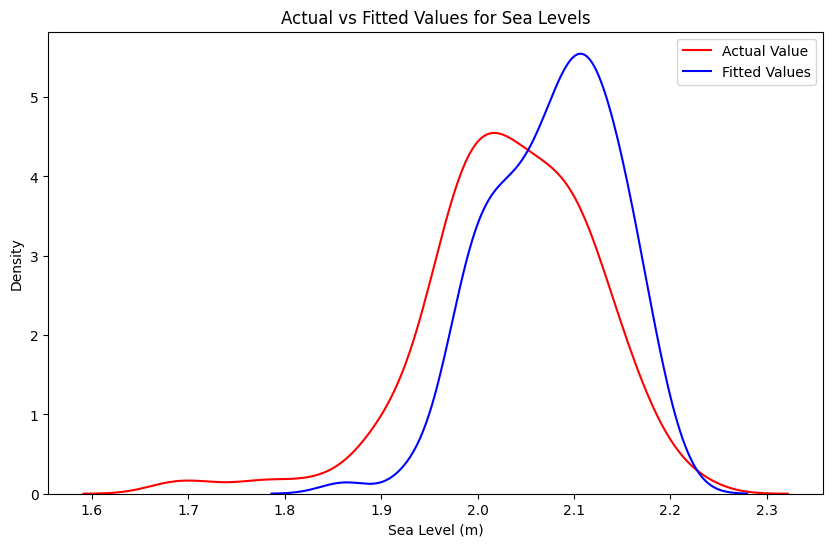

In [161]:
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(y, color="r", label="Actual Value")
sns.kdeplot(y_pred, color="b", label="Fitted Values", ax=ax1)

plt.title('Actual vs Fitted Values for Sea Levels')
plt.xlabel('Sea Level (m)')
plt.ylabel('Density')

plt.legend()
plt.show()
plt.close()

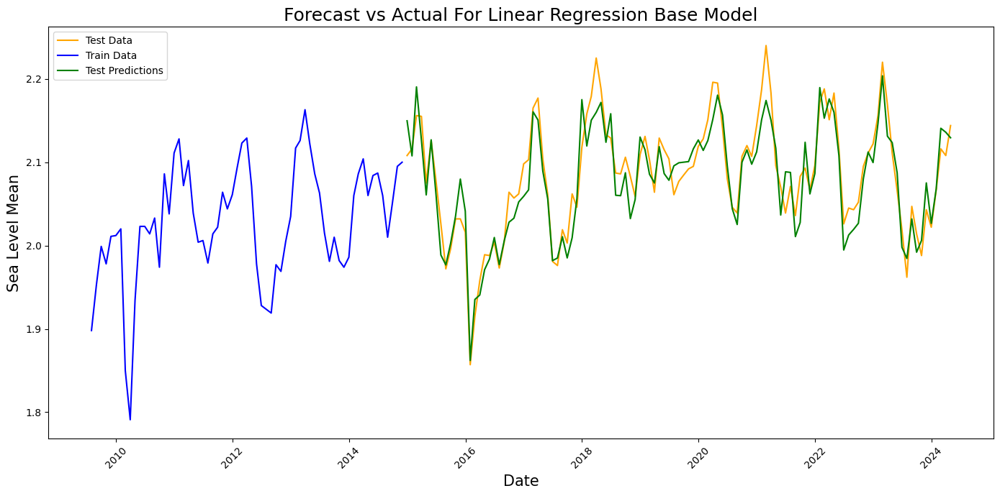

In [162]:
# Create date ranges for training, test, and forecast data
y_train = y_train['2009-07-01':]
train_dates = pd.date_range(start=y_train.index[-len(y_train)], periods=len(y_train), freq='M')
test_dates = pd.date_range(start=y.index[-len(y_pred)], periods=len(y_pred), freq='M')

# Convert results to DataFrames
train_values_df = pd.DataFrame(y_train.values, index=train_dates)
test_predictions_df = pd.DataFrame(y_pred, index=test_dates)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
# Use .to_timestamp() to align the index types
plt.plot(test_predictions_df.index, y_test.values, label='Test Data', color='orange')
plt.plot(train_values_df.index, y_train.values, label='Train Data', color='blue')

# Plot forecast data
# plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Forecasted Data', color='red')
plt.plot(test_predictions_df.index, y_pred, label='Test Predictions', color='green')
# plt.plot(train_predictions_df.index, train_predictions_df.values, label='Train Predictions', color='purple')

# Show the plot
plt.title('Forecast vs Actual For Linear Regression Base Model', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


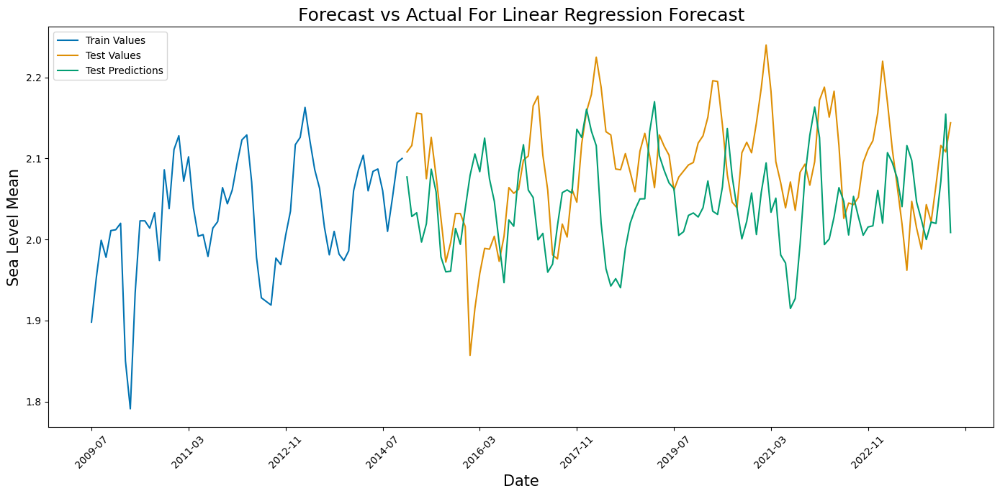

Root Mean Squared Error: 0.09255893380464167
Mean Squared Error: 0.008567156227052038
R-squared: -0.875999
Mean Absolute Percentage Error: 3.60%
Mean Absolute Error: 0.08%


In [163]:
X = tuvalu_dat.drop(columns=['Sea_Level_Mean'])
y = tuvalu_dat['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Linear regression forecaster
regressor = LinearRegression()
forecaster = make_reduction(regressor, window_length=180, strategy="recursive")

# Fit and predict
forecaster.fit(y_train)
y_pred = forecaster.predict(fh=fh)

fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["Train Values", "Test Values", "Test Predictions"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual For Linear Regression Forecast', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse}')

mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2:.6f}")

mape = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape:.2f}%")

mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae:.2f}%")

#### XGBRegressor

In [164]:
import xgboost as xgb

np.random.seed(42)
X = tuvalu_dat.drop(columns=['Sea_Level_Mean'])
y = tuvalu_dat['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)
# Initialize the XGBoost Regressor
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Train the model
xgb_model.fit(X_train, y_train)

# Perform predictions
train_predictions = xgb_model.predict(X_train)
test_predictions = xgb_model.predict(X_test)

# Calculate evaluation metrics
def calculate_metrics(true_values, predicted_values):
    mse = mean_squared_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(true_values, predicted_values)
    mape = np.mean(np.abs((true_values - predicted_values) / true_values)) * 100
    r2 = r2_score(true_values, predicted_values)
    return mse, rmse, mae, mape, r2

# Calculate metrics for training data
train_mse, train_rmse, train_mae, train_mape, train_r2 = calculate_metrics(y_train, train_predictions)
print(f'Training MSE: {train_mse}, RMSE: {train_rmse}, MAE: {train_mae}, MAPE: {train_mape}, R-squared: {train_r2}')

# Calculate metrics for test data
test_mse, test_rmse, test_mae, test_mape, test_r2 = calculate_metrics(y_test, test_predictions)
print(f'Test MSE: {test_mse}, RMSE: {test_rmse}, MAE: {test_mae}, MAPE: {test_mape}, R-squared: {test_r2}')


Training MSE: 5.211785284659137e-07, RMSE: 0.0007219269550764216, MAE: 0.000515135783345325, MAPE: 0.025647356307650575, R-squared: 0.9999322854713241
Test MSE: 0.0016569216275508468, RMSE: 0.04070530220439159, MAE: 0.03226918681321948, MAPE: 1.5345484161824532, R-squared: 0.6371744058944586


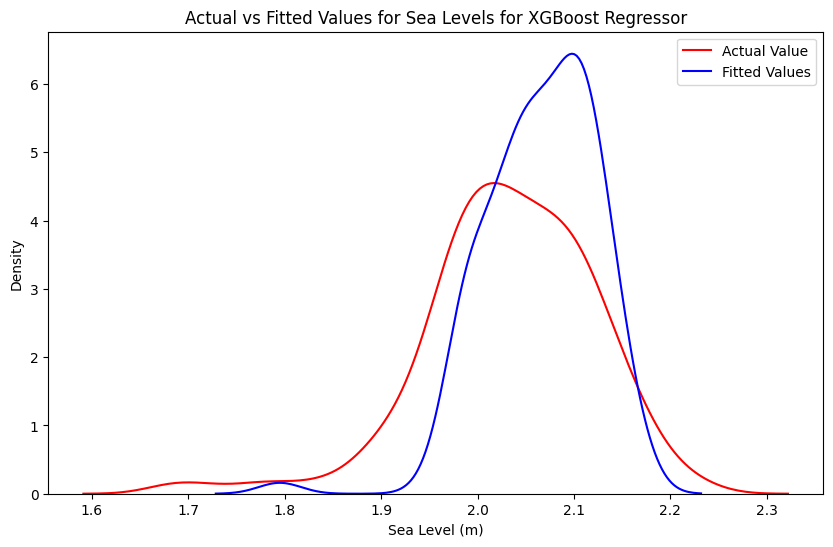

In [165]:
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(y, color="r", label="Actual Value")
sns.kdeplot(test_predictions, color="b", label="Fitted Values", ax=ax1)

plt.title('Actual vs Fitted Values for Sea Levels for XGBoost Regressor')
plt.xlabel('Sea Level (m)')
plt.ylabel('Density')

plt.legend()
plt.show()
plt.close()

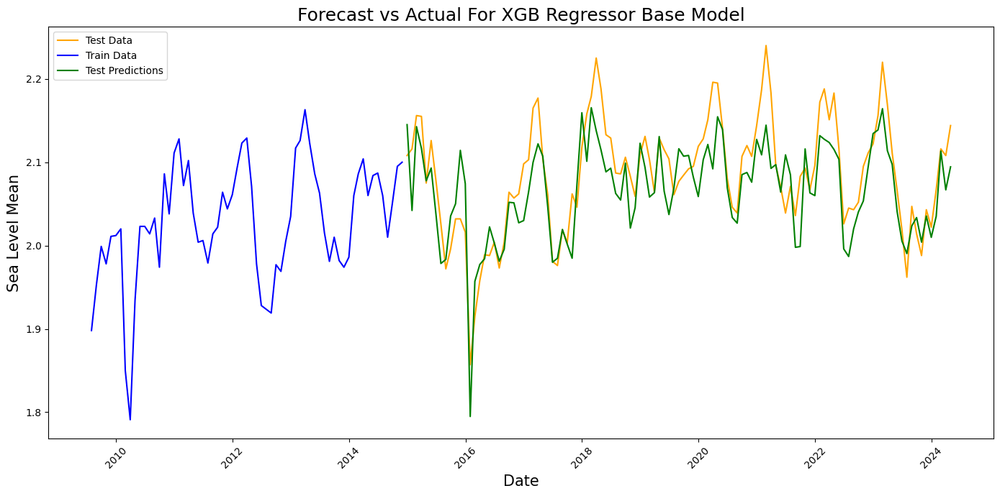

In [166]:
# Create date ranges for training, test, and forecast data
y_train = y_train['2009-07-01':]
train_dates = pd.date_range(start=y_train.index[-len(y_train)].to_timestamp(), periods=len(y_train), freq='M')
test_dates = pd.date_range(start=y.index[-len(test_predictions)].to_timestamp(), periods=len(test_predictions), freq='M')

# Convert results to DataFrames
train_values_df = pd.DataFrame(y_train.values, index=train_dates)
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
# Use .to_timestamp() to align the index types
plt.plot(test_predictions_df.index, y_test.values, label='Test Data', color='orange')
plt.plot(train_values_df.index, y_train.values, label='Train Data', color='blue')

# Plot forecast data
# plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Forecasted Data', color='red')
plt.plot(test_predictions_df.index, test_predictions_df.values, label='Test Predictions', color='green')
# plt.plot(train_predictions_df.index, train_predictions_df.values, label='Train Predictions', color='purple')

# Show the plot
plt.title('Forecast vs Actual For XGB Regressor Base Model', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

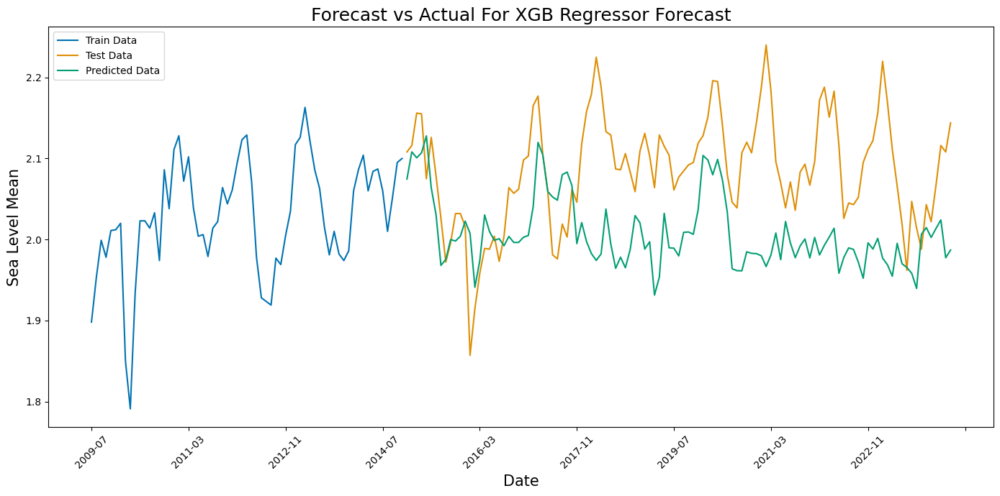

Root Mean Squared Error: 0.10793278916476769
Mean Squared Error: 0.011649486976886194
R-squared : -1.550955
Mean Absolute Percentage Error: 4.26%
Mean Absolute Error: 0.09%


In [167]:
np.random.seed(42)
X = tuvalu_dat.drop(columns=['Sea_Level_Mean'])
y = tuvalu_dat['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# XGBoost forecaster
regressor = XGBRegressor(objective='reg:squarederror', r0andom_state=42)
forecaster = make_reduction(regressor, window_length=60, strategy="recursive")

# Fit and predict
forecaster.fit(y=y_train, X=X_train)
y_pred = forecaster.predict(fh=fh, X=X_test)

fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["Train Data", "Test Data", "Predicted Data"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
# Show the plot
plt.title('Forecast vs Actual For XGB Regressor Forecast', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
rmse_xgb = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse_xgb}')

mse_xgb = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse_xgb}')

r2_xgb = r2_score(y_test, y_pred)
print(f"R-squared : {r2_xgb:.6f}")

mape_xgb = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape_xgb:.2f}%")

mae_xgb = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae_xgb:.2f}%")

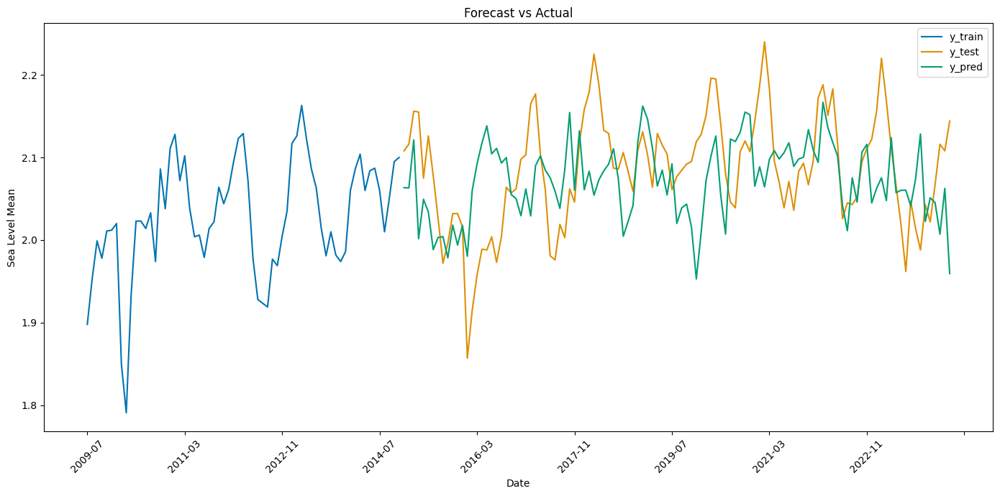

Root Mean Squared Error: 0.07655585476506548
Mean Squared Error: 0.005860798898809798
R-squared: -0.283373
Mean Absolute Percentage Error: 2.95%
Mean Absolute Error: 0.06%


In [168]:
np.random.seed(42)
X = tuvalu_dat.drop(columns=['Sea_Level_Mean'])
y = tuvalu_dat['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Window for cross-validation
validation_size = 26
cv = SingleWindowSplitter(window_length=len(y)-validation_size, fh=validation_size)

# XGBoost forecaster with grid of parameters and detrender and deseasonaliser
regressor = XGBRegressor(objective='reg:squarederror', random_state=42)
forecaster = TransformedTargetForecaster(
    [
        ("deseasonalize", Deseasonalizer(model="multiplicative", sp=52)),
        ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=1))),
        ("forecast", make_reduction(regressor, window_length=195, strategy="recursive"),
        ),
    ]
)

# Param grid
param_grid = {
    'deseasonalize__model': ['multiplicative', 'additive'],
    'detrend__forecaster__degree': [1, 2, 3],
    'forecast__estimator__max_depth': [3, 5, 6, 10, 15, 20],
    'forecast__estimator__learning_rate': [0.01, 0.1, 0.2, 0.3],
    'forecast__estimator__subsample': np.arange(0.5, 1.0, 0.1),
    'forecast__estimator__colsample_bytree': np.arange(0.4, 1.0, 0.1),
    'forecast__estimator__colsample_bylevel': np.arange(0.4, 1.0, 0.1),
    'forecast__estimator__n_estimators': [100, 500, 1000]
}

# Randomised search
gscv = ForecastingRandomizedSearchCV(forecaster, cv=cv, param_distributions=param_grid, n_iter=100, random_state=42)

# Fit and predict
gscv.fit(y=y_train, X=X_train)
y_pred = gscv.predict(fh=fh, X=X_test)

fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sea Level Mean')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
# Model evaluation
rmse_xgb = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse_xgb}')

mse_xgb = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse_xgb}')

r2_xgb = r2_score(y_test, y_pred)
print(f"R-squared: {r2_xgb:.6f}")

mape_xgb = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape_xgb:.2f}%")

mae_xgb = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae_xgb:.2f}%")

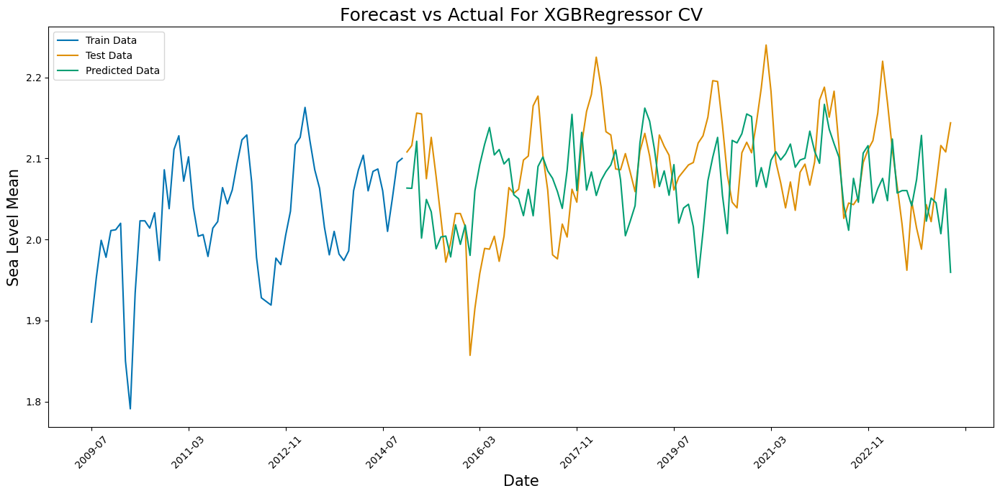

In [169]:
fig, ax = plt.subplots(figsize=(14, 7))
plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["Train Data", "Test Data", "Predicted Data"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual For XGBRegressor CV', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### Random Forest Regressor

In [170]:
X = tuvalu_dat.drop(columns=['Sea_Level_Mean'])
y = tuvalu_dat['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)
np.random.seed(42)
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

# Predictions
y_pred_rf = rf_model.predict(X_test)

# Model evaluation
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

mae_rf = mean_absolute_error(y_test, y_pred_rf)
print(f"Mean Absolute Error (Random Forest): {mae_rf:.2f}%")

Root Mean Squared Error (Random Forest): 0.03867082899921769
Mean Squared Error (Random Forest): 0.0014954330154867358
R-squared (Random Forest): 0.672536
Mean Absolute Percentage Error (Random Forest): 1.45%
Mean Absolute Error (Random Forest): 0.03%


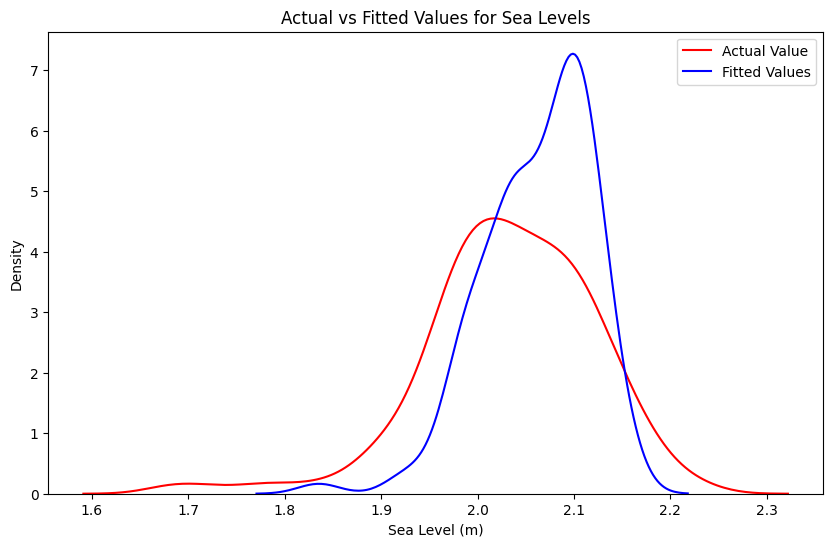

In [171]:
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(y, color="r", label="Actual Value")
sns.kdeplot(y_pred_rf, color="b", label="Fitted Values", ax=ax1)

plt.title('Actual vs Fitted Values for Sea Levels')
plt.xlabel('Sea Level (m)')
plt.ylabel('Density')

plt.legend()
plt.show()
plt.close()

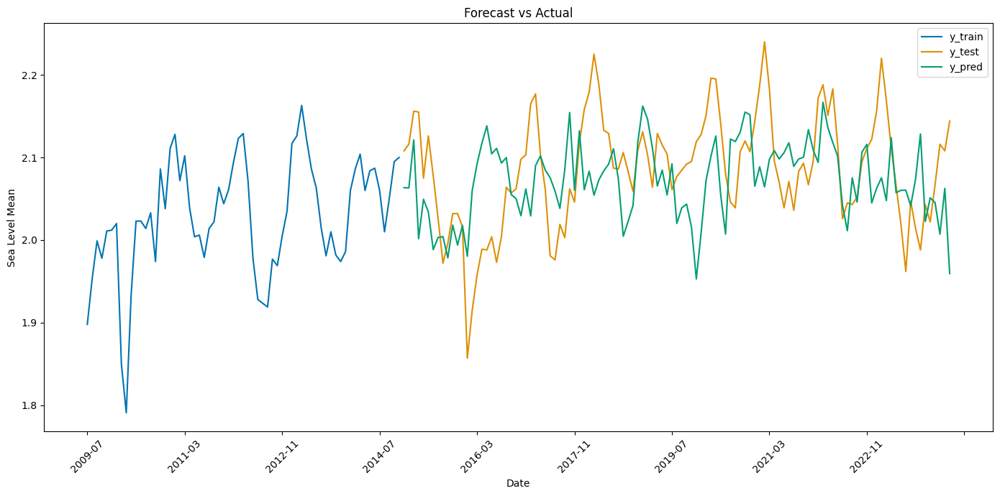

Root Mean Squared Error (Random Forest): 0.1102005171307517
Mean Squared Error (Random Forest): 0.012144153975885098
R-squared (Random Forest): -1.659275
Mean Absolute Percentage Error (Random Forest): 4.26%
Mean Absolute Error (Random Forest): 0.09%


In [172]:
np.random.seed(42)
X = tuvalu_dat.drop(columns=['Sea_Level_Mean'])
y = tuvalu_dat['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False, freq='M')

# Linear regression forecaster
regressor = RandomForestRegressor()
forecaster = make_reduction(regressor, window_length=170, strategy="recursive")

# Fit and predict
forecaster.fit(y_train)
y_pred_rf = forecaster.predict(fh=fh)

# Plot predictions with training and test data
fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sea Level Mean')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

mae_rf = mean_absolute_error(y_test, y_pred_rf)
print(f"Mean Absolute Error (Random Forest): {mae_rf:.2f}%")

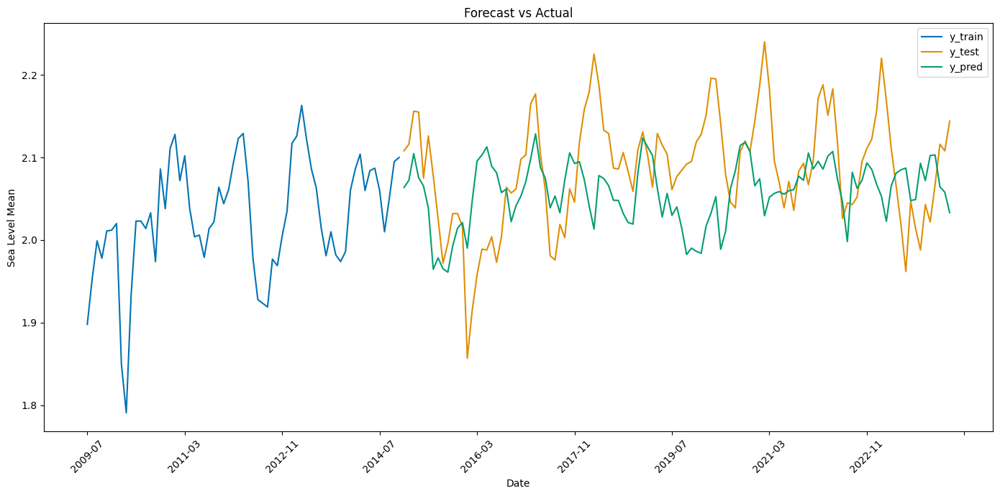

Root Mean Squared Error (Random Forest): 0.07839565664727734
Mean Squared Error (Random Forest): 0.0061458789811577996
R-squared (Random Forest): -0.345798
Mean Absolute Percentage Error (Random Forest): 2.98%


In [173]:
np.random.seed(42)
X = tuvalu_dat.drop(columns=['Sea_Level_Mean'])
y = tuvalu_dat['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Window for cross-validation
validation_size = 26
cv = SingleWindowSplitter(window_length=len(y)-validation_size, fh=validation_size)

# XGBoost forecaster with grid of parameters and detrender and deseasonaliser
regressor = RandomForestRegressor()
forecaster = TransformedTargetForecaster(
    [
        ("deseasonalize", Deseasonalizer(model="multiplicative", sp=52)),
        ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=1))),
        ("forecast", make_reduction(regressor, window_length=195, strategy="recursive"),
        ),
    ]
)

# Param grid
param_grid = {
    'deseasonalize__model': ['multiplicative', 'additive'],
    'detrend__forecaster__degree': [1, 2, 3],
    'forecast__estimator__max_depth': [3, 5, 6, 10, 15, 20],
    'forecast__estimator__n_estimators': [100, 200, 300]
}

# Randomised search
gscv = ForecastingRandomizedSearchCV(forecaster, cv=cv, param_distributions=param_grid, n_iter=100, random_state=42)

# Fit and predict
gscv.fit(y=y_train, X=X_train)
y_pred = gscv.predict(fh=fh, X=X_test)

# Plot predictions with training and test data
fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Sea Level Mean')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Evaluate
rmse_rf = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

In [174]:
# Evaluate
rmse_rf = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

mae_rf = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error (Random Forest): {mae_rf:.2f}%")

Root Mean Squared Error (Random Forest): 0.07839565664727734
Mean Squared Error (Random Forest): 0.0061458789811577996
R-squared (Random Forest): -0.345798
Mean Absolute Percentage Error (Random Forest): 2.98%
Mean Absolute Error (Random Forest): 0.06%


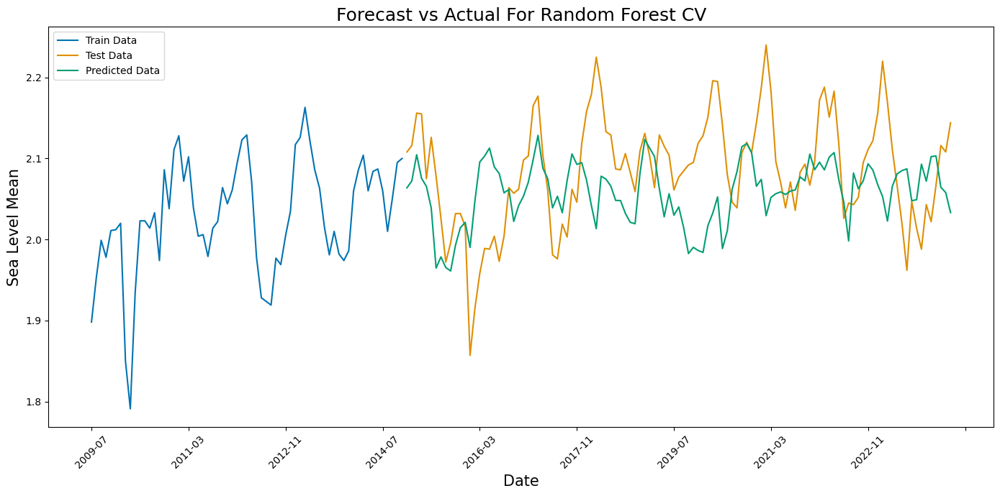

In [175]:
# Plot predictions with training and test data
fig, ax = plt.subplots(figsize=(14, 7))

plot_series(y_train['2009-07-01':], y_test, y_pred, labels=["Train Data", "Test Data", "Predicted Data"], ax=ax, x_label='Date', y_label='Sea Level Mean')

# Customize plot to remove markers (dots)
lines = ax.get_lines()  # Get all the line objects from the plot
for line in lines:
    line.set_marker(None)  # Remove markers

# Show the plot
plt.title('Forecast vs Actual For Random Forest CV', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### ARIMA

In [176]:
auto_arima(tuvalu['Sea_Level_Mean'], seasonal=True, m=12,max_p=7, max_d=5,max_q=7, max_P=4, max_D=4,max_Q=4).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                       y   No. Observations:                  374
Model:             SARIMAX(3, 1, 1)x(1, 0, [1, 2], 12)   Log Likelihood                 627.542
Date:                                 Sat, 24 Aug 2024   AIC                          -1237.084
Time:                                         21:40:14   BIC                          -1201.790
Sample:                                     03-01-1993   HQIC                         -1223.069
                                          - 04-01-2024                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   2.713e-06   4.52e-05      0.060      0.952   -8.58e-05    9.13e-05
ar.L1          0.9680      0.064     15.067      0.000       0.842       1.094
ar.L2         -0.2698      0.063     -4.303      0.000      -0.393      -0.147
ar.L3         -0.0313      0.067     -0.464      0.643      -0.163       0.101
ma.L1         -0.8756      0.050    -17.659      0.000      -0.973      -0.778
ar.S.L12       0.9344      0.059     15.963      0.000       0.820       1.049
ma.S.L12      -0.8369      0.086     -9.744      0.000      -1.005      -0.669
ma.S.L24       0.0102      0.065      0.157      0.875      -0.117       0.137
sigma2         0.0020      0.000     16.575      0.000       0.002       0.002
===================================================================================
Ljung-Box (L1) (Q):                   3.88   Jarque-Bera (JB):                93.96
Prob(Q):                              0.05   Prob(JB):                         0.00
Heteroskedasticity (H):               0.71   Skew:                            -0.04
Prob(H) (two-sided):                  0.06   Kurtosis:                         5.46
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [177]:
X = tuvalu.drop(columns=['Sea_Level_Mean'])
y = tuvalu['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

arima_model = SARIMAX(y_train, order = (2,1,1), seasonal_order = (6,2,3,12)) # 4,0,3,12
arima_result = arima_model.fit()
arima_result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                         SARIMAX Results                                          
==================================================================================================
Dep. Variable:                             Sea_Level_Mean   No. Observations:                  261
Model:             SARIMAX(2, 1, 1)x(6, 2, [1, 2, 3], 12)   Log Likelihood                 341.294
Date:                                    Sat, 24 Aug 2024   AIC                           -656.587
Time:                                            21:42:23   BIC                           -611.557
Sample:                                        03-01-1993   HQIC                          -638.435
                                             - 11-01-2014                                         
Covariance Type:                                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8208      0.107      7.670      0.000       0.611       1.031
ar.L2         -0.1575      0.070     -2.239      0.025      -0.295      -0.020
ma.L1         -0.8502      0.105     -8.126      0.000      -1.055      -0.645
ar.S.L12      -2.0495      0.315     -6.514      0.000      -2.666      -1.433
ar.S.L24      -2.4976      0.535     -4.665      0.000      -3.547      -1.448
ar.S.L36      -1.9390      0.445     -4.353      0.000      -2.812      -1.066
ar.S.L48      -1.4618      0.339     -4.316      0.000      -2.126      -0.798
ar.S.L60      -0.8619      0.223     -3.861      0.000      -1.299      -0.424
ar.S.L72      -0.3681      0.090     -4.090      0.000      -0.545      -0.192
ma.S.L12       0.2751     11.320      0.024      0.981     -21.913      22.463
ma.S.L24      -0.3819     14.581     -0.026      0.979     -28.959      28.196
ma.S.L36      -0.8898     10.302     -0.086      0.931     -21.081      19.301
sigma2         0.0023      0.026      0.088      0.930      -0.049       0.053
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                17.19
Prob(Q):                              0.89   Prob(JB):                         0.00
Heteroskedasticity (H):               0.78   Skew:                             0.01
Prob(H) (two-sided):                  0.28   Kurtosis:                         4.32
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [178]:
np.random.seed(42)
arima_pred = arima_result.predict(start = 20, end = len(tuvalu)+45, typ="levels").rename("ARIMA Predictions")
arima_pred

,ARIMA Predictions
1994-11-01,1.982000
1994-12-01,1.984000
1995-01-01,2.163500
1995-02-01,2.038000
1995-03-01,1.623167
...,...
2027-10-01,2.383776
2027-11-01,2.357370
2027-12-01,2.421999
2028-01-01,2.482779


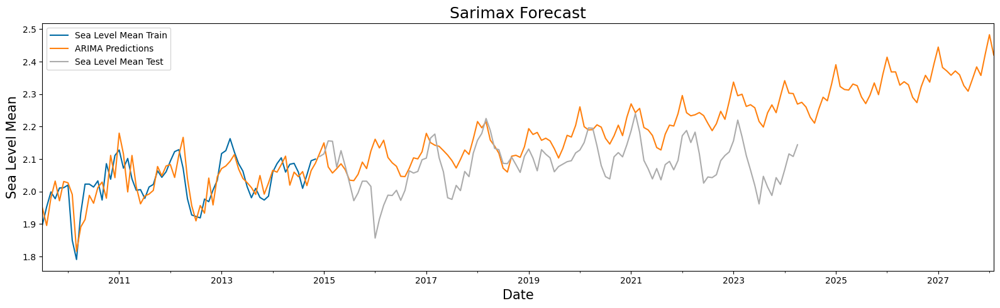

In [179]:
y_train['2009-07-01':].plot(figsize = (16,5), legend=True, label = 'Sea Level Mean Train')
arima_pred['2009-07-01':].plot(legend = True)
y_test.plot(legend=True, label = 'Sea Level Mean Test')
plt.title('Sarimax Forecast', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Sea Level Mean', fontsize=15)
plt.legend()
plt.tight_layout()
plt.show()
# plt.savefig('images/SARIMAX.png')

In [180]:
# Model evaluation
dates = y_test.index
arima_pred_series = pd.Series(arima_pred, index=dates)

# Slice arima_pred to match the dates in y_test
arima_pred_slice = arima_pred_series.loc[y_test.index]

# Calculate RMSE
rmse_arima = mean_squared_error(y_test, arima_pred_slice, squared=False)
print(f'Root Mean Squared Error: {rmse_arima}')

mse_arima = mean_squared_error(y_test, arima_pred_slice)
print(f'Mean Squared Error: {mse_arima}')

r2_arima = r2_score(y_test, arima_pred_slice)
print(f"R-squared: {r2_arima:.6f}")

mape_arima = mean_absolute_percentage_error(y_test, arima_pred_slice)
print(f"Mean Absolute Percentage Error: {mape_arima:.2f}%")

mae_arima = mean_absolute_error(y_test, arima_pred_slice)
print(f"Mean Absolute Error: {mae_arima:.2f}%")

Root Mean Squared Error: 0.11525508885280959
Mean Squared Error: 0.013283735506469035
R-squared: -1.908815
Mean Absolute Percentage Error: 4.49%
Mean Absolute Error: 0.09%


In [181]:
arima_pred_slice

,ARIMA Predictions
Date,
2014-12-01,2.118223
2015-01-01,2.150021
2015-02-01,2.075924
2015-03-01,2.057129
2015-04-01,2.070611
...,...
2023-12-01,2.293208
2024-01-01,2.341374
2024-02-01,2.302868


In [182]:
# Model evaluation
dates = y_train['1994-08-01':].index
arima_pred_series = pd.Series(arima_pred, index=dates)

# Slice arima_pred to match the dates in y_test
arima_pred_slice = arima_pred_series.loc[dates]

# Calculate RMSE
rmse_arima = mean_squared_error(y_train['1994-11-01':], arima_pred_slice['1994-11-01':], squared=False)
print(f'Root Mean Squared Error: {rmse_arima}')

mse_arima = mean_squared_error(y_train['1994-11-01':], arima_pred_slice['1994-11-01':])
print(f'Mean Squared Error: {mse_arima}')

r2_arima = r2_score(y_train['1994-11-01':], arima_pred_slice['1994-11-01':])
print(f"R-squared: {r2_arima:.6f}")

mape_arima = mean_absolute_percentage_error(y_train['1994-11-01':], arima_pred_slice['1994-11-01':])
print(f"Mean Absolute Percentage Error: {mape_arima:.2f}%")

mae_arima = mean_absolute_error(y_train['1994-11-01':], arima_pred_slice['1994-11-01':])
print(f"Mean Absolute Error: {mae_arima:.2f}%")

Root Mean Squared Error: 0.06987554685588203
Mean Squared Error: 0.004882592048408565
R-squared: 0.372845
Mean Absolute Percentage Error: 2.34%
Mean Absolute Error: 0.05%


In [183]:
y_test2 = y_test
y_test2['ARIMA_Predictions'] = arima_pred

Root Mean Squared Error: 0.11525508885280959
Mean Squared Error: 0.013283735506469035
R-squared: -1.908815
Mean Absolute Percentage Error: 0.04%
Mean Absolute Error: 0.09%


<Axes: xlabel='Date'>

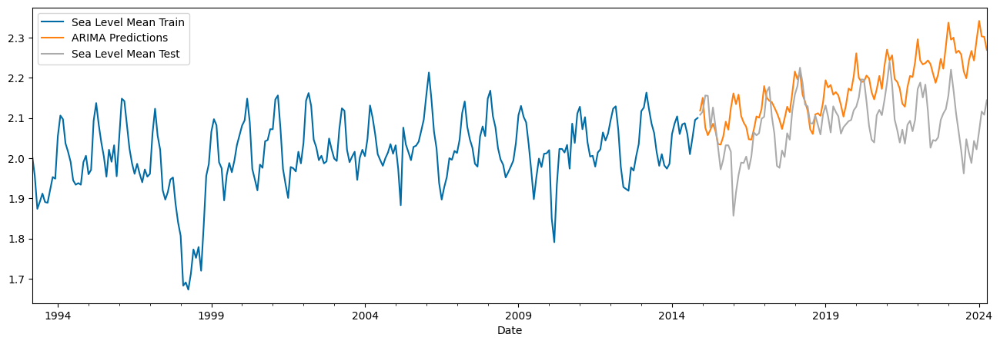

In [184]:
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.base import BaseEstimator, RegressorMixin

# Custom SARIMAX model wrapper compatible with Scikit-learn's API
class SARIMAXWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12)):
        self.order = order
        self.seasonal_order = seasonal_order
        self.model_ = None

    def fit(self, y, X=None):
        self.model_ = SARIMAX(y, order=self.order, seasonal_order=self.seasonal_order)
        self.model_ = self.model_.fit(disp=False)
        return self

    def predict(self, start=None, end=None, X=None):
        if start is None:
            start = 0
        if end is None:
            end = len(X) - 1
        return self.model_.predict(start=start, end=end)

# Assuming kiribati dataframe is loaded and 'Sea_Level_Mean' is the target variable
X = tuvalu.drop(columns=['Sea_Level_Mean'])
y = tuvalu['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)

# Define the parameter grid for GridSearchCV
param_grid = {
    'order': [(2, 1, 1), (3, 1, 1), (2, 1, 2)],
    'seasonal_order': [(6, 2, 3, 12), (6, 1, 3, 12), (5, 1, 2, 12)]
}

# Create time series split
tscv = TimeSeriesSplit(n_splits=3)

# Perform GridSearchCV
gscv = GridSearchCV(SARIMAXWrapper(), param_grid, cv=tscv, scoring='neg_mean_squared_error', n_jobs=-1)
gscv.fit(y_train)

# Best model
best_model = gscv.best_estimator_

# Make predictions
arima_pred = best_model.predict(start=1, end=len(y_train) + len(y_test) - 1)

# Convert predictions to series
dates = y_test.index
arima_pred_series = pd.Series(arima_pred, index=dates)

# Calculate evaluation metrics
rmse_arima = mean_squared_error(y_test, arima_pred_series, squared=False)
mse_arima = mean_squared_error(y_test, arima_pred_series)
r2_arima = r2_score(y_test, arima_pred_series)
mape_arima = mean_absolute_percentage_error(y_test, arima_pred_series)
mae_arima = mean_absolute_error(y_test, arima_pred_series)

# Print evaluation metrics
print(f'Root Mean Squared Error: {rmse_arima}')
print(f'Mean Squared Error: {mse_arima}')
print(f"R-squared: {r2_arima:.6f}")
print(f"Mean Absolute Percentage Error: {mape_arima:.2f}%")
print(f"Mean Absolute Error: {mae_arima:.2f}%")

# Plot results
y_train.plot(figsize=(16, 5), legend=True, label='Sea Level Mean Train')
arima_pred_series.plot(legend=True, label='ARIMA Predictions')
y_test.plot(legend=True, label='Sea Level Mean Test')
# plt.savefig('images/SARIMAX_GridSearch.png')


### Neural Networks

#### LSTM

In [185]:
X = tuvalu
y = tuvalu['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)

In [186]:
scaler = MinMaxScaler()
scaler.fit(X_train)
scaler_test = MinMaxScaler()
scaler_test.fit(X_test)
scaled_train_data = scaler.transform(X_train)
scaled_test_data = scaler.transform(X_test)

In [187]:
timesteps = 12  # Number of time steps to use in each sequence
features = scaled_train_data.shape[1]

# Create sequences using TimeseriesGenerator
generator = TimeseriesGenerator(scaled_train_data, scaled_train_data,
                                length=timesteps, batch_size=32)

In [188]:
# Define the model
model = Sequential()
model.add(LSTM(200, activation='relu', input_shape=(timesteps, features)))
model.add(Dense(features))

model.compile(optimizer='adam', loss='mean_squared_error')

In [189]:
history = model.fit(generator, epochs=245, verbose=1)

Epoch 1/245
8/8 [==============================] - 3s 64ms/step - loss: 0.2118
Epoch 2/245
8/8 [==============================] - 1s 64ms/step - loss: 0.0422
Epoch 3/245
8/8 [==============================] - 1s 64ms/step - loss: 0.0302
Epoch 4/245
8/8 [==============================] - 1s 65ms/step - loss: 0.0235
Epoch 5/245
8/8 [==============================] - 0s 61ms/step - loss: 0.0224
Epoch 6/245
8/8 [==============================] - 1s 71ms/step - loss: 0.0219
Epoch 7/245
8/8 [==============================] - 0s 53ms/step - loss: 0.0211
Epoch 8/245
8/8 [==============================] - 0s 38ms/step - loss: 0.0209
Epoch 9/245
8/8 [==============================] - 0s 30ms/step - loss: 0.0204
Epoch 10/245
8/8 [==============================] - 0s 31ms/step - loss: 0.0201
Epoch 11/245
8/8 [==============================] - 0s 30ms/step - loss: 0.0204
Epoch 12/245
8/8 [==============================] - 0s 35ms/step - loss: 0.0199
Epoch 13/245
8/8 [==============================]

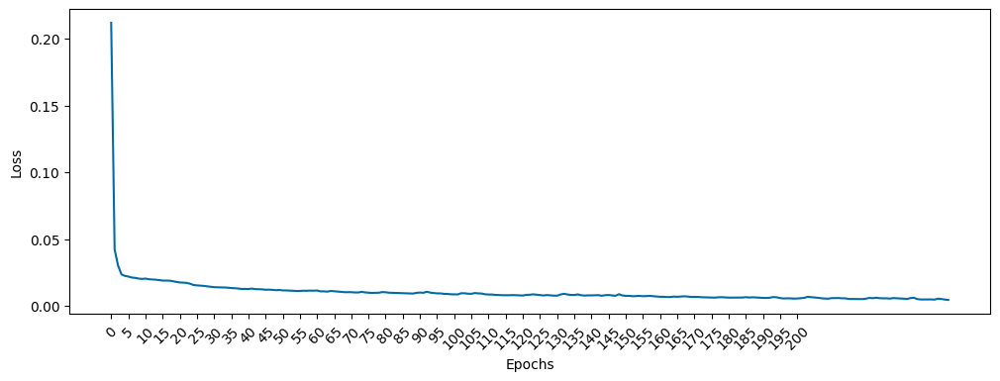

In [190]:
losses_lstm = history.history['loss']
plt.figure(figsize=(12,4))
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(np.arange(0,201,5), rotation = 45)
plt.plot(range(len(losses_lstm)),losses_lstm);

In [191]:
# Perform predictions
# Function to predict all data including training and test


def predict_all_data(scaled_train_data, scaled_test_data, model, timesteps, features, scaler):
    # Predicting training data
    training_predictions = []
    forecast_input = scaled_train_data[:timesteps]  # Use the start of the training data as the initial input

    for i in range(len(scaled_train_data)):
        forecast_input_reshaped = forecast_input.reshape((1, timesteps, features))
        prediction = model.predict(forecast_input_reshaped)
        training_predictions.append(prediction[0])

        if i + timesteps < len(scaled_train_data):
            forecast_input = np.append(forecast_input[1:], scaled_train_data[i + timesteps].reshape(1, -1), axis=0)

    # Convert the training predictions back to the original scale
    training_predictions = np.array(training_predictions)
    training_predictions = scaler.inverse_transform(training_predictions)

    # Predicting test data
    test_predictions = []
    forecast_input = scaled_train_data[-timesteps:]  # Use the end of the training data as the initial input

    for _ in range(len(scaled_test_data)):
        forecast_input_reshaped = forecast_input.reshape((1, timesteps, features))
        prediction = model.predict(forecast_input_reshaped)
        test_predictions.append(prediction[0])

        # Update forecast_input to include the latest prediction
        forecast_input = np.append(forecast_input[1:], prediction, axis=0)

    # Convert the test predictions back to the original scale
    test_predictions = np.array(test_predictions)
    test_predictions = scaler.inverse_transform(test_predictions)

    return training_predictions, test_predictions

# Predicting future values
def predict_future_values(scaled_train_data, model, timesteps, features, forecast_length, scaler):
    forecast_input = scaled_train_data[-timesteps:]
    forecast = []

    for _ in range(forecast_length):
        forecast_input_reshaped = forecast_input.reshape((1, timesteps, features))
        prediction = model.predict(forecast_input_reshaped)
        forecast.append(prediction[0])

        # Update forecast_input to include the latest prediction
        forecast_input = np.append(forecast_input[1:], prediction, axis=0)

    # Convert the forecast back to original scale
    forecast = np.array(forecast)
    forecast = scaler.inverse_transform(forecast)

    return forecast

training_predictions, test_predictions = predict_all_data(scaled_train_data, scaled_test_data, model, timesteps, features, scaler)
future_forecast = predict_future_values(scaled_train_data, model, timesteps, features, forecast_length=60, scaler = scaler)

# Create date ranges for training, test, and forecast data
train_dates = pd.date_range(start=X.index[0], periods=len(training_predictions), freq='M')
test_dates = pd.date_range(start=X.index[-len(test_predictions)], periods=len(test_predictions), freq='M')
forecast_dates = pd.date_range(start=X.index[-1] + pd.DateOffset(months=1), periods=60, freq='M')

# Convert results to DataFrames
train_predictions_df = pd.DataFrame(training_predictions, index=train_dates, columns=X.columns)
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)

1/1 [==============================] - 0s 34ms/step


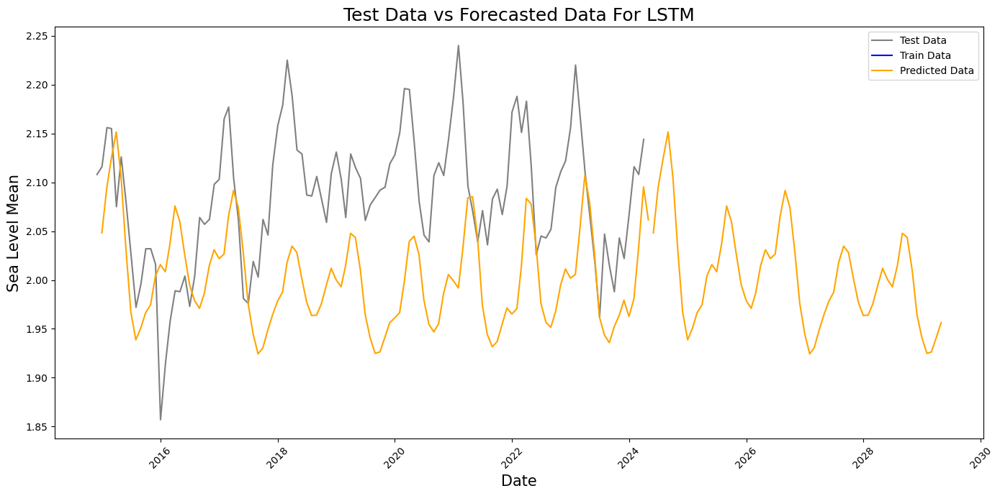

In [192]:
X_train_short = X_train['2015-07-01':]

test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
plt.plot(X_test.index, X_test['Sea_Level_Mean'].values, label='Test Data', color='grey')
plt.plot(X_train_short.index, X_train_short['Sea_Level_Mean'].values, label='Train Data', color='blue')

# Plot forecast data
plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Predicted Data', color='orange')
plt.plot(test_predictions_df.index, test_predictions_df['Sea_Level_Mean'].values, color='orange')
plt.plot(X_train_short.index, train_predictions_df['2015-07-01':]['Sea_Level_Mean'].values, color='orange')

plt.title('Test Data vs Forecasted Data For LSTM', fontsize = 18)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Sea Level Mean', fontsize = 15)
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [193]:
# Calculate RMSE
rmse_lstm = mean_squared_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values, squared=False)
print(f'Root Mean Squared Error: {rmse_lstm}')

mse_lstm = mean_squared_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f'Mean Squared Error: {mse_lstm}')

r2_lstm = r2_score(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"R-squared: {r2_lstm:.6f}")

mape_lstm = mean_absolute_percentage_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Percentage Error: {mape_lstm:.2f}%")

mae_lstm = mean_absolute_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Error: {mae_lstm:.2f}%")

Root Mean Squared Error: 0.10609451343341006
Mean Squared Error: 0.011256045780672026
R-squared: -1.464801
Mean Absolute Percentage Error: 0.04%
Mean Absolute Error: 0.09%


Training Evaluation

In [194]:
# Calculate RMSE
rmse_lstm = mean_squared_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values, squared=False)
print(f'Root Mean Squared Error: {rmse_lstm}')

mse_lstm = mean_squared_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f'Mean Squared Error: {mse_lstm}')

r2_lstm = r2_score(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"R-squared: {r2_lstm:.6f}")

mape_lstm = mean_absolute_percentage_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Percentage Error: {mape_lstm:.2f}%")

mae_lstm = mean_absolute_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Error: {mae_lstm:.2f}%")

Root Mean Squared Error: 0.10138538659048334
Mean Squared Error: 0.01027899661410176
R-squared: -0.335507
Mean Absolute Percentage Error: 0.04%
Mean Absolute Error: 0.07%


Best: -0.1261059635410006 using {'activation': 'tanh', 'batch_size': 32, 'epochs': 50, 'optimizer': 'adam', 'units': 100}
Epoch 1/245
8/8 [==============================] - 2s 15ms/step - loss: 0.0135
Epoch 2/245
8/8 [==============================] - 0s 14ms/step - loss: 0.0132
Epoch 3/245
8/8 [==============================] - 0s 16ms/step - loss: 0.0131
Epoch 4/245
8/8 [==============================] - 0s 14ms/step - loss: 0.0129
Epoch 5/245
8/8 [==============================] - 0s 14ms/step - loss: 0.0132
Epoch 6/245
8/8 [==============================] - 0s 14ms/step - loss: 0.0130
Epoch 7/245
8/8 [==============================] - 0s 14ms/step - loss: 0.0128
Epoch 8/245
8/8 [==============================] - 0s 17ms/step - loss: 0.0126
Epoch 9/245
8/8 [==============================] - 0s 14ms/step - loss: 0.0125
Epoch 10/245
8/8 [==============================] - 0s 14ms/step - loss: 0.0124
Epoch 11/245
8/8 [==============================] - 0s 14ms/step - loss: 0.0124
Epoch 1

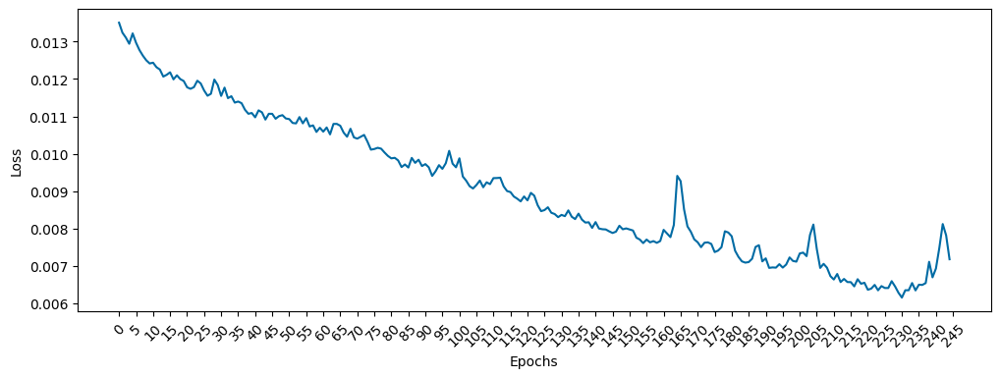

In [198]:
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV

# Example data, replace 'kiribati' with your actual dataset
X = tuvalu
y = tuvalu['Sea_Level_Mean']

# Train-test split
y_train, y_test = temporal_train_test_split(y, test_size=113)
X_train, X_test = temporal_train_test_split(X, test_size=113)
# Scaling data
scaler = MinMaxScaler()
scaler.fit(X_train)
scaler_test = MinMaxScaler()
scaler_test.fit(X_test)
scaled_train_data = scaler.transform(X_train)
scaled_test_data = scaler.transform(X_test)

# Create sequences using TimeseriesGenerator
timesteps = 12  # Number of time steps to use in each sequence
features = scaled_train_data.shape[1]

generator = TimeseriesGenerator(scaled_train_data, scaled_train_data,
                                length=timesteps, batch_size=32)

# Reshape input data to be 3D (samples, timesteps, features)
def reshape_data(X, timesteps, features):
    # Calculate the number of samples that can be formed with the given timesteps
    num_samples = X.shape[0] - timesteps

    # Initialize an array to hold the reshaped data
    reshaped_data = np.zeros((num_samples, timesteps, features))

    # Populate the reshaped data with sequences
    for i in range(num_samples):
        reshaped_data[i] = X[i:i+timesteps]

    return reshaped_data

# Update create_model to match input shape
def create_model(units=50, activation='relu', optimizer='adam'):
    model = Sequential()
    model.add(LSTM(units, activation=activation, input_shape=(timesteps, features)))
    model.add(Dense(features))
    model.compile(optimizer=optimizer, loss='mean_squared_error')
    return model

# Wrap the model using KerasRegressor
model = KerasRegressor(build_fn=create_model, verbose=0)

# Define the grid of hyperparameters to search
param_grid = {
    'units': [50, 100, 200],
    'activation': ['relu', 'tanh'],
    'batch_size': [32, 64],
    'epochs': [10, 50],
    'optimizer': ['adam', 'rmsprop']
}

# Use TimeSeriesSplit for time series cross-validation
tscv = TimeSeriesSplit(n_splits=3)

# Apply GridSearchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=tscv, scoring='neg_root_mean_squared_error', error_score='raise')

# Fit model using reshaped data
X_reshaped = reshape_data(scaled_train_data, timesteps, features)
y_reshaped = scaled_train_data[timesteps:]  # Adjust target variable

grid_result = grid.fit(X_reshaped, y_reshaped)

# Print the best score and the best parameters
print(f"Best: {grid_result.best_score_} using {grid_result.best_params_}")

# Train the model using the best parameters
best_model = grid_result.best_estimator_.model
history = best_model.fit(generator, epochs=245, verbose=1)
losses_lstm = history.history['loss']

# Plotting the loss over epochs
plt.figure(figsize=(12,4))
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(np.arange(0, 246, 5), rotation = 45)
plt.plot(range(len(losses_lstm)), losses_lstm)
plt.show()

1/1 [==============================] - 0s 29ms/step


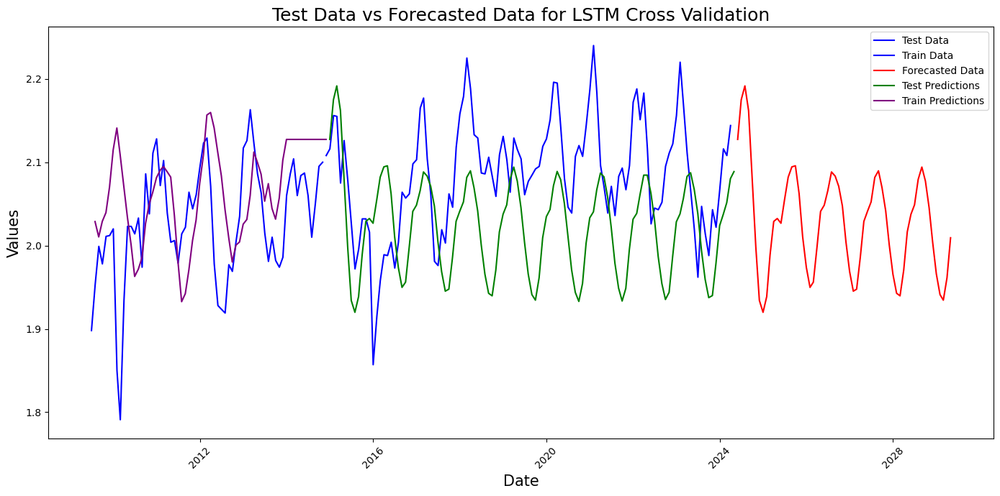

In [199]:
# Perform predictions
training_predictions, test_predictions = predict_all_data(scaled_train_data, scaled_test_data, best_model, timesteps, features, scaler)
future_forecast = predict_future_values(scaled_train_data, best_model, timesteps, features, forecast_length=60, scaler=scaler)

# Create date ranges for training, test, and forecast data
train_dates = pd.date_range(start=X.index[0], periods=len(training_predictions), freq='M')
test_dates = pd.date_range(start=X.index[-len(test_predictions)], periods=len(test_predictions), freq='M')
forecast_dates = pd.date_range(start=X.index[-1] + pd.DateOffset(months=1), periods=60, freq='M')

# Convert results to DataFrames
train_predictions_df = pd.DataFrame(training_predictions, index=train_dates, columns=X.columns)
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
plt.plot(X_test.index, X_test['Sea_Level_Mean'].values, label='Test Data', color='blue')
plt.plot(X_train['2009-07-01':].index, X_train['Sea_Level_Mean']['2009-07-01':].values, label='Train Data', color='blue')

# Plot forecast data
plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Forecasted Data', color='red')
plt.plot(test_predictions_df.index, test_predictions_df['Sea_Level_Mean'].values, label='Test Predictions', color='green')
plt.plot(train_predictions_df['2009-07-01':].index, train_predictions_df['Sea_Level_Mean']['2009-07-01':].values, label='Train Predictions', color='purple')

plt.title('Test Data vs Forecasted Data for LSTM Cross Validation', fontsize=18)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Values', fontsize=15)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [200]:
# Calculate evaluation metrics
def calculate_metrics(true_values, predicted_values):
    mse = mean_squared_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(true_values, predicted_values)
    mape = np.mean(np.abs((true_values - predicted_values) / true_values)) * 100
    r2 = r2_score(true_values, predicted_values)
    return mse, rmse, mae, mape, r2

# Calculate metrics for test data
test_mse, test_rmse, test_mae, test_mape, test_r2 = calculate_metrics(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'])
print(f'Test MSE: {test_mse}, RMSE: {test_rmse}, MAE: {test_mae}, MAPE: {test_mape}, R-squared: {test_r2}')



Test MSE: 0.00851575467009409, RMSE: 0.09228084671314027, MAE: 0.07831596680869046, MAPE: 3.73842332876609, R-squared: -0.8647434471604845
